# MIMIC

In [1]:
# Important libraries
import os
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import random
import sklearn
from sklearn.metrics import auc
from matplotlib.gridspec import SubplotSpec
import joblib
import gpflow
# KNN
from scipy.spatial import KDTree
# Cond Gaussian
from sklearn.mixture import GaussianMixture
from scipy.stats import norm
from scipy.stats import pearsonr
# Weighted
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import weightedcalcs as wc
# Gaussian Copula
from scipy import stats
from scipy.stats import norm, truncnorm

# BNN
import torchbnn as bnn
import torch.nn as nn
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.optim as optim
from sklearn.model_selection import ParameterGrid
import random

# DER
from lightning.pytorch import Trainer, seed_everything
from lightning import LightningDataModule
from torch_uncertainty.models.mlp import mlp
from torch_uncertainty.losses import DERLoss
from torch_uncertainty.routines import RegressionRoutine
from torch_uncertainty.layers.distributions import NormalInverseGammaLayer
from lightning.pytorch.callbacks import EarlyStopping
import contextlib

data_label = "mimic"
seed = 2023

# File paths
fp_notebooks_folder = "./"
fp_code_folder = "../"
fp_processed_folder = os.path.join(fp_code_folder, "../processed_data")
fp_downsampled_folder = os.path.join(fp_processed_folder, "downsampled")
fp_downsampled_dropna_file = os.path.join(fp_downsampled_folder, "dropna.csv")
fp_downsampled_scaler_file = os.path.join(fp_downsampled_folder, "scaler.pkl")

fp_project_checkpoints = os.path.join(fp_code_folder, "checkpoints", data_label)
fp_tuning = os.path.join(fp_project_checkpoints, "tuning")
fp_project_models = os.path.join(fp_project_checkpoints, "models")
fp_project_predictions = os.path.join(fp_project_checkpoints, "predictions")
fp_project_pi_predictions = os.path.join(fp_project_checkpoints, "pi_predictions")
fp_project_model_evaluations = os.path.join(fp_project_checkpoints, "model_evaluation")
fp_project_consolidated_results = os.path.join(fp_project_checkpoints, "consolidated_results")
fp_time_log = os.path.join(fp_project_consolidated_results, "runtime.log")

def create_folder(fp):
    if not os.path.exists(fp):
        os.makedirs(fp)
        return True
    else:
        False

def create_all_seed_folders(cur_seed):
    fp_checkpoint_folders = [fp_project_models, fp_tuning, fp_project_predictions, fp_project_model_evaluations, fp_project_pi_predictions]
    for fp_folder in fp_checkpoint_folders:
        fp = os.path.join(fp_folder, str(cur_seed))
        create_folder(fp)
    print(f"All folders created for seed = {cur_seed}!")

batch_size = 64

# Create all folders
create_all_seed_folders(seed)
create_folder(fp_project_consolidated_results)

# Check GPU is available
print(tf.config.list_physical_devices('GPU'))

# function to show df
def display_df(df):
    display(df.head())
    print("Shape:", df.shape)

2024-10-22 15:23:59.532809: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-22 15:23:59.544052: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-22 15:23:59.547462: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-22 15:23:59.556876: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-22 15:24:00.130168: W tensorflow/compiler/tf2

All folders created for seed = 2023!
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]


I0000 00:00:1729585444.408180 2040534 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729585444.408489 2040534 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729585444.408758 2040534 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729585444.409021 2040534 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

## Load Data

In [69]:
df = pd.read_csv(fp_downsampled_dropna_file, index_col=0)
df

,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,ABPsys (mmHg)_mean PredMin3,SpO2 (%)_mean PredMin3,HR (bpm)_mean PredMin3,target_index,input_start_index,input_end_index,record,train,valid,test
18,0.656458,0.756224,0.787620,0.701673,-0.095824,0.014185,0.068855,0.975804,0.095789,0.134008,...,0.893539,-0.230382,-0.227792,"[23, 24, 25]",18,22,048n,True,False,False
19,0.421417,-0.150253,0.395037,0.216258,0.052653,-0.091619,0.553956,0.333454,0.520543,0.416795,...,0.730120,-0.235022,-0.282653,"[24, 25, 26]",19,23,048n,True,False,False
20,0.120835,-0.223392,0.114355,0.063734,-0.132944,-0.198402,0.375286,0.401908,0.308951,0.266733,...,0.822119,-0.230382,-0.231711,"[25, 26, 27]",20,24,048n,True,False,False
21,0.607867,0.339555,0.601120,0.493465,-0.689736,-0.163586,0.178803,0.303800,0.154450,0.129817,...,0.526754,-0.081905,-0.225833,"[26, 27, 28]",21,25,048n,True,False,False
22,0.714088,-0.615682,0.649610,0.555201,-0.527338,-0.294409,0.261310,0.436255,0.203398,0.214778,...,0.089155,-0.583017,-0.265019,"[27, 28, 29]",22,26,048n,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119680,-0.962839,0.392747,-0.782710,-0.096053,0.094413,0.167012,0.082489,0.206834,0.094674,0.122280,...,0.179338,0.043373,0.229710,"[934, 935, 936]",929,933,476n,True,False,False
119681,-0.830629,0.352853,-0.569167,0.159970,0.238251,0.213056,0.086568,0.145809,0.131554,0.155300,...,0.086129,0.270730,0.230690,"[935, 936, 937]",930,934,476n,True,False,False
119682,-0.808029,0.454804,-0.553315,0.105497,0.182571,0.245385,0.040305,0.211136,0.039045,0.052431,...,0.242284,0.270730,0.292409,"[936, 937, 938]",931,935,476n,True,False,False
119683,-0.810289,0.363934,-0.529070,0.107312,0.150092,0.198361,0.075201,0.079052,0.078452,0.081852,...,0.499518,0.321769,0.289470,"[937, 938, 939]",932,936,476n,True,False,False


In [70]:
predictors = df.columns[:60].to_list()
print(predictors)

['ABPdias (mmHg)_mean Min0', 'RESP (bpm)_mean Min0', 'ABPmean (mmHg)_mean Min0', 'ABPsys (mmHg)_mean Min0', 'SpO2 (%)_mean Min0', 'HR (bpm)_mean Min0', 'ABPdias (mmHg)_std Min0', 'RESP (bpm)_std Min0', 'ABPmean (mmHg)_std Min0', 'ABPsys (mmHg)_std Min0', 'SpO2 (%)_std Min0', 'HR (bpm)_std Min0', 'ABPdias (mmHg)_mean Min1', 'RESP (bpm)_mean Min1', 'ABPmean (mmHg)_mean Min1', 'ABPsys (mmHg)_mean Min1', 'SpO2 (%)_mean Min1', 'HR (bpm)_mean Min1', 'ABPdias (mmHg)_std Min1', 'RESP (bpm)_std Min1', 'ABPmean (mmHg)_std Min1', 'ABPsys (mmHg)_std Min1', 'SpO2 (%)_std Min1', 'HR (bpm)_std Min1', 'ABPdias (mmHg)_mean Min2', 'RESP (bpm)_mean Min2', 'ABPmean (mmHg)_mean Min2', 'ABPsys (mmHg)_mean Min2', 'SpO2 (%)_mean Min2', 'HR (bpm)_mean Min2', 'ABPdias (mmHg)_std Min2', 'RESP (bpm)_std Min2', 'ABPmean (mmHg)_std Min2', 'ABPsys (mmHg)_std Min2', 'SpO2 (%)_std Min2', 'HR (bpm)_std Min2', 'ABPdias (mmHg)_mean Min3', 'RESP (bpm)_mean Min3', 'ABPmean (mmHg)_mean Min3', 'ABPsys (mmHg)_mean Min3', 'SpO

In [71]:
pred_cols_1 = [col for col in df.columns if "PredMin1" in col]
pred_cols_2 = [col for col in df.columns if "PredMin2" in col]
pred_cols_3 = [col for col in df.columns if "PredMin3" in col]
print(pred_cols_1)
print(pred_cols_2)
print(pred_cols_3)

['ABPdias (mmHg)_mean PredMin1', 'RESP (bpm)_mean PredMin1', 'ABPmean (mmHg)_mean PredMin1', 'ABPsys (mmHg)_mean PredMin1', 'SpO2 (%)_mean PredMin1', 'HR (bpm)_mean PredMin1']
['ABPdias (mmHg)_mean PredMin2', 'RESP (bpm)_mean PredMin2', 'ABPmean (mmHg)_mean PredMin2', 'ABPsys (mmHg)_mean PredMin2', 'SpO2 (%)_mean PredMin2', 'HR (bpm)_mean PredMin2']
['ABPdias (mmHg)_mean PredMin3', 'RESP (bpm)_mean PredMin3', 'ABPmean (mmHg)_mean PredMin3', 'ABPsys (mmHg)_mean PredMin3', 'SpO2 (%)_mean PredMin3', 'HR (bpm)_mean PredMin3']


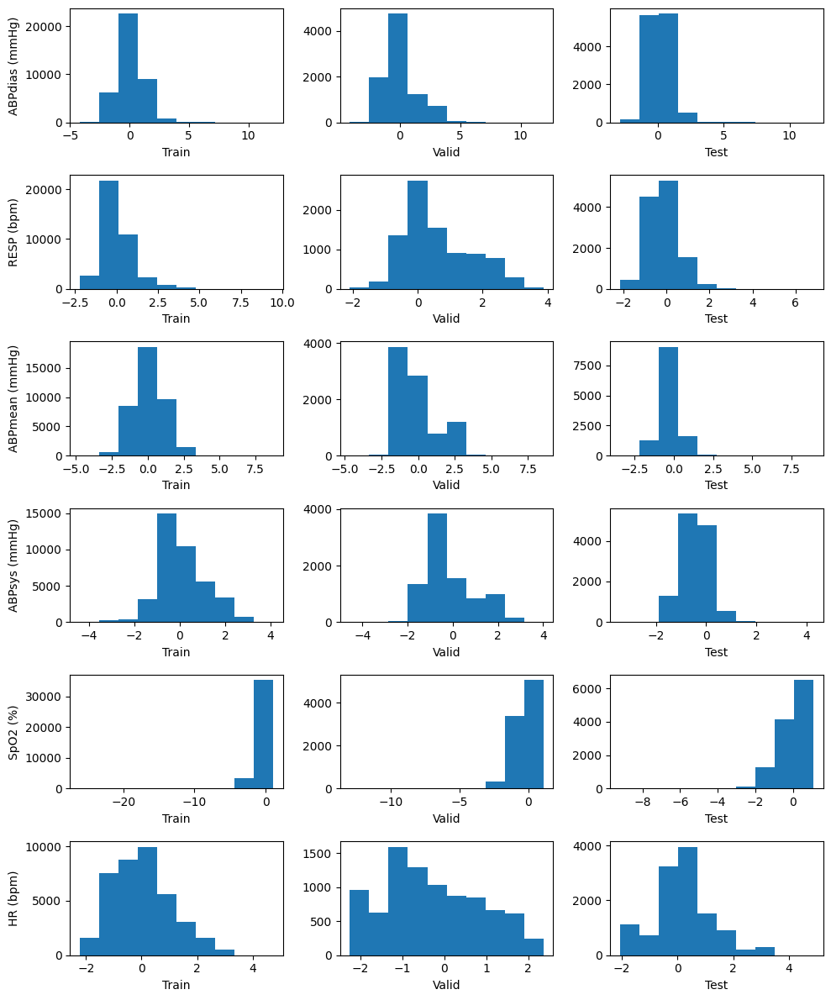

In [72]:
# Make train, validation and test sets
def train_valid_test_split(df, pred_cols):
    df_train, df_valid, df_test = df[df["train"]], df[df["valid"]], df[df["test"]]
    num_pred_cols = len(pred_cols)
    
    # Plot distribution of pred_col for each set
    fig, axes = plt.subplots(num_pred_cols, 3, figsize=(10, 2*num_pred_cols))
    for i, col in enumerate(pred_cols):
        axes[i, 0].hist(df_train[col])
        axes[i, 0].set_xlabel("Train")
        axes[i, 0].set_ylabel(col.split("_")[0])
        axes[i, 1].hist(df_valid[col])
        axes[i, 1].set_xlabel("Valid")
        axes[i, 2].hist(df_test[col])
        axes[i, 2].set_xlabel("Test")
    
    plt.tight_layout()

    return df_train, df_valid, df_test

df_train_1, df_valid_1, df_test_1 = train_valid_test_split(df, pred_cols=pred_cols_1)

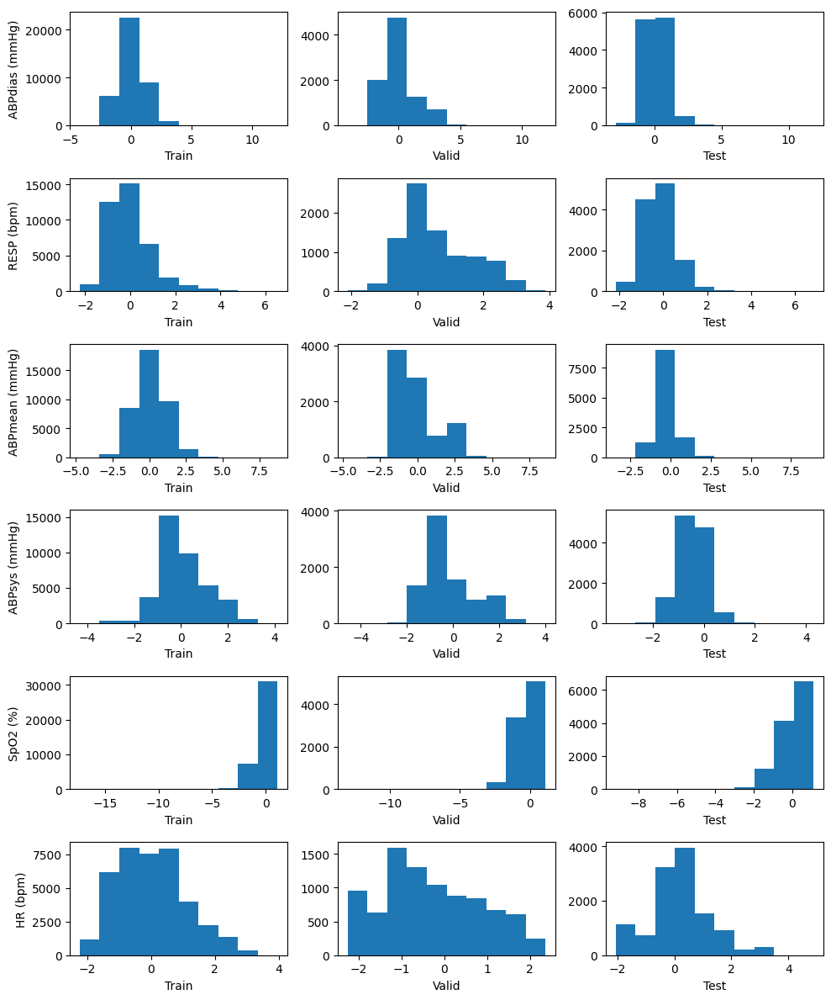

In [73]:
df_train_2, df_valid_2, df_test_2 = train_valid_test_split(df, pred_cols=pred_cols_2)

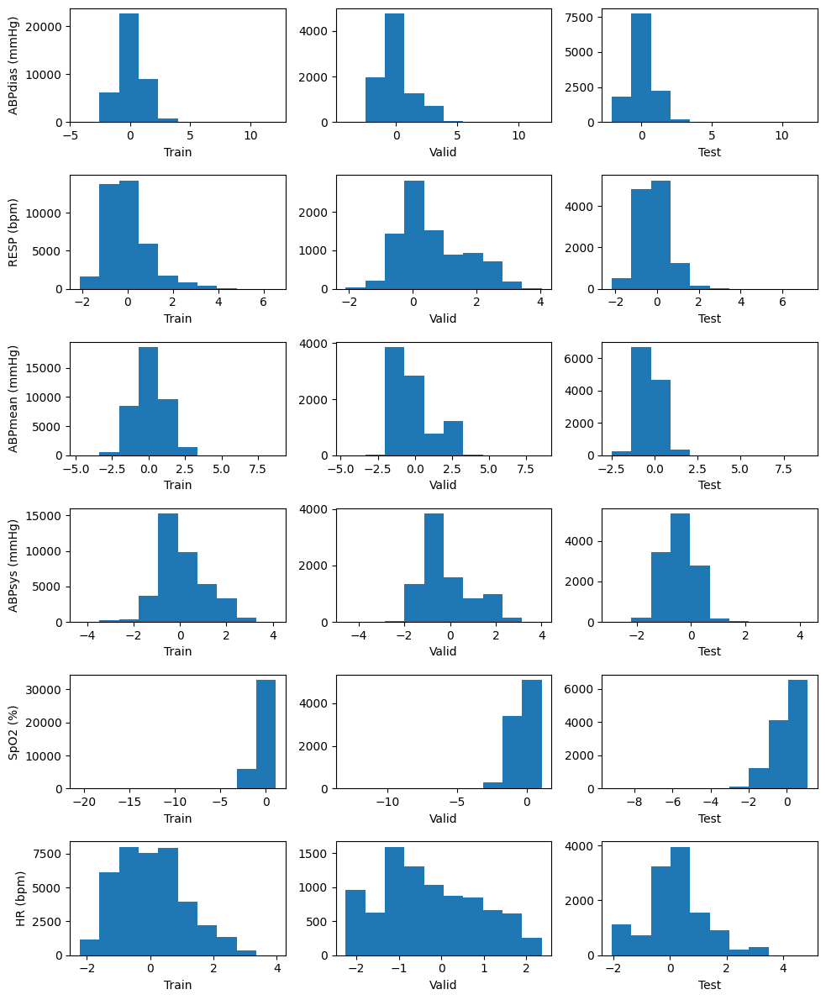

In [74]:
df_train_3, df_valid_3, df_test_3 = train_valid_test_split(df, pred_cols=pred_cols_3)

## Timer Function

In [75]:
class Timer:
    def __init__(self, seed):
        self.seed = seed

    def restart_timer(self):
        self.description = None
        self.start_time = None
        self.end_time = None
        self.duration = None
        
    def start(self, description):
        self.restart_timer()
        self.description = description
        self.start_time = time.time()

    def end(self):
        self.end_time = time.time()
        self.duration = self.end_time-self.start_time
        print(f"{self.description} took {self.duration}s. ")
        self._log_time()

    def _log_time(self):
        with open(fp_time_log, "a+") as myfile:
            myfile.write(f"{self.seed},{self.description},{self.duration}\n")

## RUE

In [9]:
def set_seed(seed):
    tf.config.experimental.enable_op_determinism()
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.random.set_seed(seed)
    np.random.seed(seed)

def display_history(history, show_acc=False):
    if show_acc:
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6, 2.5))
        axes[0].plot(history.history['loss'])
        axes[0].plot(history.history['val_loss'])
        axes[0].set_title('Model Loss')
        axes[0].set_ylabel('Loss')
        axes[0].set_xlabel('Epoch')
        axes[0].legend(['Train', 'Val'], loc='upper left')
        axes[1].plot(history.history['accuracy'])
        axes[1].plot(history.history['val_accuracy'])
        axes[1].set_title('Model Accuracy')
        axes[1].set_ylabel('Accuracy')
        axes[1].set_xlabel('Epoch')
        axes[1].legend(['Train', 'Val'], loc='upper left')
        axes[2].plot(history.history['f1_score'])
        axes[2].plot(history.history['val_f1_score'])
        axes[2].set_title('Model F1 Score')
        axes[2].set_ylabel('F1 Score')
        axes[2].set_xlabel('Epoch')
        axes[2].legend(['Train', 'Val'], loc='upper left')
    else:
        fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(3, 2.5))
        axes.plot(history.history['loss'])
        axes.plot(history.history['val_loss'])
        axes.set_title('Model Loss')
        axes.set_ylabel('Loss')
        axes.set_xlabel('Epoch')
        axes.legend(['Train', 'Val'], loc='upper left')
    plt.tight_layout()
    plt.show()

from keras import regularizers

class AE_Regressor:
    def __init__(self, encoder_width, encoder_depth, decoder_width, decoder_depth, predictors, output_features):
        from keras.layers import Dense, Dropout
        self.predictors = predictors
        self.output_features = output_features
        self.num_predictors = len(self.predictors)
        self.num_outputs = len(self.output_features)
        self.encoder_width = encoder_width
        self.encoder_depth = encoder_depth
        self.decoder_width = decoder_width
        self.decoder_depth = decoder_depth
        
        # Instantiate model layers
        self.inputs = tf.keras.Input(shape=(self.num_predictors,))
        self.encoder = tf.keras.Sequential(list(
            Dense(self.encoder_width, "relu") for i in range(self.encoder_depth) # , kernel_regularizer="l2"
        ), name="encoder")
        self.decoder = tf.keras.Sequential([
            Dense(self.decoder_width, "relu" , kernel_regularizer="l2") for i in range(self.decoder_depth-1) # , kernel_regularizer="l2"
        ]+[Dense(self.num_predictors)], name="decoder")
        self.regressor = tf.keras.Sequential([
            Dropout(rate=0.2),
            Dense(self.num_outputs)
        ], name="regressor")
    
    # Smote is external
    def train_regressor(
        self, train_X, train_y, val_X, val_y, batch_size, max_epochs, verbose, patience):
        from tensorflow.keras.callbacks import EarlyStopping
        # Define regressor
        pred = self.encoder(self.inputs)
        pred = self.regressor(pred)
        self.predictor = tf.keras.Model(inputs=self.inputs, outputs=pred, name="regression_model")
        # Train predictor
        self.predictor.compile(
            loss="mse",
            optimizer=tf.keras.optimizers.Adam()
        )
        es = EarlyStopping(
            monitor='val_loss', mode='min', verbose=1, patience=patience, restore_best_weights=True)
        self.predictor_history = self.predictor.fit(
            train_X, train_y, 
            epochs=max_epochs, 
            validation_data=(val_X, val_y),
            verbose=verbose,
            batch_size=batch_size,
            callbacks=[es],
        )
        print("- Regressor Training History")
        display_history(self.predictor_history)
        best_index = np.argmin(self.predictor_history.history['val_loss'])
        return (
            self.predictor_history.history['val_loss'][best_index], 
            best_index
        )
        
    def train_decoder(
        self, train_X, val_X, batch_size, max_epochs, verbose, patience):
        from tensorflow.keras.callbacks import EarlyStopping
        # Define AE
        self.encoder.trainable=False # Freeze weights
        x = self.encoder(self.inputs)
        x = self.decoder(x)
        self.ae = tf.keras.Model(inputs=self.inputs, outputs=x, name="ae_model")
        # Train AE
        self.ae.compile(
            loss="mse",
            optimizer=tf.keras.optimizers.Adam()
        )
        es = EarlyStopping(
            monitor='val_loss', mode='min', verbose=1, patience=patience, restore_best_weights=True)
        self.ae_history = self.ae.fit(
            train_X, train_X, 
            epochs=max_epochs, 
            validation_data=(val_X, val_X),
            verbose=verbose,
            batch_size=batch_size,
            callbacks=[es]
        )
        print("- Autoencoder Training History")
        display_history(self.ae_history)
        best_epoch = np.argmin(self.ae_history.history['val_loss'])
        return self.ae_history.history['val_loss'][best_epoch], best_epoch

    def replace_encoder_predictor(self, prev_model):
        self.encoder = prev_model.encoder
        self.regressor = prev_model.regressor
        self.encoder_width = prev_model.encoder_width
        self.encoder_depth = prev_model.encoder_depth

    def predict(self, inputs, with_mae=True, weighted=False, dropout_activated=False):
        # Encode
        encoder_output = self.encoder(inputs)
        
        # Get forecast result
        regressor_output = self.regressor(encoder_output, training=dropout_activated)
        if with_mae:
            # Reconstruct
            decoder_output = self.decoder(encoder_output)
            return regressor_output, decoder_output
        else:
            return regressor_output

    def get_config(self):
        return dict(
            encoder_width=self.encoder_width, 
            encoder_depth=self.encoder_depth, 
            decoder_width=self.decoder_width, 
            decoder_depth=self.decoder_depth, 
            predictors=self.predictors, 
            output_features=self.output_features
        )
        
def save_model(model, name, fp_checkpoints, override=False):
    import pickle
    model_folder = os.path.join(fp_checkpoints, name)
    if os.path.exists(model_folder):
        print("Model checkpoint already exists!")
        if not override:
            return
    else:
        os.makedirs(model_folder)
    
    # Save Parameters
    parameters_to_save = model.get_config()
    parameter_filename = os.path.join(fp_checkpoints, name, "parameters.pickle")
    with open(parameter_filename, 'wb') as handle:
        pickle.dump(parameters_to_save, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    # Save Model
    inputs = model.inputs
    encoder_output = model.encoder(inputs)
    decoder_output = model.decoder(encoder_output)
    regressor_output = model.regressor(encoder_output)
    model = tf.keras.Model(inputs, [regressor_output, decoder_output])
    model_filename = os.path.join(fp_checkpoints, name, "model.h5")
    model.save(model_filename)
    print("Model saved!")

def load_model(name, fp_checkpoints): 
    import pickle
    model_folder = os.path.join(fp_checkpoints, name)
    parameter_filename = os.path.join(fp_checkpoints, name, "parameters.pickle")
    model_filename = os.path.join(fp_checkpoints, name, "model.h5")
    
    if not os.path.exists(model_folder):
        print("model checkpoint does not exist!")
        return
    model = tf.keras.models.load_model(model_filename)
    with open(parameter_filename, 'rb') as handle:
        parameters = pickle.load(handle)
    
    ae_regressor = AE_Regressor(**parameters)
    ae_regressor.encoder = model.get_layer("encoder")
    ae_regressor.decoder = model.get_layer("decoder")
    ae_regressor.regressor = model.get_layer("regressor")
    
    return ae_regressor

def model_tuning_regressor(
    param_grid, predictors, pred_cols, train_df, valid_df, seed,
    batch_size=128, max_epochs=5000, verbose=1, patience=10):
    train_X, train_y = (
        train_df[predictors].values.astype('float32'), train_df[pred_cols].values.astype('float32'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float32'), valid_df[pred_cols].values.astype('float32'))
    loss_list = []
    epoch_list = []
    time_spent_list = []
    tuning_df_list = []
    parameter_list = list(ParameterGrid(param_grid))
    pbar = tqdm(parameter_list)
    for param_dict in pbar:
        pbar.set_description(f"{param_dict}")
        set_seed(seed)
        regressor = AE_Regressor(**param_dict, predictors=predictors, output_features=pred_cols)
        start = time.time()
        val_loss, best_epoch = regressor.train_regressor(
            train_X, train_y, valid_X, valid_y, batch_size, max_epochs, verbose, patience)
        cur_param_dict = param_dict.copy()
        cur_param_dict["loss"] = val_loss
        cur_param_dict["epochs"] = best_epoch
        cur_param_dict["time/s"] = time.time()-start
        tuning_df_list.append(cur_param_dict)
    tuning_df = pd.DataFrame(tuning_df_list)
    best_param_idx = tuning_df['loss'].idxmin()
    tuning_df["best_hyperparameter"] = [True if i==best_param_idx else False for i in range(len(tuning_df))]
    best_param = parameter_list[best_param_idx]
    return tuning_df, best_param

def get_model_error_corr(predictor, x, y):
    y_pred, x_pred = predictor.predict(x)
    rue = np.mean(np.abs(x-x_pred), axis=-1)
    mae = np.mean(np.abs(y-y_pred), axis=-1)
    corr, pvalue = pearsonr(mae, rue)
    return corr

def model_tuning_decoder(
    param_grid, predictors, pred_cols, train_df, valid_df, seed, prev_model,
    atch_size=128, max_epochs=5000, verbose=1, patience=10):
    train_X, train_y = (
        train_df[predictors].values.astype('float32'), train_df[pred_cols].values.astype('float32'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float32'), valid_df[pred_cols].values.astype('float32'))
    tuning_df_list = []
    parameter_list = list(ParameterGrid(param_grid))
    best_corr = -np.inf
    pbar = tqdm(parameter_list)
    for param_dict in pbar:
        pbar.set_description(f"{param_dict}, best corr: {best_corr:.5f}")
        set_seed(seed)
        predictor = AE_Regressor(**param_dict, predictors=predictors, output_features=pred_cols)
        predictor.replace_encoder_predictor(prev_model)
        start = time.time()
        val_loss, best_epoch = predictor.train_decoder(
            train_X, valid_X, batch_size, max_epochs, verbose, patience)
        timing = time.time()-start
        corr = get_model_error_corr(predictor, valid_X, valid_y)
        cur_param_dict = param_dict.copy()
        cur_param_dict["loss"] = val_loss
        cur_param_dict["corr"] = corr
        cur_param_dict["epochs"] = best_epoch
        cur_param_dict["time/s"] = timing
        tuning_df_list.append(cur_param_dict)
        best_corr = max(corr, best_corr)
    tuning_df = pd.DataFrame(tuning_df_list)
    best_param_idx = tuning_df["corr"].idxmax()
    tuning_df["best_hyperparameter"] = [True if i==best_param_idx else False for i in range(len(tuning_df))]
    best_param = parameter_list[best_param_idx]
    return tuning_df, best_param

def model_training(
    hp_dict, predictors, pred_cols, train_df, valid_df, seed,
    batch_size=128, max_epochs=5000, verbose=1, patience=10):
    set_seed(seed)
    timer = Timer(seed)
    
    # Get data
    train_X, train_y = (
        train_df[predictors].values.astype('float32'), train_df[pred_cols].values.astype('float32'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float32'), valid_df[pred_cols].values.astype('float32'))
    
    # Train Regressor
    ae_regressor = AE_Regressor(**hp_dict, predictors=predictors, output_features=pred_cols)
    timer.start(description="Training Encoder and Predictor")
    valid_loss_regressor, best_epoch = ae_regressor.train_regressor(
        train_X, train_y, valid_X, valid_y, 
        batch_size, max_epochs, verbose, patience)
    timer.end()
    
    # Train decoder
    timer.start(description="Training Decoder")
    valid_loss_ae = ae_regressor.train_decoder(
        train_X, valid_X, batch_size, max_epochs, verbose, patience)
    timer.end()
    return ae_regressor

def model_training_predictor(
    hp_dict, predictors, pred_cols, train_df, valid_df, seed,
    batch_size=128, max_epochs=5000, verbose=1, patience=10):
    
    from tqdm import tqdm
    import time
    set_seed(seed)
    
    # Get data
    train_X, train_y = (
        train_df[predictors].values.astype('float32'), train_df[pred_cols].values.astype('float32'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float32'), valid_df[pred_cols].values.astype('float32'))
    
    # Train Regressor
    ae_regressor = AE_Regressor(**hp_dict, predictors=predictors, output_features=pred_cols)
    
    start = time.time()
    # Train classifier
    valid_loss_regressor, best_epoch = ae_regressor.train_regressor(
        train_X, train_y, valid_X, valid_y, 
        batch_size, max_epochs, verbose, patience)
    
    # Train decoder
    # valid_loss_ae = ae_regressor.train_decoder(
    #     train_X, valid_X, batch_size, max_epochs, verbose, patience)
    
    print(f"Training took {time.time()-start}s.")
    return ae_regressor

def model_training_decoder(
    hp_dict, predictors, pred_cols, train_df, valid_df, seed, prev_model, 
    batch_size=128, max_epochs=5000, verbose=1, patience=10):
    
    from tqdm import tqdm
    import time
    set_seed(seed)
    
    # Get data
    train_X, train_y = (
        train_df[predictors].values.astype('float32'), train_df[pred_cols].values.astype('float32'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float32'), valid_df[pred_cols].values.astype('float32'))
    
    # Train Regressor
    ae_regressor = AE_Regressor(**hp_dict, predictors=predictors, output_features=pred_cols)
    ae_regressor.replace_encoder_predictor(prev_model)
    
    start = time.time()
    # Train classifier
    # valid_loss_regressor, best_epoch = ae_regressor.train_regressor(
    #     train_X, train_y, valid_X, valid_y, 
    #     batch_size, max_epochs, verbose, patience)
    
    # Train decoder
    valid_loss_ae = ae_regressor.train_decoder(
        train_X, valid_X, batch_size, max_epochs, verbose, patience)
    
    print(f"Training took {time.time()-start}s.")
    return ae_regressor

def model_test_predictions(
    ae_regressor, df_train, df_test, pred_cols, predictors, regressor_label, pred_min, T=10, seed=seed):
    df_test = df_test.copy()
    set_seed(seed)
    timer = Timer(seed)
    test_X, test_y = (
        df_test[predictors].values.astype('float32'), df_test[pred_cols].values.astype('float32'))
    
    # MAE
    timer.start(description="Predicting with Decoder + Predictor")
    test_y_pred, test_X_reconstruction = ae_regressor.predict(inputs=test_X)
    timer.end()
    # - Add to df
    predicted_colnames = [col+"_direct"+regressor_label for col in pred_cols]
    reconstruction_colnames = [col+"_reconstruction"+regressor_label for col in predictors]
    rue_colname = "rue"
    df_test[predicted_colnames] = test_y_pred
    df_test[reconstruction_colnames] = test_X_reconstruction
    df_test[rue_colname] = np.mean(np.abs(test_X_reconstruction-test_X), axis=1)
    
    # For MC Dropout
    # - Sample with dropout
    timer.start(description="Predicting with MC Dropout")
    test_y_sample_preds = []
    for i in range(T):
        test_y_pred = ae_regressor.predict(inputs=test_X, dropout_activated=True, with_mae=False)
        test_y_sample_preds.append(test_y_pred)
    timer.end()
    test_y_sample_preds = np.array(test_y_sample_preds)
    test_y_sample_preds =  test_y_sample_preds.transpose((1, 2, 0))
    # - Get mean and std of all sample predictions
    test_y_mean_pred = np.mean(test_y_sample_preds, axis=-1)
    test_y_std_pred = np.std(test_y_sample_preds, axis=-1, ddof=1)

    # - Add to df
    predicted_mean_colnames = [col+"_mean"+regressor_label for col in pred_cols]
    predicted_std_colnames = [col+"_std"+regressor_label for col in pred_cols]
    mcd_colname = "mcd"
    df_test[predicted_mean_colnames] = test_y_mean_pred
    df_test[predicted_std_colnames] = test_y_std_pred
    df_test[mcd_colname] = np.mean(test_y_std_pred, axis=-1)
    
    if df_test['target_index'].dtype != "int64":
        df_test['target_index'] = df_test['target_index'].apply(lambda x: eval(x)[pred_min-1])
    
    return df_test

### Tune and Train Predictor

#### Tune Predictor

In [ ]:
rue_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
# all_rue_best_hp = {}
for time_label, time_info_dict in tqdm(rue_dict.items(), total=len(rue_dict)):
    rue_tuning_df, rue_best_hp = model_tuning_regressor(
        param_grid=dict(
            encoder_width = [256, 512, 1028], # , 256, 512
            encoder_depth = [1, 2, 3], #  3, 4
            decoder_width = [128],
            decoder_depth = [2]
        ), predictors=predictors, pred_cols=time_info_dict["outputs"], 
        train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], seed=seed,
        batch_size=batch_size, max_epochs=10000, verbose=1, patience=20
    )
    display(rue_tuning_df)
    rue_tuning_df.to_csv(os.path.join(fp_tuning, str(seed), f"tuning_rue_{time_label}.csv"))
    all_rue_best_hp[time_label] = rue_best_hp
joblib.dump(all_rue_best_hp, os.path.join(fp_tuning, str(seed), "all_rue_predictor_best_hp.joblib"))

In [108]:
all_rue_predictor_best_hp = joblib.load(os.path.join(fp_tuning, str(seed), "all_rue_predictor_best_hp.joblib"))

#### Train Predictor

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1568 - val_loss: 0.1084
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0913 - val_loss: 0.1059
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0879 - val_loss: 0.1067
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0858 - val_loss: 0.1065
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0860 - val_loss: 0.1048
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0845 - val_loss: 0.1052
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0845 - val_loss: 0.1069
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0829 - val_loss: 0.1058
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0827 - val_loss: 0.1063
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0832 - val_loss: 0.1056
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0826 - val_loss: 0.1085

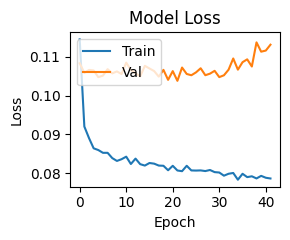

Training took 21.694536209106445s.
Model checkpoint already exists!
Model saved!
Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2280 - val_loss: 0.1510
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.1223 - val_loss: 0.1465
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.1169 - val_loss: 0.1441
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.1145 - val_loss: 0.1455
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.1131 - val_loss: 0.1474
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.1122 - val_loss: 0.1451
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.1119 - val_loss: 0.1465
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.1127 - val_loss: 0.1466
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.1116 - val_loss: 0.1444
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.1098 - val_loss: 0.1471
Epoch 11/1

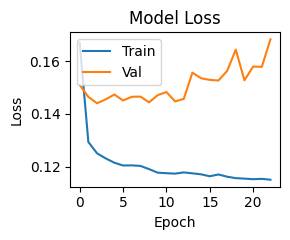

Training took 13.13653016090393s.
Model checkpoint already exists!
Model saved!
Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2579 - val_loss: 0.1728
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.1539 - val_loss: 0.1682
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.1472 - val_loss: 0.1660
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.1453 - val_loss: 0.1688
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.1430 - val_loss: 0.1717
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.1428 - val_loss: 0.1707
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step - loss: 0.1417 - val_loss: 0.1692
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.1423 - val_loss: 0.1706
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.1415 - val_loss: 0.1685
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.1399 - val_loss: 0.1704
Epoch 11/10

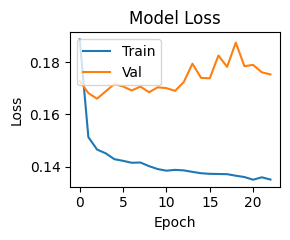

Training took 12.442396640777588s.
Model checkpoint already exists!
Model saved!


In [127]:
rue_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
all_rue_decoder_best_hp = {}
for time_label, time_info_dict in tqdm(rue_dict.items(), total=len(rue_dict)):
    best_predictor_hp = all_rue_predictor_best_hp[time_label]
    ae_regressor = model_training_predictor(
        best_predictor_hp, predictors=predictors, pred_cols=time_info_dict["outputs"], 
        train_df=time_info_dict["train_df"], valid_df = time_info_dict["valid_df"], seed=seed,
        batch_size=batch_size, max_epochs=10000, verbose=1, patience=20
    ) 
    save_model(model=ae_regressor, name=f"rue_predictor_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)), override=True)

### Tune and Train Decoder

#### Tune Decoder

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1080 - val_loss: 0.0206
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0108 - val_loss: 0.0124
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0065 - val_loss: 0.0094
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0050 - val_loss: 0.0080
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0042 - val_loss: 0.0072
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0037 - val_loss: 0.0067
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step - loss: 0.0034 - val_loss: 0.0063
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0032 - val_loss: 0.0060
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0031 - val_loss: 0.0058
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0030 - val_loss: 0.0056
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 713us/step - loss: 0.0029 - val_loss: 0.0055

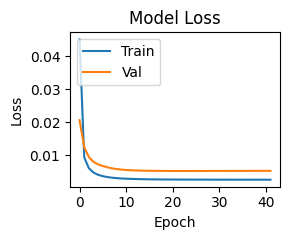

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1080 - val_loss: 0.0206
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.0108 - val_loss: 0.0124
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step - loss: 0.0065 - val_loss: 0.0094
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 650us/step - loss: 0.0050 - val_loss: 0.0080
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0042 - val_loss: 0.0072
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step - loss: 0.0037 - val_loss: 0.0067
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 616us/step - loss: 0.0034 - val_loss: 0.0063
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 0.0032 - val_loss: 0.0060
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 632us/step - loss: 0.0031 - val_loss: 0.0058
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0030 - val_loss: 0.0056
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 0.0029 - val_loss: 0.0055

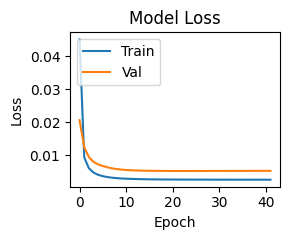

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1080 - val_loss: 0.0206
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0108 - val_loss: 0.0124
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0065 - val_loss: 0.0094
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 627us/step - loss: 0.0050 - val_loss: 0.0080
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step - loss: 0.0042 - val_loss: 0.0072
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 633us/step - loss: 0.0037 - val_loss: 0.0067
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 616us/step - loss: 0.0034 - val_loss: 0.0063
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step - loss: 0.0032 - val_loss: 0.0060
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 629us/step - loss: 0.0031 - val_loss: 0.0058
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 620us/step - loss: 0.0030 - val_loss: 0.0056
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step - loss: 0.0029 - val_loss: 0.0055

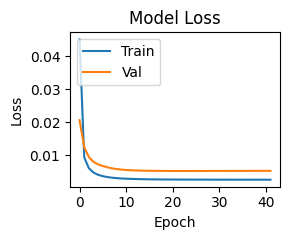

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7266 - val_loss: 0.0721
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0527 - val_loss: 0.0643
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0467 - val_loss: 0.0548
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0431 - val_loss: 0.0503
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0410 - val_loss: 0.0487
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0391 - val_loss: 0.0467
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 671us/step - loss: 0.0378 - val_loss: 0.0438
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 660us/step - loss: 0.0365 - val_loss: 0.0430
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 638us/step - loss: 0.0359 - val_loss: 0.0422
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step - loss: 0.0353 - val_loss: 0.0411
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0349 - val_loss: 0.0412

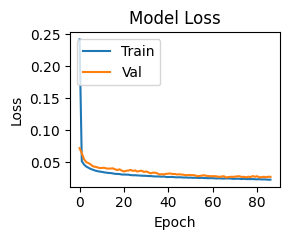

Epoch 1/10000
161/606 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 2.1334

2024-10-15 13:57:57.808303: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_248_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8970  

2024-10-15 13:57:58.784549: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_248_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.8960 - val_loss: 0.0733
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step - loss: 0.0541 - val_loss: 0.0611
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0492 - val_loss: 0.0587
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0464 - val_loss: 0.0552
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0448 - val_loss: 0.0527
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0429 - val_loss: 0.0518
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0418 - val_loss: 0.0507
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0405 - val_loss: 0.0494
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0395 - val_loss: 0.0497
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0384 - val_loss: 0.0475
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0378 - val_loss: 0.0499
Epoch 12/1000

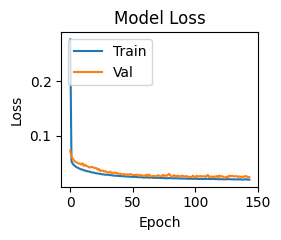

Epoch 1/10000
157/606 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 2.4531

2024-10-15 13:59:02.429789: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9848  

2024-10-15 13:59:03.427532: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.9837 - val_loss: 0.0775
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0589 - val_loss: 0.0702
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0547 - val_loss: 0.0631
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - loss: 0.0517 - val_loss: 0.0619
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0486 - val_loss: 0.0597
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0465 - val_loss: 0.0592
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0445 - val_loss: 0.0559
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0429 - val_loss: 0.0571
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0418 - val_loss: 0.0565
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0405 - val_loss: 0.0534
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 0.0393 - val_loss: 0.0525
Epoch 12/1000

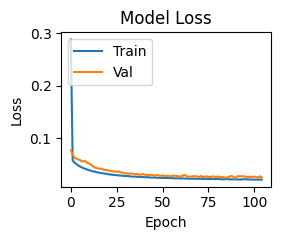

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1.2464 - val_loss: 0.1252
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0921 - val_loss: 0.1137
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0838 - val_loss: 0.1081
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0794 - val_loss: 0.1038
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0766 - val_loss: 0.1012
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0744 - val_loss: 0.1000
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0725 - val_loss: 0.0969
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step - loss: 0.0702 - val_loss: 0.0958
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step - loss: 0.0685 - val_loss: 0.0940
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0671 - val_loss: 0.0918
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0661 - val_loss: 0.0893
E

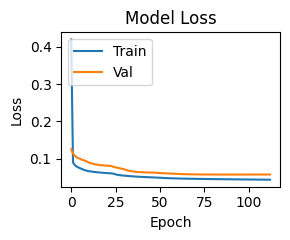

Epoch 1/10000
123/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.6849   

2024-10-15 14:00:43.946645: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_312_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6721

2024-10-15 14:00:45.020183: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_312_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1.6701 - val_loss: 0.1214
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0892 - val_loss: 0.1087
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 666us/step - loss: 0.0813 - val_loss: 0.1031
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0771 - val_loss: 0.1005
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0744 - val_loss: 0.1002
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0717 - val_loss: 0.0973
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0692 - val_loss: 0.0949
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0674 - val_loss: 0.0924
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0662 - val_loss: 0.0914
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 0.0653 - val_loss: 0.0893
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 0.0648 - val_loss: 0.0884
Epoch 12/1000

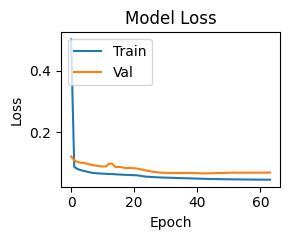

Epoch 1/10000
135/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6.0347

2024-10-15 14:01:14.616153: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_310_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1513  

2024-10-15 14:01:15.871631: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_310_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 2.1487 - val_loss: 0.1186
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0874 - val_loss: 0.1067
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0797 - val_loss: 0.1014
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0757 - val_loss: 0.0989
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.0729 - val_loss: 0.0971
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0697 - val_loss: 0.0931
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0673 - val_loss: 0.0909
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0661 - val_loss: 0.0893
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0652 - val_loss: 0.0879
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0653 - val_loss: 0.0928
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0669 - val_loss: 0.0889
Epoch 12/1000

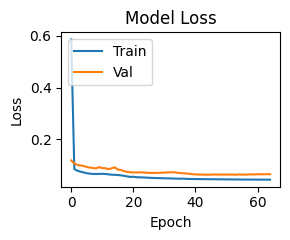

,decoder_depth,decoder_width,encoder_depth,encoder_width,loss,corr,epochs,time/s,best_hyperparameter
0,1,256,1,512,0.005207,0.287454,21,18.858324,False
1,1,512,1,512,0.005207,0.287454,21,19.510901,False
2,1,1028,1,512,0.005207,0.287454,21,19.136954,False
3,2,256,1,512,0.026360,0.336789,66,40.094309,True
4,2,512,1,512,0.023787,0.315189,123,64.561071,False
5,2,1028,1,512,0.025284,0.319686,84,48.576941,False
6,3,256,1,512,0.057172,0.319824,92,52.799977,False
7,3,512,1,512,0.065892,0.234857,43,30.466766,False
8,3,1028,1,512,0.063390,0.263767,44,35.056233,False


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1482 - val_loss: 0.0269
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0157 - val_loss: 0.0155
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0092 - val_loss: 0.0121
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0071 - val_loss: 0.0106
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0061 - val_loss: 0.0098
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0051 - val_loss: 0.0091
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0049 - val_loss: 0.0089
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0047 - val_loss: 0.0088
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0046 - val_loss: 0.0087
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0045 - val_loss: 0.0087

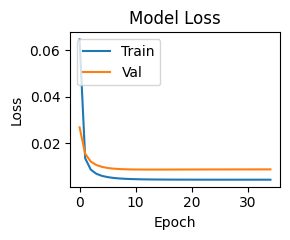

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1482 - val_loss: 0.0269
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0157 - val_loss: 0.0155
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0092 - val_loss: 0.0121
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0071 - val_loss: 0.0106
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0061 - val_loss: 0.0098
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 649us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 636us/step - loss: 0.0051 - val_loss: 0.0091
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - loss: 0.0049 - val_loss: 0.0089
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0047 - val_loss: 0.0088
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - loss: 0.0046 - val_loss: 0.0087
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - loss: 0.0045 - val_loss: 0.0087

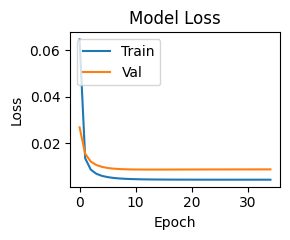

Epoch 1/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1482 - val_loss: 0.0269
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0157 - val_loss: 0.0155
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0092 - val_loss: 0.0121
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0071 - val_loss: 0.0106
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0061 - val_loss: 0.0098
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0051 - val_loss: 0.0091
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0049 - val_loss: 0.0089
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0047 - val_loss: 0.0088
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0046 - val_loss: 0.0087
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0045 - val_loss: 0.0087

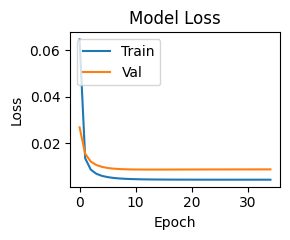

Epoch 1/10000
176/606 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 1.3930

2024-10-15 14:02:38.108183: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_248_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6626  

2024-10-15 14:02:38.977573: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_248_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.6619 - val_loss: 0.0737
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0556 - val_loss: 0.0613
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0481 - val_loss: 0.0543
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0438 - val_loss: 0.0493
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0407 - val_loss: 0.0462
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0384 - val_loss: 0.0437
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0367 - val_loss: 0.0421
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0353 - val_loss: 0.0406
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0342 - val_loss: 0.0394
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0334 - val_loss: 0.0385
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0325 - val_loss: 0.0380
Epoch 12/10000


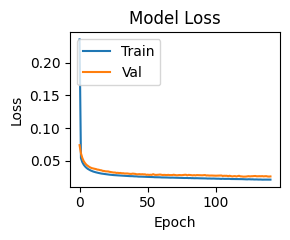

Epoch 1/10000
146/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.7224  

2024-10-15 14:03:41.354047: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7101  

2024-10-15 14:03:42.304643: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7093 - val_loss: 0.0715
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0537 - val_loss: 0.0615
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0475 - val_loss: 0.0564
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0439 - val_loss: 0.0530
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0413 - val_loss: 0.0510
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0395 - val_loss: 0.0486
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0380 - val_loss: 0.0480
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0370 - val_loss: 0.0452
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step - loss: 0.0358 - val_loss: 0.0440
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0351 - val_loss: 0.0427
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0345 - val_loss: 0.0416
Epoch 12/1000

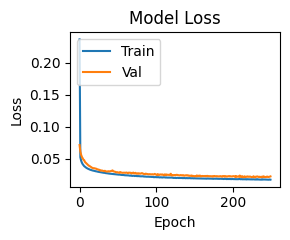

Epoch 1/10000
171/606 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 1.5627

2024-10-15 14:05:29.174874: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6820  

2024-10-15 14:05:30.180719: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.6813 - val_loss: 0.0750
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0553 - val_loss: 0.0640
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0493 - val_loss: 0.0597
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0464 - val_loss: 0.0558
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0441 - val_loss: 0.0543
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0427 - val_loss: 0.0524
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 676us/step - loss: 0.0412 - val_loss: 0.0506
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0402 - val_loss: 0.0494
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0392 - val_loss: 0.0477
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step - loss: 0.0381 - val_loss: 0.0471
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 0.0373 - val_loss: 0.0454
Epoch 12/1000

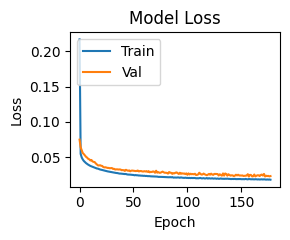

Epoch 1/10000
199/606 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 2.3446

2024-10-15 14:06:47.685632: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_312_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1853  

2024-10-15 14:06:48.587262: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_312_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1.1840 - val_loss: 0.1347
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0979 - val_loss: 0.1215
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0888 - val_loss: 0.1138
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0841 - val_loss: 0.1092
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0810 - val_loss: 0.1062
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0788 - val_loss: 0.1038
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0771 - val_loss: 0.1023
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0757 - val_loss: 0.1011
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0745 - val_loss: 0.0997
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0735 - val_loss: 0.0989
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0726 - val_loss: 0.0983
Epoch 12/10000


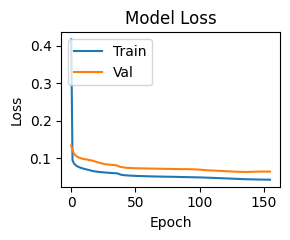

Epoch 1/10000
124/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.0550

2024-10-15 14:08:01.362613: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_310_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4844

2024-10-15 14:08:02.622641: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_310_1', 32 bytes spill stores, 32 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1.4827 - val_loss: 0.1342
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0954 - val_loss: 0.1189
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0866 - val_loss: 0.1122
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 0.0820 - val_loss: 0.1080
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0789 - val_loss: 0.1047
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0767 - val_loss: 0.1025
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0750 - val_loss: 0.1008
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 0.0736 - val_loss: 0.0997
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0723 - val_loss: 0.0989
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0710 - val_loss: 0.0968
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0693 - val_loss: 0.0971
Epoch 12/1000

In [ ]:
rue_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
all_rue_decoder_best_hp = {}
for time_label, time_info_dict in tqdm(rue_dict.items(), total=len(rue_dict)):
    best_predictor_hp = all_rue_predictor_best_hp[time_label]
    prev_model = load_model(name=f"rue_predictor_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
    rue_tuning_df, rue_best_hp = model_tuning_decoder(
        param_grid=dict(
            encoder_width = [best_predictor_hp["encoder_width"]], # , 256, 512
            encoder_depth = [best_predictor_hp["encoder_depth"]], #  3, 4
            decoder_width = [256, 512, 1028], 
            decoder_depth = [1, 2, 3]
        ), predictors=predictors, pred_cols=time_info_dict["outputs"], 
        train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], seed=seed,
        max_epochs=10000, verbose=1, patience=20, prev_model=prev_model
    )
    display(rue_tuning_df)
    rue_tuning_df.to_csv(os.path.join(fp_tuning, str(seed), f"tuning_rue_decoder_{time_label}.csv"))
    all_rue_decoder_best_hp[time_label] = rue_best_hp
joblib.dump(all_rue_decoder_best_hp, os.path.join(fp_tuning, str(seed), "all_rue_decoder_best_hp.joblib"))

In [ ]:
# With Regularisation (L2=0.01) and MSE: 0.33679
# With Regularisation and MAE: 0.296979
# Without Regularisation and MSE: 0.274257
# With Regularisation (L1) and MSE: 0.317686	
# With Regularisation (L2=) and MSE: 0.312463	

In [12]:
all_rue_decoder_best_hp = joblib.load(os.path.join(fp_tuning, str(seed), "all_rue_decoder_best_hp.joblib"))
all_rue_decoder_best_hp

{'t+1': {'decoder_depth': 2,
  'decoder_width': 256,
  'encoder_depth': 1,
  'encoder_width': 512},
 't+2': {'decoder_depth': 3,
  'decoder_width': 512,
  'encoder_depth': 1,
  'encoder_width': 256},
 't+3': {'decoder_depth': 2,
  'decoder_width': 1028,
  'encoder_depth': 1,
  'encoder_width': 256}}

#### Train Decoder

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1/10000


I0000 00:00:1728977307.046080  245499 service.cc:146] XLA service 0x72f9c4004d40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728977307.046139  245499 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
I0000 00:00:1728977307.046143  245499 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 4090, Compute Capability 8.9
I0000 00:00:1728977307.046146  245499 service.cc:154]   StreamExecutor device (2): NVIDIA GeForce RTX 4090, Compute Capability 8.9
I0000 00:00:1728977307.046148  245499 service.cc:154]   StreamExecutor device (3): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-10-15 14:28:27.064561: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-10-15 14:28:27.120379: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8902
2024-

141/606 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.7548  

2024-10-15 14:28:27.606468: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads

I0000 00:00:1728977307.609828  245499 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6826  

2024-10-15 14:28:28.672530: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_246_1', 24 bytes spill stores, 24 bytes spill loads



606/606 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.6818 - val_loss: 0.0748
Epoch 2/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0564 - val_loss: 0.0650
Epoch 3/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0505 - val_loss: 0.0604
Epoch 4/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0474 - val_loss: 0.0571
Epoch 5/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0451 - val_loss: 0.0538
Epoch 6/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0435 - val_loss: 0.0517
Epoch 7/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0422 - val_loss: 0.0512
Epoch 8/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0409 - val_loss: 0.0504
Epoch 9/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0399 - val_loss: 0.0487
Epoch 10/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0386 - val_loss: 0.0468
Epoch 11/10000
606/606 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0378 - val_loss: 0.0456
Epoch 12/1000

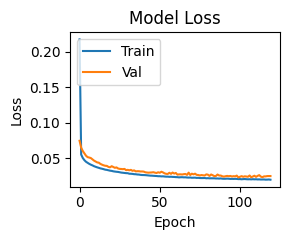

Training took 52.910237073898315s.


Model saved!


In [13]:
rue_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(rue_dict.items(), total=len(rue_dict)):
    prev_model = load_model(name=f"rue_predictor_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
    hp_dict = all_rue_decoder_best_hp[time_label]
    ae_regressor = model_training_decoder(
        hp_dict, predictors=predictors, pred_cols=time_info_dict["outputs"], 
        train_df=time_info_dict["train_df"], valid_df = time_info_dict["valid_df"], seed=seed, prev_model=prev_model,
        batch_size=batch_size, max_epochs=10000, verbose=1, patience=20
    ) 
    save_model(model=ae_regressor, name=f"rue_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)), override=True)

### Prediction

In [42]:
rue_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(rue_dict.items(), total=len(rue_dict)):
    ae_regressor = load_model(name=f"rue_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
    rue_valid_df = model_test_predictions(
        ae_regressor, df_train=time_info_dict["train_df"], df_test=time_info_dict["valid_df"], 
        pred_cols=time_info_dict["outputs"], predictors=predictors, regressor_label="_"+time_label, pred_min=int(time_label[-1]), T=10, seed=seed)
    rue_test_df = model_test_predictions(
        ae_regressor, df_train=time_info_dict["train_df"], df_test=time_info_dict["test_df"], 
        pred_cols=time_info_dict["outputs"], predictors=predictors, regressor_label="_"+time_label, pred_min=int(time_label[-1]), T=10, seed=seed)
    display(rue_test_df)
    rue_valid_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"rue_valid_{time_label[-1]}.csv"))
    rue_test_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"rue_test_{time_label[-1]}.csv"))

  0%|          | 0/3 [00:00<?, ?it/s]

Predicting with Decoder + Predictor took 0.009669780731201172s. 
Predicting with MC Dropout took 0.04574179649353027s. 
Predicting with Decoder + Predictor took 0.010782718658447266s. 
Predicting with MC Dropout took 0.05067801475524902s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,ABPsys (mmHg)_mean PredMin1_mean_t+1,SpO2 (%)_mean PredMin1_mean_t+1,HR (bpm)_mean PredMin1_mean_t+1,ABPdias (mmHg)_mean PredMin1_std_t+1,RESP (bpm)_mean PredMin1_std_t+1,ABPmean (mmHg)_mean PredMin1_std_t+1,ABPsys (mmHg)_mean PredMin1_std_t+1,SpO2 (%)_mean PredMin1_std_t+1,HR (bpm)_mean PredMin1_std_t+1,mcd
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,-0.777862,0.895459,0.903886,0.071985,0.050429,0.062471,0.053287,0.085679,0.083559,0.067902
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,-0.847176,0.821804,0.847113,0.049002,0.050977,0.050854,0.091840,0.078016,0.091845,0.068756
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,-0.802820,0.887341,0.913879,0.059195,0.063944,0.062996,0.078006,0.123839,0.042318,0.071716
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,-0.744339,0.779288,0.933352,0.047794,0.061806,0.067205,0.048298,0.084883,0.086563,0.066092
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,-0.789677,0.733054,0.926621,0.086122,0.082847,0.059090,0.068986,0.107659,0.064862,0.078261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,-0.768694,-0.513204,-1.629671,0.055558,0.086545,0.073560,0.105372,0.068796,0.100771,0.081767
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,-0.535801,-0.818079,-1.494005,0.099550,0.065220,0.072758,0.075945,0.078067,0.101723,0.082210
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,-0.518928,-0.373663,-1.697685,0.052512,0.069596,0.040832,0.073100,0.053502,0.068349,0.059649
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,-0.563908,-0.404148,-1.711232,0.079313,0.064075,0.062381,0.059181,0.087619,0.092678,0.074208


Predicting with Decoder + Predictor took 0.010506629943847656s. 
Predicting with MC Dropout took 0.04476642608642578s. 
Predicting with Decoder + Predictor took 0.010745763778686523s. 
Predicting with MC Dropout took 0.05030179023742676s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,ABPsys (mmHg)_mean PredMin2_mean_t+2,SpO2 (%)_mean PredMin2_mean_t+2,HR (bpm)_mean PredMin2_mean_t+2,ABPdias (mmHg)_mean PredMin2_std_t+2,RESP (bpm)_mean PredMin2_std_t+2,ABPmean (mmHg)_mean PredMin2_std_t+2,ABPsys (mmHg)_mean PredMin2_std_t+2,SpO2 (%)_mean PredMin2_std_t+2,HR (bpm)_mean PredMin2_std_t+2,mcd
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,-0.592296,0.979606,0.812901,0.105526,0.123436,0.080422,0.100850,0.105611,0.098470,0.102386
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,-0.617687,0.927292,0.826598,0.080923,0.076772,0.053967,0.083353,0.114166,0.123152,0.088722
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,-0.632008,0.944029,0.874224,0.082343,0.062691,0.107500,0.068078,0.048316,0.113742,0.080445
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,-0.684247,0.949220,0.897918,0.108373,0.067688,0.095718,0.078051,0.081233,0.088565,0.086605
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,-0.716124,0.917412,0.976115,0.077588,0.041308,0.065086,0.088333,0.083095,0.079998,0.072568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,-0.551025,-0.305308,-1.741456,0.098181,0.096977,0.074533,0.070976,0.076217,0.133189,0.091679
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,-0.516031,-0.531884,-1.727931,0.061094,0.107289,0.079148,0.087148,0.134388,0.121185,0.098375
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,-0.397680,-0.267789,-1.706347,0.062732,0.093180,0.066222,0.110987,0.107926,0.122867,0.093986
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,-0.418923,-0.396955,-1.705245,0.079298,0.100203,0.079665,0.084482,0.092714,0.163109,0.099912


Predicting with Decoder + Predictor took 0.009380817413330078s. 
Predicting with MC Dropout took 0.04466533660888672s. 
Predicting with Decoder + Predictor took 0.010007143020629883s. 
Predicting with MC Dropout took 0.048920631408691406s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,ABPsys (mmHg)_mean PredMin3_mean_t+3,SpO2 (%)_mean PredMin3_mean_t+3,HR (bpm)_mean PredMin3_mean_t+3,ABPdias (mmHg)_mean PredMin3_std_t+3,RESP (bpm)_mean PredMin3_std_t+3,ABPmean (mmHg)_mean PredMin3_std_t+3,ABPsys (mmHg)_mean PredMin3_std_t+3,SpO2 (%)_mean PredMin3_std_t+3,HR (bpm)_mean PredMin3_std_t+3,mcd
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,-0.571842,0.935781,0.818210,0.106998,0.124962,0.089944,0.111593,0.102269,0.088583,0.104058
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,-0.598604,0.863596,0.835190,0.093810,0.080526,0.048525,0.082661,0.118627,0.126712,0.091810
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,-0.615807,0.902436,0.897875,0.091105,0.068991,0.102556,0.068145,0.054254,0.120019,0.084178
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,-0.657914,0.878946,0.915120,0.111178,0.074735,0.089859,0.075446,0.098761,0.080984,0.088494
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,-0.694056,0.847987,0.985667,0.082672,0.039538,0.067213,0.085014,0.080055,0.079825,0.072386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,-0.511415,-0.287680,-1.736942,0.096498,0.104446,0.086799,0.089072,0.082451,0.143248,0.100419
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,-0.453598,-0.612345,-1.704557,0.071722,0.095020,0.077044,0.096578,0.138841,0.122635,0.100307
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,-0.400621,-0.310299,-1.730144,0.064858,0.105638,0.081178,0.113796,0.103344,0.133904,0.100453
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,-0.413875,-0.465749,-1.698696,0.090514,0.098405,0.082345,0.083973,0.103234,0.148093,0.101094


## GPR Model Training

In [102]:
def model_training_gpr(
    predictors, pred_cols, train_df, valid_df, seed):

    timer = Timer(seed)
    
    # Get data
    train_X, train_y = (
        train_df[predictors].values.astype('float64'), train_df[pred_cols].values.astype('float64'))
    valid_X, valid_y = (
        valid_df[predictors].values.astype('float64'), valid_df[pred_cols].values.astype('float64'))

    rng = np.random.default_rng(seed)
    n_inducing = round(len(train_X)*0.001) # 0.1% of points as inducing points
    print("- Number of Inducing Points:", n_inducing)
    inducing_points = rng.choice(train_X, size=n_inducing, replace=False)

    start = time.time()
    
    def step_callback(step, variables, values):
        print(f"Step {step} {time.time()-start:.3f} s", end="\r")

    gpr = gpflow.models.SGPR(
        (train_X, train_y),
        kernel=gpflow.kernels.SquaredExponential(),
        inducing_variable=inducing_points,
    )
    opt = gpflow.optimizers.Scipy()
    print(f"Training started...")
    timer.start(description="Training GPR")
    opt.minimize(gpr.training_loss, gpr.trainable_variables, step_callback=step_callback)
    timer.end()
    # Train GPR
    # from sklearn.gaussian_process import GaussianProcessRegressor
    # from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
    # kernel = DotProduct() + WhiteKernel()
    # gpr = GaussianProcessRegressor(kernel=kernel, copy_X_train=False, random_state=seed)
    # print(f"Training started...")
    # start = time.time()
    # gpr.fit(train_X, train_y)
    
    
    return gpr

def model_test_predictions_gpr(
    gpr, df_test, pred_cols, predictors, regressor_label, pred_min, seed=seed):
    timer = Timer(seed)
    df_test = df_test.copy()
  
    test_X, test_y = (
        df_test[predictors].values.astype('float64'), df_test[pred_cols].values.astype('float64'))
    timer.start(description="Predicting with GPR")
    test_y_pred, test_std = gpr.compiled_predict_y(test_X)
    timer.end()

    # test_y_pred, test_std = gpr.predict(test_X, return_std=True)
#     print(test_std.shape)
    predicted_colnames = [col+"_gpr"+regressor_label for col in pred_cols]
    std_colnames = [col+"_gpr_std"+regressor_label for col in pred_cols]
    gpr_mean_std_colname = "gpr_std_mean"
    df_test[predicted_colnames] = test_y_pred
    df_test[std_colnames] = test_std
    df_test[gpr_mean_std_colname] = np.mean(test_std, axis=1)
    
    if df_test['target_index'].dtype != "int64":
        df_test['target_index'] = df_test['target_index'].apply(lambda x: eval(x)[pred_min-1])
    
    return df_test

def save_model_gpr(model, name, fp_checkpoints):
    model.compiled_predict_y = tf.function(
        lambda Xnew: model.predict_y(Xnew),
        input_signature=[tf.TensorSpec(shape=[None, len(predictors)], dtype=tf.float64)],
    )
    tf.saved_model.save(model, os.path.join(fp_checkpoints, name))
    print("Model saved!")

def load_model_gpr(name, fp_checkpoints): 
    import pickle
    model_folder = os.path.join(fp_checkpoints, name)
    
    if not os.path.exists(model_folder):
        print("model checkpoint does not exist!")
        return
    
    return tf.saved_model.load(model_folder)
    
def calculate_mse(df_test, pred_cols, model_label, regressor_label):
    y_true = df_test[pred_cols].values
    predicted_cols = [col+model_label+regressor_label for col in pred_cols]
    y_pred = df_test[predicted_cols].values
    return sklearn.metrics.mean_squared_error(y_true, y_pred)

### Predict T+1

In [ ]:
gpr_1 = model_training_gpr( # 88.14491534233093s.
    predictors=predictors, pred_cols=pred_cols_1, 
    train_df=df_train_1, valid_df = df_valid_1, seed=seed
) 

In [84]:
save_model_gpr(model=gpr_1, name="gpr_1", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_1/assets


INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_1/assets


Model saved!


In [25]:
gpr_1 = load_model_gpr(name="gpr_1", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

I0000 00:00:1727692155.614710  185278 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1727692155.615793  185278 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1727692155.616118  185278 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1727692155.616436  185278 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [26]:
gpr_1_valid_pred = model_test_predictions_gpr(
    gpr=gpr_1, df_test=df_valid_1, pred_cols=pred_cols_1, 
    predictors=predictors, regressor_label="_t+1", pred_min=1)
gpr_1_valid_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_valid_1.csv"))
gpr_1_test_pred = model_test_predictions_gpr(
    gpr=gpr_1, df_test=df_test_1, pred_cols=pred_cols_1, 
    predictors=predictors, regressor_label="_t+1", pred_min=1)
gpr_1_test_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_test_1.csv"))

2024-09-30 17:29:22.878649: I tensorflow/core/util/cuda_solvers.cc:178] Creating GpuSolver handles for stream 0x3167e80


In [79]:
calculate_mse(df_test=gpr_1_test_pred, pred_cols=pred_cols_1, model_label="_gpr", regressor_label="_t+1")

0.0715932122803118

In [143]:
# gpr_1 = load_model_gpr(name="gpr_1", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

### Predict T+2

In [131]:
gpr_2 = model_training_gpr( 
    predictors=predictors, pred_cols=pred_cols_2, 
    train_df=df_train_2, valid_df = df_valid_2, seed=seed
) 

39
Training started...


2024-08-15 17:03:48.312300: I tensorflow/core/util/cuda_solvers.cc:178] Creating GpuSolver handles for stream 0x3accc50


Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21
Step 22
Step 23
Step 24
Step 25
Step 26
Step 27
Step 28
Step 29
Step 30
Step 31
Step 32
Step 33
Step 34
Step 35
Step 36
Step 37
Step 38
Step 39
Step 40
Step 41
Step 42
Step 43
Step 44
Step 45
Step 46
Step 47
Step 48
Step 49
Step 50
Step 51
Step 52
Step 53
Step 54
Step 55
Step 56
Step 57
Step 58
Step 59
Step 60
Step 61
Step 62
Step 63
Step 64
Step 65
Step 66
Step 67
Step 68
Step 69
Step 70
Step 71
Step 72
Step 73
Step 74
Step 75
Step 76
Step 77
Step 78
Step 79
Step 80
Step 81
Step 82
Step 83
Step 84
Step 85
Step 86
Step 87
Step 88
Step 89
Step 90
Step 91
Step 92
Step 93
Step 94
Step 95
Step 96
Step 97
Step 98
Step 99
Step 100
Step 101
Step 102
Step 103
Step 104
Step 105
Step 106
Step 107
Step 108
Step 109
Step 110
Step 111
Step 112
Step 113
Step 114
Step 115
Step 116
Step 117
Step 118
Step 119
Step 120
Step 121
Step 122
Ste

In [132]:
save_model_gpr(model=gpr_2, name="gpr_2", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_2/assets


INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_2/assets


Model saved!


In [27]:
gpr_2 = load_model_gpr(name="gpr_2", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

In [28]:
gpr_2_valid_pred = model_test_predictions_gpr(
    gpr=gpr_2, df_test=df_valid_2, pred_cols=pred_cols_2, 
    predictors=predictors, regressor_label="_t+2", pred_min=2)
gpr_2_valid_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_valid_2.csv"))
gpr_2_test_pred = model_test_predictions_gpr(
    gpr=gpr_2, df_test=df_test_2, pred_cols=pred_cols_2, 
    predictors=predictors, regressor_label="_t+2", pred_min=2)
gpr_2_test_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_test_2.csv"))

In [134]:
calculate_mse(df_test=gpr_2_test_pred, pred_cols=pred_cols_2, model_label="_gpr", regressor_label="_t+2")

0.09931191760034573

In [163]:
# gpr_2 = load_model_gpr(name="gpr_2", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

### Predict T+3

In [135]:
gpr_3 = model_training_gpr( 
    predictors=predictors, pred_cols=pred_cols_3, 
    train_df=df_train_3, valid_df = df_valid_3, seed=seed
) 

39
Training started...
Step 0
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21
Step 22
Step 23
Step 24
Step 25
Step 26
Step 27
Step 28
Step 29
Step 30
Step 31
Step 32
Step 33
Step 34
Step 35
Step 36
Step 37
Step 38
Step 39
Step 40
Step 41
Step 42
Step 43
Step 44
Step 45
Step 46
Step 47
Step 48
Step 49
Step 50
Step 51
Step 52
Step 53
Step 54
Step 55
Step 56
Step 57
Step 58
Step 59
Step 60
Step 61
Step 62
Step 63
Step 64
Step 65
Step 66
Step 67
Step 68
Step 69
Step 70
Step 71
Step 72
Step 73
Step 74
Step 75
Step 76
Step 77
Step 78
Step 79
Step 80
Step 81
Step 82
Step 83
Step 84
Step 85
Step 86
Step 87
Step 88
Step 89
Step 90
Step 91
Step 92
Step 93
Step 94
Step 95
Step 96
Step 97
Step 98
Step 99
Step 100
Step 101
Step 102
Step 103
Step 104
Step 105
Step 106
Step 107
Step 108
Step 109
Step 110
Step 111
Step 112
Step 113
Step 114
Step 115
Step 116
Step 117
Step 118
Step 119
Step 12

In [136]:
save_model_gpr(model=gpr_3, name="gpr_3", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_3/assets


INFO:tensorflow:Assets written to: ../../checkpoints/mimic/models/2023/gpr_3/assets


Model saved!


In [30]:
gpr_3 = load_model_gpr(name="gpr_3", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

In [31]:
gpr_3_valid_pred = model_test_predictions_gpr(
    gpr=gpr_3, df_test=df_valid_3, pred_cols=pred_cols_3, 
    predictors=predictors, regressor_label="_t+3", pred_min=3)
gpr_3_valid_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_valid_3.csv"))
gpr_3_test_pred = model_test_predictions_gpr(
    gpr=gpr_3, df_test=df_test_3, pred_cols=pred_cols_3, 
    predictors=predictors, regressor_label="_t+3", pred_min=3)
gpr_3_test_pred.to_csv(os.path.join(fp_project_predictions, str(seed), "gpr_test_3.csv"))

In [138]:
calculate_mse(df_test=gpr_3_test_pred, pred_cols=pred_cols_3, model_label="_gpr", regressor_label="_t+3")

0.11767057406616398

In [86]:
# gpr_3 = load_model_gpr(name="gpr_3", fp_checkpoints=os.path.join(fp_project_models, str(seed)))

## InferNoise

In [11]:
def mae_fn(y_true, y_pred):
    return np.mean(np.abs(y_true-y_pred), axis=-1)

def tune_infernoise(ae_predictor, stddev_list, valid_df, inputs, outputs, seed, T, regressor_label):
    corr_list = []
    loss_list = []
    for stddev in tqdm(stddev_list):
        valid_pred_df = infernoise_test_predictions(ae_predictor, valid_df, inputs, outputs, seed, T, stddev, regressor_label, False)
        loss = valid_pred_df["infernoise_mae"]
        ue = valid_pred_df["infernoise_uncertainty"]
        corr, _ = pearsonr(ue, loss)
        loss_list.append(valid_pred_df["infernoise_mae"].mean())
        corr_list.append(corr)
    tuning_df = pd.DataFrame({"std": stddev_list, "correlation": corr_list, "loss":loss_list})
    tuning_df["best_hyperparameter"] = False
    best_index = tuning_df["loss"].idxmin()
    tuning_df.iloc[best_index, -1] = True
    return tuning_df

def infernoise_test_predictions(ae_predictor, test_df, inputs, outputs, seed, T, stddev, regressor_label, time_run=True):
    timer = Timer(seed=seed)
    test_df = test_df.copy()
    # Process data
    test_X, test_y = (test_df[inputs].values.astype('float32'), test_df[outputs].values.astype('float32'))
    
    set_seed(seed)

    # Define model
    input_layer = tf.keras.Input(shape=(len(inputs),))
    gaussian_noise_layer = tf.keras.layers.GaussianNoise(stddev, seed=seed)
    x = ae_predictor.encoder(input_layer)
    x = gaussian_noise_layer(x)
    x = ae_predictor.regressor.layers[-1](x) # To ignore dropout layer
    infernoise_model = tf.keras.Model(inputs=input_layer, outputs=x, name="infernoise_model")
    
    # For Infer Noise
    # - Sample with infer noise
    test_y_sample_preds = [] # T, num samples, output classes
    if time_run:
        timer.start(description="Predicting with Infer-Noise")
    for i in range(T):
        test_y_pred = infernoise_model(test_X, training=True)
        # print(test_y_pred[:5])
        test_y_sample_preds.append(test_y_pred)
    if time_run:
        timer.end()
    
    test_y_sample_preds = np.array(test_y_sample_preds)
    test_y_sample_preds =  test_y_sample_preds.transpose((1, 2, 0)) # num samples, predicted features, T
    
    # - Get mean prediction 
    # num samples, predicted features
    test_y_mean_pred = np.mean(test_y_sample_preds, axis=-1)
    predicted_infernoise_colnames = [col + "_infernoise"+regressor_label for col in outputs]
    test_df[predicted_infernoise_colnames] = test_y_mean_pred
    
    # - Get loss for each output
    test_y_mc_loss = mae_fn(y_true=test_y, y_pred=test_y_mean_pred)
    test_df["infernoise_mae"] = test_y_mc_loss
    
    # - Uncertainty score (for regression)
    #   - Calculate std of predictions
    test_y_sd_pred = np.mean(np.std(test_y_sample_preds, axis=-1, ddof=1), axis=-1)
    test_df["infernoise_uncertainty"] = test_y_sd_pred

    return test_df

def display_tuning_df(tuning_df):
    def highlight_sentiment(row):
        if row["best_hyperparameter"]:
            return ['background-color: #cafae6'] * len(row)
        else:
            return [''] * len(row)
    return tuning_df.style.apply(highlight_sentiment, axis=1)


### Tuning

In [70]:
infernoise_dict = {
    "t+1": {"model_name": "rue_t+1", "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"model_name": "rue_t+2", "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"model_name": "rue_t+3", "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
infernoise_hp_dict = {}
for time_label, info_dict in infernoise_dict.items():
    print(f"{time_label}:")
    ae_regressor = load_model(name=info_dict["model_name"], fp_checkpoints=os.path.join(fp_project_models, str(seed)))
    infernoise_tuning_df = tune_infernoise(
        ae_regressor, stddev_list=[0.00001, 0.00005, 0.0001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5], 
        valid_df=info_dict["valid_df"], inputs=predictors, outputs=info_dict["outputs"], seed=seed, T=10, regressor_label="_"+time_label
    )
    display(display_tuning_df(infernoise_tuning_df))
    infernoise_hp_dict[time_label] = infernoise_tuning_df.iloc[infernoise_tuning_df["loss"].argmin(), 0]

t+1:


  0%|          | 0/10 [00:00<?, ?it/s]

,std,correlation,loss,best_hyperparameter
0,0.000010,0.050555,0.165429,True
1,0.000050,0.041582,0.165429,False
2,0.000100,0.032934,0.165429,False
3,0.005000,-0.007150,0.165442,False
4,0.010000,-0.007071,0.165470,False
5,0.020000,-0.006878,0.165567,False
6,0.050000,-0.006336,0.166216,False
7,0.100000,-0.005339,0.168466,False
8,0.200000,-0.003627,0.176624,False
9,0.500000,0.000678,0.220060,False


t+2:


  0%|          | 0/10 [00:00<?, ?it/s]

,std,correlation,loss,best_hyperparameter
0,0.000010,0.037743,0.210382,False
1,0.000050,0.052923,0.210382,False
2,0.000100,0.048762,0.210381,False
3,0.005000,0.006876,0.210380,True
4,0.010000,0.006853,0.210392,False
5,0.020000,0.006765,0.210451,False
6,0.050000,0.007042,0.210934,False
7,0.100000,0.007398,0.212709,False
8,0.200000,0.008472,0.219461,False
9,0.500000,0.011823,0.257635,False


t+3:


  0%|          | 0/10 [00:00<?, ?it/s]

,std,correlation,loss,best_hyperparameter
0,0.000010,0.021182,0.233067,False
1,0.000050,0.030177,0.233067,False
2,0.000100,0.022114,0.233066,False
3,0.005000,-0.004238,0.233066,True
4,0.010000,-0.004130,0.233076,False
5,0.020000,-0.004050,0.233127,False
6,0.050000,-0.003574,0.233523,False
7,0.100000,-0.003058,0.235000,False
8,0.200000,-0.001913,0.240863,False
9,0.500000,0.001163,0.275520,False


In [71]:
joblib.dump(infernoise_hp_dict, os.path.join(fp_tuning, "all_infernoise_best_hp.joblib"))

['../checkpoints/mimic/tuning/all_infernoise_best_hp.joblib']

In [72]:
infernoise_hp_dict = joblib.load(os.path.join(fp_tuning, "all_infernoise_best_hp.joblib"))
infernoise_hp_dict

{'t+1': 1e-05, 't+2': 0.005, 't+3': 0.005}

### Prediction

In [73]:
for time_label, info_dict in infernoise_dict.items():
    print(f"{time_label}:")
    ae_regressor = load_model(name=info_dict["model_name"], fp_checkpoints=os.path.join(fp_project_models, str(seed)))
    infernoise_valid_df = infernoise_test_predictions(
         ae_regressor, test_df=info_dict["valid_df"], inputs=predictors, outputs=info_dict["outputs"], regressor_label="_"+time_label, 
        seed=seed, T=10, stddev=infernoise_hp_dict[time_label])
    infernoise_test_df = infernoise_test_predictions(
         ae_regressor, test_df=info_dict["test_df"], inputs=predictors, outputs=info_dict["outputs"], regressor_label="_"+time_label, 
        seed=seed, T=10, stddev=infernoise_hp_dict[time_label])
    display(infernoise_test_df)
    infernoise_valid_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"infernoise_valid_{time_label[-1]}.csv"))
    infernoise_test_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"infernoise_test_{time_label[-1]}.csv"))

t+1:
Predicting with Infer-Noise took 0.04184865951538086s. 
Predicting with Infer-Noise took 0.044423580169677734s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,ABPdias (mmHg)_mean PredMin1_infernoise_t+1,RESP (bpm)_mean PredMin1_infernoise_t+1,ABPmean (mmHg)_mean PredMin1_infernoise_t+1,ABPsys (mmHg)_mean PredMin1_infernoise_t+1,SpO2 (%)_mean PredMin1_infernoise_t+1,HR (bpm)_mean PredMin1_infernoise_t+1,infernoise_mae,infernoise_uncertainty
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.725047,-0.464195,-0.071868,-0.774826,0.910625,0.878874,0.035794,0.000022
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.601820,-0.468216,-0.166006,-0.836663,0.838097,0.855436,0.129165,0.000014
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.673035,-0.457108,-0.095057,-0.781361,0.874646,0.904528,0.082038,0.000012
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.665730,-0.460077,-0.107632,-0.784072,0.799722,0.906417,0.105173,0.000018
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.683299,-0.452991,-0.085978,-0.763979,0.753788,0.933689,0.108681,0.000015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,-0.198837,0.634501,-0.427541,-0.780484,-0.475777,-1.596804,0.242610,0.000018
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,-0.099981,0.779040,-0.253447,-0.501949,-0.811833,-1.530607,0.153369,0.000016
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,-0.227947,-0.318866,-0.326077,-0.526858,-0.379409,-1.705843,0.170105,0.000012
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,-0.241067,-0.447933,-0.353251,-0.535806,-0.427328,-1.697886,0.193161,0.000018


t+2:
Predicting with Infer-Noise took 0.042171478271484375s. 
Predicting with Infer-Noise took 0.05239152908325195s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,ABPdias (mmHg)_mean PredMin2_infernoise_t+2,RESP (bpm)_mean PredMin2_infernoise_t+2,ABPmean (mmHg)_mean PredMin2_infernoise_t+2,ABPsys (mmHg)_mean PredMin2_infernoise_t+2,SpO2 (%)_mean PredMin2_infernoise_t+2,HR (bpm)_mean PredMin2_infernoise_t+2,infernoise_mae,infernoise_uncertainty
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.934163,-0.385554,0.100655,-0.595243,0.948658,0.851461,0.061048,0.004838
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.831421,-0.380228,0.050724,-0.646104,0.931390,0.872255,0.021927,0.005141
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.827470,-0.372478,0.031881,-0.646166,0.939364,0.897668,0.014715,0.005362
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.816831,-0.380391,0.033912,-0.663416,0.919833,0.932197,0.040431,0.005355
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.835868,-0.382260,0.036105,-0.662546,0.876115,0.956077,0.038678,0.004617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.013672,0.402759,-0.235225,-0.565538,-0.290175,-1.707498,0.098844,0.004876
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.000856,0.536722,-0.145288,-0.467550,-0.569200,-1.685733,0.202534,0.005466
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,-0.056227,-0.359203,-0.248549,-0.387659,-0.256280,-1.729539,0.208308,0.005899
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,-0.084429,-0.477367,-0.262113,-0.426103,-0.371533,-1.731266,0.335997,0.005473


t+3:
Predicting with Infer-Noise took 0.04202628135681152s. 
Predicting with Infer-Noise took 0.0439610481262207s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,ABPdias (mmHg)_mean PredMin3_infernoise_t+3,RESP (bpm)_mean PredMin3_infernoise_t+3,ABPmean (mmHg)_mean PredMin3_infernoise_t+3,ABPsys (mmHg)_mean PredMin3_infernoise_t+3,SpO2 (%)_mean PredMin3_infernoise_t+3,HR (bpm)_mean PredMin3_infernoise_t+3,infernoise_mae,infernoise_uncertainty
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.982108,-0.332554,0.120812,-0.581263,0.903849,0.859761,0.076870,0.004682
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.874390,-0.336165,0.082331,-0.623541,0.865117,0.877912,0.028803,0.005178
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.879772,-0.316617,0.054311,-0.624657,0.885538,0.917319,0.038575,0.005256
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.860502,-0.337064,0.060206,-0.647208,0.853184,0.945110,0.027163,0.005441
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.885907,-0.341772,0.076309,-0.639947,0.816189,0.968664,0.032435,0.004700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,-0.073031,0.383339,-0.193715,-0.533586,-0.287014,-1.705446,0.101833,0.004863
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,-0.009439,0.576175,-0.083261,-0.422675,-0.649696,-1.658693,0.189350,0.005498
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,-0.127636,-0.413607,-0.281986,-0.375843,-0.320362,-1.741480,0.337738,0.005979
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,-0.118916,-0.456271,-0.277062,-0.409659,-0.449193,-1.729769,0.134172,0.005525


## BNN

In [12]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

def mae_fn(y_true, y_pred):
    return np.mean(np.abs(y_true-y_pred), axis=-1)

def set_seed_pytorch(seed):
    torch.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)

class TabularDataset(Dataset):
    def __init__(self, df, feat_cols, target_cols):
        self.data_df = df
        self.feat_cols = feat_cols
        self.target_cols = target_cols

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, idx):
        row = self.data_df.iloc[idx]
        features = torch.from_numpy(row[self.feat_cols].values.astype(float)).float()
        label = torch.from_numpy(row[self.target_cols].values.astype(float)).float()
        return features, label

def instantiate_bnn_model(num_layers, width, num_inputs, num_outputs, seed):
    set_seed_pytorch(seed)
    layers = []
    in_features, out_features = num_inputs, width
    for i in range(num_layers):
        if (i == (num_layers-1)):
            out_features = num_outputs
        layers.append(bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=in_features, out_features=out_features))
        if (i != num_layers-1):
            layers.append(nn.ReLU())
        in_features = width
    return nn.Sequential(*layers)

def train_bnn_model(bnn_model, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed, fp_model):
    set_seed_pytorch(seed)
    # Prepare dataset
    train_ds = TabularDataset(df=train_df, feat_cols=feat_cols, target_cols=target_cols)
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

    # Prepare dataset
    set_seed_pytorch(seed)
    valid_ds = TabularDataset(df=valid_df, feat_cols=feat_cols, target_cols=target_cols)
    valid_dl = DataLoader(valid_ds, batch_size=batch_size, shuffle=False)
    
    mse_loss = nn.MSELoss()
    kl_loss = bnn.BKLLoss(reduction='mean', last_layer_only=False)
    kl_weight = 0.1
    optimizer = optim.Adam(bnn_model.parameters(), lr=0.001)

    best_epoch, best_val_loss, patience_count = -1, np.inf, 0

    bnn_model.to(device)

    with tqdm(range(epochs), total=epochs) as pbar:
        for epoch in pbar:
            for x_batch, y_batch in train_dl:
                x_batch, y_batch = x_batch.to(device), y_batch.to(device)
                pred = bnn_model(x_batch)
                mse = mse_loss(pred, y_batch)
                kl = kl_loss(bnn_model)
                cost = mse + kl_weight*kl
                
                optimizer.zero_grad()
                cost.backward()
                optimizer.step()
                
                x_batch = x_batch.detach().cpu()
                y_batch = y_batch.detach().cpu()
                mse = mse.detach().cpu()
                kl = kl.detach().cpu()
                cost = cost.detach().cpu()
                
            # Evaluate performance on validation set
            valid_pred = predict_bnn_model(bnn_model, valid_dl, feat_cols, target_cols, seed=seed, silent=True)
            valid_loss = evaluate_bnn_perf(valid_df, feat_cols, target_cols, valid_pred)
            pbar.set_description(f"valid_loss: {valid_loss:.5f}")

            # Early stopping
            if valid_loss < best_val_loss:
                best_epoch, best_val_loss = epoch, valid_loss
                patience_count = 0
                torch.save(bnn_model, fp_model)
            else:
                patience_count += 1
                if patience_count > patience:
                    print(f"Early stopping! Model achieved best performance at Epoch {best_epoch} with loss = {best_val_loss}.")
                    break
    
    return best_val_loss, best_epoch
        
def predict_bnn_model(bnn_model, dl, feat_cols, target_cols, seed, silent):
    set_seed_pytorch(seed)
    # Send model to gpu
    bnn_model.to(device)
    # Predictions
    all_pred = []
    # Predict with model
    with tqdm(dl, total=len(dl), disable=silent) as pbar:
        for x_batch, y_batch in pbar:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            pred = bnn_model(x_batch)
            all_pred.append(pred.detach().cpu())
    return torch.cat(all_pred)

def evaluate_bnn_perf(df, feat_cols, target_cols, pred):
    y = df[target_cols].values
    mse = torch.mean(torch.square(pred-y)).item()
    return mse

def evaluate_bnn(bnn_model, df, feat_cols, target_cols, seed):
    ds = TabularDataset(df=df, feat_cols=feat_cols, target_cols=target_cols)
    dl = DataLoader(ds, batch_size=batch_size, shuffle=False)
    pred = predict_bnn_model(bnn_model, dl, feat_cols, target_cols, seed=seed, silent=True)
    return evaluate_bnn_perf(df, feat_cols, target_cols, pred)

def tune_bnn_model(param_grid, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed, fp_model):
    parameter_list = list(ParameterGrid(param_grid))
    loss_list, time_list, epoch_list = [], [], []
    with tqdm(parameter_list) as pbar:
        for param_dict in pbar:
            bnn_model = instantiate_bnn_model(seed=seed, num_inputs=len(feat_cols), num_outputs=len(target_cols), **param_dict)
            start = time.time()
            loss, best_epoch = train_bnn_model(bnn_model, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed, fp_model)
            time_list.append(time.time()-start)
            epoch_list.append(best_epoch)
            loss_list.append(loss)
    tuning_df = pd.DataFrame(parameter_list)
    tuning_df["loss"] = loss_list
    tuning_df["epoch"] = epoch_list
    tuning_df["time/s"] = time_list
    best_index = np.argmin(tuning_df["loss"])
    tuning_df["best_hyperparameter"] = False
    tuning_df.iloc[best_index, -1] = True
    return tuning_df, parameter_list[best_index]

def train_model_w_best_param(best_param, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed, fp_model):
    bnn_model =  instantiate_bnn_model(seed=seed, num_inputs=len(feat_cols), num_outputs=len(target_cols), **best_param)
    timer = Timer(seed=seed)
    timer.start(description="Training BNN")
    train_bnn_model(bnn_model, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed, fp_model)
    timer.end()
    return torch.load(fp_model)

def bnn_model_prediction(bnn_model, test_df, feat_cols, target_cols, T, seed,  regressor_label):
    test_df = test_df.copy()
    set_seed_pytorch(seed)
    # Prepare dataset
    test_ds = TabularDataset(df=test_df, feat_cols=feat_cols, target_cols=target_cols)
    test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)
    seed_list = list(range(seed, seed+T))
    all_logits = []
    timer = Timer(seed=seed)
    timer.start(description="Predicting with BNN")
    for cur_seed in tqdm(seed_list):
        logits = predict_bnn_model(bnn_model, test_dl, feat_cols, target_cols, seed=cur_seed, silent=True)
        all_logits.append(logits)
    timer.end()
    
    all_logits = torch.stack(all_logits) # T, N, O
    test_y_pred = all_logits.mean(axis=0) # N, O
    test_y_std = all_logits.std(axis=0) # N, O
    test_y = torch.from_numpy(test_df[target_cols].values).float()
    
    test_df["bnn_uncertainty"] = test_y_std.mean(axis=-1) # N
    test_df["bnn_mae"] = mae_fn(y_true=test_y.numpy(), y_pred=test_y_pred.numpy())
    predicted_colnames = [col + "_bnn_"+ regressor_label for col in target_cols]
    test_df[predicted_colnames] = test_y_pred
    return test_df

### Tuning

In [ ]:
best_width_1=256
ae_regressor_1 = model_training(
    width=best_width_1, predictors=predictors, pred_cols=pred_cols_1, 
    train_df=df_train_1, valid_df = df_valid_1, seed=seed,
    batch_size=2048, max_epochs=10000, verbose=1, patience=20
) 

In [ ]:
bnn_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
all_bnn_best_hp = {}
for time_label, time_info_dict in bnn_dict.items():
    fp_model = os.path.join(fp_project_models, str(seed), f"bnn_{time_label}.pt")
    bnn_tuning_df, bnn_best_hp = tune_bnn_model(
        param_grid={"num_layers":[2, 3], "width":[32, 64, 128, 256]}, 
        train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
        feat_cols=predictors, target_cols=time_info_dict["outputs"], epochs=500, patience=5, seed=seed, fp_model=fp_model)
    display(bnn_tuning_df)
    bnn_tuning_df.to_csv(os.path.join(fp_tuning, str(seed), f"tuning_bnn_{time_label}.csv"))
    all_bnn_best_hp[time_label] = bnn_best_hp
joblib.dump(all_bnn_best_hp, os.path.join(fp_tuning, "all_bnn_best_hp.joblib"))

In [10]:
all_bnn_best_hp = joblib.load(os.path.join(fp_tuning, str(seed), "all_bnn_best_hp.joblib"))
print(all_bnn_best_hp)

{'t+1': {'num_layers': 2, 'width': 128},
 't+2': {'num_layers': 2, 'width': 128},
 't+3': {'num_layers': 2, 'width': 128}}

### Training

In [13]:
bnn_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(bnn_dict.items(), total=len(bnn_dict)):
    fp_model = os.path.join(fp_project_models, str(seed), f"bnn_{time_label}.pt")
    bnn_best_hp = all_bnn_best_hp[time_label]
    bnn_model = train_model_w_best_param(
        best_param=bnn_best_hp, train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
        feat_cols=predictors, target_cols=time_info_dict["outputs"],
        epochs=500, patience=5, seed=seed, fp_model=fp_model
    )

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

Early stopping! Model achieved best performance at Epoch 99 with loss = 0.12584406339960938.
Training BNN took 1981.7110033035278s. 


  0%|          | 0/500 [00:00<?, ?it/s]

Early stopping! Model achieved best performance at Epoch 110 with loss = 0.16083694291639253.
Training BNN took 2183.8071126937866s. 


  0%|          | 0/500 [00:00<?, ?it/s]

Early stopping! Model achieved best performance at Epoch 109 with loss = 0.18885650360907905.
Training BNN took 2174.6443722248077s. 


### Prediction

In [32]:
bnn_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(bnn_dict.items(), total=len(bnn_dict)):
    fp_model = os.path.join(fp_project_models, str(seed), f"bnn_{time_label}.pt")
    bnn_model = torch.load(fp_model)
    bnn_valid_df = bnn_model_prediction(bnn_model, time_info_dict["valid_df"], feat_cols=predictors, target_cols=time_info_dict["outputs"], T=10, seed=seed, regressor_label=time_label)
    bnn_test_df = bnn_model_prediction(bnn_model, time_info_dict["test_df"], feat_cols=predictors, target_cols=time_info_dict["outputs"], T=10, seed=seed, regressor_label=time_label)
    display(bnn_test_df)
    bnn_valid_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"bnn_valid_{time_label[-1]}.csv"))
    bnn_test_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"bnn_test_{time_label[-1]}.csv"))

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 32.39285087585449s. 


  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 44.679911851882935s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,bnn_uncertainty,bnn_mae,ABPdias (mmHg)_mean PredMin1_bnn_t+1,RESP (bpm)_mean PredMin1_bnn_t+1,ABPmean (mmHg)_mean PredMin1_bnn_t+1,ABPsys (mmHg)_mean PredMin1_bnn_t+1,SpO2 (%)_mean PredMin1_bnn_t+1,HR (bpm)_mean PredMin1_bnn_t+1
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.080631,0.095548,0.810107,-0.350903,0.076871,-0.587502,0.951311,0.778592
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.081486,0.044946,0.722113,-0.344149,-0.019022,-0.668441,0.912753,0.786436
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.081172,0.041166,0.746364,-0.327645,0.024336,-0.631047,0.945961,0.829327
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.083754,0.039499,0.740782,-0.328581,0.016461,-0.634063,0.932490,0.851166
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.084534,0.037327,0.754661,-0.346340,0.029286,-0.625411,0.906927,0.876214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.111436,0.236436,-0.155936,0.615874,-0.428321,-0.781386,-0.471183,-1.615845
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.074776,0.140542,-0.059073,0.703816,-0.228727,-0.587647,-0.752260,-1.600638
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.080335,0.207062,-0.172136,-0.327745,-0.295913,-0.474918,-0.336242,-1.617843
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.081486,0.181282,-0.220696,-0.496996,-0.328319,-0.521488,-0.443159,-1.644642


  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 31.928462743759155s. 


  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 44.04425573348999s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,bnn_uncertainty,bnn_mae,ABPdias (mmHg)_mean PredMin2_bnn_t+2,RESP (bpm)_mean PredMin2_bnn_t+2,ABPmean (mmHg)_mean PredMin2_bnn_t+2,ABPsys (mmHg)_mean PredMin2_bnn_t+2,SpO2 (%)_mean PredMin2_bnn_t+2,HR (bpm)_mean PredMin2_bnn_t+2
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.080275,0.081849,0.761204,-0.272953,0.099626,-0.610636,0.855618,0.785245
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.080295,0.071043,0.673129,-0.275198,0.015589,-0.672131,0.834498,0.810459
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.078704,0.055876,0.701492,-0.257456,0.049987,-0.649420,0.860574,0.832922
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.082670,0.057712,0.687797,-0.251131,0.038410,-0.662045,0.849338,0.866531
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.083848,0.057706,0.706508,-0.251074,0.056567,-0.651389,0.822907,0.892113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.088507,0.070804,-0.180652,0.574594,-0.439605,-0.768879,-0.400363,-1.711712
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.085572,0.208185,-0.085900,0.705189,-0.226710,-0.510729,-0.634692,-1.619161
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.074489,0.216881,-0.203220,-0.347567,-0.310467,-0.452591,-0.327022,-1.612884
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.071728,0.373125,-0.251687,-0.444879,-0.353210,-0.484095,-0.399284,-1.637865


  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 32.309563875198364s. 


  0%|          | 0/10 [00:00<?, ?it/s]

Predicting with BNN took 44.22211575508118s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,bnn_uncertainty,bnn_mae,ABPdias (mmHg)_mean PredMin3_bnn_t+3,RESP (bpm)_mean PredMin3_bnn_t+3,ABPmean (mmHg)_mean PredMin3_bnn_t+3,ABPsys (mmHg)_mean PredMin3_bnn_t+3,SpO2 (%)_mean PredMin3_bnn_t+3,HR (bpm)_mean PredMin3_bnn_t+3
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.088925,0.090610,0.824274,-0.305964,0.164724,-0.470971,0.915284,0.788843
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.089055,0.067964,0.745757,-0.309989,0.087381,-0.526376,0.901335,0.807913
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.085930,0.073054,0.770316,-0.302733,0.111478,-0.505938,0.927137,0.841029
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.090696,0.068996,0.760761,-0.306576,0.097657,-0.516466,0.921427,0.865713
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.091660,0.063061,0.777680,-0.312430,0.111123,-0.500677,0.908330,0.894355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.105486,0.115259,-0.125698,0.510814,-0.361421,-0.664701,-0.399120,-1.631536
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.102696,0.137170,-0.004435,0.673722,-0.213457,-0.567778,-0.600379,-1.566915
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.076291,0.318229,-0.149858,-0.264702,-0.284593,-0.457305,-0.371546,-1.617571
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.072983,0.088353,-0.204207,-0.346173,-0.340956,-0.494013,-0.428603,-1.635716


## DER

In [89]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

enable_print  = print
disable_print = lambda *x, **y: None

def mae_fn(y_true, y_pred):
    return np.mean(np.abs(y_true-y_pred), axis=-1)

class TabularDataset(Dataset):
    def __init__(self, df, feat_cols, target_cols):
        self.data_df = df
        self.feat_cols = feat_cols
        self.target_cols = target_cols

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, idx):
        row = self.data_df.iloc[idx]
        features = torch.from_numpy(row[self.feat_cols].values.astype(float)).float()
        label = torch.from_numpy(row[self.target_cols].values.astype(float)).float()
        return features, label

def optim_regression(
    model: nn.Module, learning_rate: float = 0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0,)
    return optimizer

def train_der_w_param(n_hidden_layers, hidden_width, train_df, valid_df, inputs, outputs, seed, max_epochs=500, patience=5, time_training=True):
    seed_everything(seed, workers=True)
    timer = Timer(seed=seed)
    # Data
    train_ds = TabularDataset(df=train_df, feat_cols=inputs, target_cols=outputs)
    valid_ds = TabularDataset(df=valid_df, feat_cols=inputs, target_cols=outputs)
    datamodule = LightningDataModule.from_datasets(train_ds, val_dataset=valid_ds, test_dataset=valid_ds, batch_size=batch_size, num_workers=63)
    datamodule.training_task = "regression"
    # print("hidden_dims:", [hidden_width for _ in range(n_hidden_layers)])
    # Model
    model = mlp(
        in_features=len(inputs),
        num_outputs=4*len(outputs),
        hidden_dims=[hidden_width for _ in range(n_hidden_layers)],
        final_layer=NormalInverseGammaLayer,
        final_layer_args={"dim": len(outputs)},
    )
    
    # Training
    loss = DERLoss(reg_weight=1e-2)
    routine = RegressionRoutine(
        probabilistic=True,
        output_dim=len(outputs),
        model=model,
        loss=loss,
        optim_recipe=optim_regression(model),
    )
    early_stopping = EarlyStopping('val/MSE', patience=patience, verbose=True, mode='min')

    trainer = Trainer(accelerator="gpu", devices=1, max_epochs=max_epochs, enable_progress_bar=True, callbacks=[early_stopping])
    with open(os.devnull, "w") as f, contextlib.redirect_stdout(f):
        if time_training:
            timer.start(description="Training DER")
        trainer.fit(model=routine, datamodule=datamodule)
        if time_training:
            timer.end()
        result = trainer.test(model=routine, datamodule=datamodule)

    return model, result[0]

def der_model_prediction(der_model, test_df, feat_cols, target_cols, seed, silent, regressor_label):
    seed_everything(seed, workers=True)
    test_df = test_df.copy()

    timer = Timer(seed=seed)
    timer.start(description="Predicting with DER")
    with torch.no_grad():
        x = torch.from_numpy(test_df[feat_cols].values).float()
        dists = der_model(x)
        means = dists.loc
        std = torch.sqrt(dists.variance_loc)
    timer.end()
    
    test_y = torch.from_numpy(test_df[target_cols].values).float()
    
    test_df["der_uncertainty"] = std.mean(axis=-1) # N
    test_df["der_mae"] = mae_fn(y_true=test_y.numpy(), y_pred=means.numpy())
    predicted_colnames = [col + "_der_"+regressor_label for col in target_cols]
    test_df[predicted_colnames] = means
    return test_df

def tune_der_model(param_grid, train_df, valid_df, feat_cols, target_cols, epochs, patience, seed,):
    parameter_list = list(ParameterGrid(param_grid))
    loss_list, time_list = [], []
    with tqdm(parameter_list) as pbar:
        for param_dict in pbar:
            start = time.time()
            der_model, result = train_der_w_param(
                train_df=train_df, valid_df=valid_df, 
                inputs=feat_cols, outputs=target_cols,
                seed=seed, max_epochs=epochs, patience=patience, **param_dict
            )
            # print(result)
            time_list.append(time.time()-start)
            loss_list.append(result['test/MSE'])
    tuning_df = pd.DataFrame(parameter_list)
    tuning_df["loss"] = loss_list
    tuning_df["time/s"] = time_list
    best_index = np.argmin(tuning_df["loss"])
    tuning_df["best_hyperparameter"] = False
    tuning_df.iloc[best_index, -1] = True
    return tuning_df, parameter_list[best_index]

### Tuning

In [25]:
der_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
all_der_best_hp = {}
for time_label, time_info_dict in tqdm(der_dict.items(), total=len(der_dict)):
    der_tuning_df, der_best_hp = tune_der_model(
        param_grid={
            "n_hidden_layers":[2, 3, 4],
            "hidden_width": [128, 256, 512]}, 
        train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
        feat_cols=predictors, target_cols=time_info_dict["outputs"], epochs=500, patience=5, seed=seed
    )
    der_tuning_df.to_csv(os.path.join(fp_tuning, str(seed), f"tuning_der_{time_label}.csv"))
    all_der_best_hp[time_label] = der_best_hp
    display(der_tuning_df)
joblib.dump(all_der_best_hp, os.path.join(fp_tuning, str(seed), "all_der_best_hp.joblib"))

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 27.4 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
27.4 K    Trainable params
0         Non-trainable params
27.4 K    Total params
0.110     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.173


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.172


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.007 >= min_delta = 0.0. New best score: 0.165


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.163


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.163. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.21903617680072784    │
│         test/MSE          │    0.16438648104667664    │
│         test/NLL          │    0.05775605887174606    │
│         test/RMSE         │    0.40544602274894714    │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 43.9 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
43.9 K    Trainable params
0         Non-trainable params
43.9 K    Total params
0.176     Total estimated model params size (MB)
21        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.189


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.011 >= min_delta = 0.0. New best score: 0.178


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.177


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.004 >= min_delta = 0.0. New best score: 0.173


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.172


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.172


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.003 >= min_delta = 0.0. New best score: 0.169


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.169. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.23874638974666595    │
│         test/MSE          │    0.1713373064994812     │
│         test/NLL          │    0.22952789068222046    │
│         test/RMSE         │    0.4139291048049927     │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 60.4 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
60.4 K    Trainable params
0         Non-trainable params
60.4 K    Total params
0.242     Total estimated model params size (MB)
22        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.206


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.018 >= min_delta = 0.0. New best score: 0.189


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.003 >= min_delta = 0.0. New best score: 0.186


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.011 >= min_delta = 0.0. New best score: 0.175


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.174


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.174. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.2521313428878784     │
│         test/MSE          │    0.1770811378955841     │
│         test/NLL          │    0.38383418321609497    │
│         test/RMSE         │    0.42081010341644287    │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 87.6 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
87.6 K    Trainable params
0         Non-trainable params
87.6 K    Total params
0.350     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.174


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.003 >= min_delta = 0.0. New best score: 0.170


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.169


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.003 >= min_delta = 0.0. New best score: 0.166


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.004 >= min_delta = 0.0. New best score: 0.162


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.162. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.2401893138885498     │
│         test/MSE          │    0.17990510165691376    │
│         test/NLL          │    0.2591364085674286     │
│         test/RMSE         │    0.4241522252559662     │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 153 K  | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
153 K     Trainable params
0         Non-trainable params
153 K     Total params
0.613     Total estimated model params size (MB)
21        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.178


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.009 >= min_delta = 0.0. New best score: 0.169


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.169


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.169. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.2360508143901825     │
│         test/MSE          │    0.17633101344108582    │
│         test/NLL          │    0.18585118651390076    │
│         test/RMSE         │    0.41991785168647766    │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 219 K  | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
219 K     Trainable params
0         Non-trainable params
219 K     Total params
0.877     Total estimated model params size (MB)
22        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.188


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.182


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.180


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.008 >= min_delta = 0.0. New best score: 0.172


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.167


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.167. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.25506630539894104    │
│         test/MSE          │    0.18331864476203918    │
│         test/NLL          │    0.37648478150367737    │
│         test/RMSE         │    0.4281572699546814     │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 306 K  | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
306 K     Trainable params
0         Non-trainable params
306 K     Total params
1.225     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.174


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.010 >= min_delta = 0.0. New best score: 0.164


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.164


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.164. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.23425182700157166    │
│         test/MSE          │    0.16955038905143738    │
│         test/NLL          │    0.28729936480522156    │
│         test/RMSE         │    0.4117649793624878     │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 568 K  | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
568 K     Trainable params
0         Non-trainable params
568 K     Total params
2.275     Total estimated model params size (MB)
21        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.181


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.176


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.175


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.010 >= min_delta = 0.0. New best score: 0.166


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.166. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.2531450390815735     │
│         test/MSE          │    0.18884789943695068    │
│         test/NLL          │    0.38241076469421387    │
│         test/RMSE         │    0.43456634879112244    │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 831 K  | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
831 K     Trainable params
0         Non-trainable params
831 K     Total params
3.326     Total estimated model params size (MB)
22        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.183


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.015 >= min_delta = 0.0. New best score: 0.168


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.168. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.25225821137428284    │
│         test/MSE          │    0.18345728516578674    │
│         test/NLL          │    0.2958435118198395     │
│         test/RMSE         │    0.42831912636756897    │
└───────────────────────────┴───────────────────────────┘

,hidden_width,n_hidden_layers,loss,time/s,best_hyperparameter
0,128,2,0.164386,89.543638,True
1,128,3,0.171337,98.711973,False
2,128,4,0.177081,93.887884,False
3,256,2,0.179905,110.696630,False
4,256,3,0.176331,70.531119,False
5,256,4,0.183319,91.972289,False
6,512,2,0.169550,63.594528,False
7,512,3,0.188848,72.110705,False
8,512,4,0.183457,58.372766,False


['../checkpoints/mimic/tuning/all_der_best_hp.joblib']

In [41]:
all_der_best_hp = joblib.load(os.path.join(fp_tuning, "all_der_best_hp.joblib"))
all_der_best_hp

{'t+1': {'hidden_width': 256, 'n_hidden_layers': 2},
 't+2': {'hidden_width': 128, 'n_hidden_layers': 3},
 't+3': {'hidden_width': 128, 'n_hidden_layers': 2}}

### Training

In [43]:
der_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(der_dict.items(), total=len(der_dict)):
    fp_model = os.path.join(fp_project_models, str(seed), f"der_{time_label}.pt")
    der_model, _ = train_der_w_param(
        **all_der_best_hp[time_label], 
        train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
        inputs=predictors, outputs=time_info_dict["outputs"],
        seed=seed, max_epochs=500, patience=5
    )
    torch.save(der_model, fp_model)

  0%|          | 0/3 [00:00<?, ?it/s]

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 87.6 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
87.6 K    Trainable params
0         Non-trainable params
87.6 K    Total params
0.350     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.120


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.115


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.114


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.003 >= min_delta = 0.0. New best score: 0.111


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.109


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.108


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.108


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.108


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.107


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.107


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.106


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.106. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.1612996757030487     │
│         test/MSE          │    0.1092086210846901     │
│         test/NLL          │   -0.27503708004951477    │
│         test/RMSE         │    0.3304672837257385     │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 43.9 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
43.9 K    Trainable params
0         Non-trainable params
43.9 K    Total params
0.176     Total estimated model params size (MB)
21        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.168


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.009 >= min_delta = 0.0. New best score: 0.158


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.153


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.152


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.005 >= min_delta = 0.0. New best score: 0.147


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.145


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.145


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.144


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.000 >= min_delta = 0.0. New best score: 0.144


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.143


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.001 >= min_delta = 0.0. New best score: 0.142


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.142. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.19905082881450653    │
│         test/MSE          │    0.14420872926712036    │
│         test/NLL          │   -0.06616120785474777    │
│         test/RMSE         │    0.37974825501441956    │
└───────────────────────────┴───────────────────────────┘

Seed set to 2023
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type             | Params | Mode 
---------------------------------------------------------------
0 | model             | _MLP             | 27.4 K | train
1 | loss              | DERLoss          | 0      | train
2 | format_batch_fn   | Identity         | 0      | train
3 | val_metrics       | MetricCollection | 0      | train
4 | test_metrics      | MetricCollection | 0      | train
5 | val_prob_metrics  | MetricCollection | 0      | train
6 | test_prob_metrics | MetricCollection | 0      | train
---------------------------------------------------------------
27.4 K    Trainable params
0         Non-trainable params
27.4 K    Total params
0.110     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved. New best score: 0.173


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.172


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.007 >= min_delta = 0.0. New best score: 0.165


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val/MSE improved by 0.002 >= min_delta = 0.0. New best score: 0.163


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val/MSE did not improve in the last 5 records. Best score: 0.163. Signaling Trainer to stop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    0.21903617680072784    │
│         test/MSE          │    0.16438648104667664    │
│         test/NLL          │    0.05775605887174606    │
│         test/RMSE         │    0.40544602274894714    │
└───────────────────────────┴───────────────────────────┘

### Prediction

In [54]:
der_dict = {
    "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
    "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
    "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
}
for time_label, time_info_dict in tqdm(der_dict.items(), total=len(der_dict)):
    fp_model = os.path.join(fp_project_models, str(seed), f"der_{time_label}.pt")
    der_model = torch.load(fp_model)
    der_valid_df = der_model_prediction(
        der_model, test_df=time_info_dict["valid_df"], feat_cols=predictors, target_cols=time_info_dict["outputs"], seed=seed, silent=False, regressor_label=time_label)
    der_test_df = der_model_prediction(
        der_model, test_df=time_info_dict["test_df"], feat_cols=predictors, target_cols=time_info_dict["outputs"], seed=seed, silent=False, regressor_label=time_label)
    display(der_test_df)
    der_valid_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"der_valid_{time_label[-1]}.csv"))
    der_test_df.to_csv(os.path.join(fp_project_predictions, str(seed), f"der_test_{time_label[-1]}.csv"))

  0%|          | 0/3 [00:00<?, ?it/s]

Seed set to 2023
Seed set to 2023


Predicting with DER took 0.031167984008789062s. 
Predicting with DER took 0.02821969985961914s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,der_uncertainty,der_mae,ABPdias (mmHg)_mean PredMin1_der_t+1,RESP (bpm)_mean PredMin1_der_t+1,ABPmean (mmHg)_mean PredMin1_der_t+1,ABPsys (mmHg)_mean PredMin1_der_t+1,SpO2 (%)_mean PredMin1_der_t+1,HR (bpm)_mean PredMin1_der_t+1
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.077436,0.057390,0.796179,-0.419464,0.005418,-0.661006,0.924406,0.855199
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.096611,0.074960,0.689703,-0.426623,-0.108539,-0.742362,0.884777,0.852742
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.082283,0.038126,0.737613,-0.435760,-0.043317,-0.688374,0.917530,0.898159
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.077757,0.046488,0.748724,-0.418165,-0.026917,-0.687016,0.901318,0.913066
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.070747,0.047366,0.786092,-0.411141,0.005776,-0.664809,0.884532,0.918092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.756794,0.214132,-0.102661,0.440009,-0.203476,-0.443594,-0.449738,-1.601667
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.431679,0.149280,-0.052804,0.692980,-0.212647,-0.428804,-0.759900,-1.578268
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.274746,0.164017,-0.247556,-0.390370,-0.366308,-0.511643,-0.339883,-1.635335
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.388626,0.161074,-0.221600,-0.585073,-0.374631,-0.524249,-0.522640,-1.648311


Seed set to 2023
Seed set to 2023


Predicting with DER took 0.010083675384521484s. 
Predicting with DER took 0.01270437240600586s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,der_uncertainty,der_mae,ABPdias (mmHg)_mean PredMin2_der_t+2,RESP (bpm)_mean PredMin2_der_t+2,ABPmean (mmHg)_mean PredMin2_der_t+2,ABPsys (mmHg)_mean PredMin2_der_t+2,SpO2 (%)_mean PredMin2_der_t+2,HR (bpm)_mean PredMin2_der_t+2
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.268659,0.085693,0.676511,-0.407991,-0.128039,-0.709860,0.859148,0.795534
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.313204,0.139664,0.574835,-0.410677,-0.212246,-0.786916,0.802397,0.805532
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.313088,0.096605,0.635718,-0.412470,-0.158779,-0.735786,0.851900,0.846330
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.278433,0.090585,0.641002,-0.406617,-0.151160,-0.733206,0.827354,0.868346
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.259983,0.110449,0.656474,-0.428389,-0.145869,-0.738988,0.803610,0.866279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,0.982215,0.074832,-0.198388,0.508480,-0.303843,-0.437230,-0.597749,-1.728048
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.924701,0.219996,-0.133988,0.593307,-0.301153,-0.467402,-0.801072,-1.757566
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.592624,0.181612,-0.255941,-0.379290,-0.318423,-0.502362,-0.508939,-1.723149
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.682005,0.361509,-0.256096,-0.473289,-0.298447,-0.458830,-0.690211,-1.714858


Seed set to 2023
Seed set to 2023


Predicting with DER took 0.007474184036254883s. 
Predicting with DER took 0.009248018264770508s. 


,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,valid,test,der_uncertainty,der_mae,ABPdias (mmHg)_mean PredMin3_der_t+3,RESP (bpm)_mean PredMin3_der_t+3,ABPmean (mmHg)_mean PredMin3_der_t+3,ABPsys (mmHg)_mean PredMin3_der_t+3,SpO2 (%)_mean PredMin3_der_t+3,HR (bpm)_mean PredMin3_der_t+3
4481,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,False,True,0.682437,0.059091,0.832970,-0.435563,-0.039501,-0.687398,0.884863,0.760217
4482,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,False,True,0.811838,0.094583,0.729047,-0.425726,-0.126671,-0.771640,0.840695,0.793336
4483,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,False,True,0.708160,0.063908,0.773129,-0.418810,-0.079775,-0.697065,0.867363,0.832989
4484,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,False,True,0.694303,0.068114,0.772547,-0.404029,-0.065481,-0.697332,0.860452,0.866827
4485,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,False,True,0.645592,0.063520,0.794697,-0.421199,-0.054662,-0.683373,0.830008,0.869819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102751,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,False,True,1.099577,0.128926,-0.227928,0.411611,-0.270438,-0.548099,-0.479971,-1.646214
102752,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,False,True,0.736426,0.193839,-0.083492,0.500874,-0.197889,-0.371076,-0.751851,-1.672131
102785,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,False,True,0.830938,0.405540,-0.280464,-0.548200,-0.349864,-0.514333,-0.390390,-1.724526
102786,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,False,True,0.929682,0.108774,-0.262763,-0.687421,-0.366155,-0.522399,-0.481469,-1.724186


## Generate Prediction Interval

#### Load Predictions

In [64]:
def load_scaler(fp_downsampled_scaler_file):
    import pickle 
    with open(fp_downsampled_scaler_file, 'rb') as handle:
        scaler = pickle.load(handle)
    return scaler

def load_all_predictions(time_label, split="test"):
    columns = []
    df_list = [] 
    for model in ["rue", "gpr", "infernoise", "bnn", "der"]: # Update this when you have a new ue
        fp = os.path.join(fp_project_predictions, str(seed), f"{model}_{split}_{time_label}.csv")
        df = pd.read_csv(fp, index_col=0)
        # find new columns not in current column list
        new_cols = [col for col in df.columns if col not in columns]
        columns.extend(new_cols)
        df_list.append(df[new_cols])
    return pd.concat(df_list, axis=1)

# Save all predictions
def save_df_dict(df_dict, seed):
    for time_label, time_info in tqdm(df_dict.items()):
        fp_seed_folder = os.path.join(fp_project_pi_predictions, str(seed))
        create_folder(fp_seed_folder)
        val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
        val_df.to_csv(os.path.join(fp_seed_folder, "val_"+time_label+".csv"))
        test_df.to_csv(os.path.join(fp_seed_folder, "test_"+time_label+".csv"))
        joblib.dump(pred_cols, os.path.join(fp_seed_folder, "pred_cols_"+time_label+".joblib"))
    print("Saved df_dict!")

# Load all predictions
def load_df_dict(seed, time_labels=["t+1", "t+2", "t+3"]):
    df_dict = {}
    for time_label in tqdm(time_labels):
        fp_seed_folder = os.path.join(fp_project_pi_predictions, str(seed))
        val_df = pd.read_csv(os.path.join(fp_seed_folder, "val_"+time_label+".csv"), index_col=0)
        val_df = val_df.loc[:, ~val_df.columns.str.contains('^Unnamed')]
        test_df = pd.read_csv(os.path.join(fp_seed_folder, "test_"+time_label+".csv"), index_col=0)
        test_df = test_df.loc[:, ~test_df.columns.str.contains('^Unnamed')]
        pred_cols = joblib.load(os.path.join(fp_seed_folder, "pred_cols_"+time_label+".joblib"))
        df_dict[time_label] = {"valid_df": val_df, "test_df": test_df, "pred_cols":pred_cols}
    print("Loaded df_dict!")
    return df_dict

def add_new_ue_to_df_dict(df_dict, seed, model, time_labels=["t+1", "t+2", "t+3"]):
    for time_label in tqdm(time_labels):
        for split in ["valid_df", "test_df"]:
            fp = os.path.join(fp_project_predictions, str(seed), f"{model}_{split[:-3]}_{time_label[-1]}.csv")
            df = pd.read_csv(fp, index_col=0)
            df = df.reset_index(drop=True)
            # find new columns not in current column list
            new_cols = [col for col in df.columns if col not in df_dict[time_label][split].columns]
            if len(new_cols)==0:
                print(f"No new columns in {split}")
                continue
            df_dict[time_label][split] = pd.concat([df_dict[time_label][split], df[new_cols]], axis=1)
    return df_dict

In [65]:
scaler = load_scaler(fp_downsampled_scaler_file)

# val_df_1 = load_all_predictions(time_label=1, split="valid")
# val_df_2 = load_all_predictions(time_label=2, split="valid")
# val_df_3 = load_all_predictions(time_label=3, split="valid")
    
# test_df_1 = load_all_predictions(time_label=1)
# test_df_2 = load_all_predictions(time_label=2)
# test_df_3 = load_all_predictions(time_label=3)

# df_dict = {
#     "t+1": {"valid_df": val_df_1, "test_df": test_df_1, "pred_cols":pred_cols_1}, 
#     "t+2": {"valid_df": val_df_2, "test_df": test_df_2, "pred_cols":pred_cols_2}, 
#     "t+3": {"valid_df": val_df_3, "test_df": test_df_3, "pred_cols":pred_cols_3}, 
# }

# df_dict = add_new_ue_to_df_dict(df_dict, seed=seed, model="der", time_labels=["t+1", "t+2", "t+3"])

In [66]:
df_dict = load_df_dict(seed)

  0%|          | 0/3 [00:00<?, ?it/s]

Loaded df_dict!


#### Calculate KNN Prediction Interval

In [97]:
def knn_prediction_interval(df_val, df_test, scaler, predictors, pred_cols, pred_label, regressor_label, ue_col, alpha=0.05, seed=seed):
    pi_label = "_knn"
    df_val, df_test = df_val.copy(), df_test.copy()

    unscaled_cols = [col+"_unscaled" for col in pred_cols]
    prediction_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
    unscaled_pred_cols = [col+"_unscaled" for col in prediction_cols]

    # Unscale the prediction columns
    df_val[unscaled_cols] = scaler.inverse_transform(df_val[pred_cols])
    df_test[unscaled_cols] = scaler.inverse_transform(df_test[pred_cols])
    df_val[unscaled_pred_cols] = scaler.inverse_transform(df_val[prediction_cols])
    df_test[unscaled_pred_cols] = scaler.inverse_transform(df_test[prediction_cols])

    # Set K = sqrt of size of validation set
    k = round(np.sqrt(len(df_val)))

    # Get reconstruction errors
    reconstruction_cols = [col+"_reconstruction_"+regressor_label for col in predictors]
    valid_re = df_val[predictors].values - df_val[reconstruction_cols].values
    test_re = df_test[predictors].values - df_test[reconstruction_cols].values

    timer = Timer(seed=seed)
    timer.start(description="KNN PI")

    # Find neighbours
    n_val = len(valid_re)
    kdtree = KDTree(valid_re)
    dist, ind = kdtree.query(test_re, k=k, workers=-1)

    for col in pred_cols:
        # 1. Val df
        # Get error for each variable
        val_y = df_val[col+"_unscaled"].values.astype('float32')
        val_y_pred = df_val[col+pred_label+"_"+regressor_label+"_unscaled"].values.astype('float32')
        val_pe = np.abs(val_y-val_y_pred)

        # Nearbouring prediction errors
        neighbour_pe = val_pe[ind]

        # PI = 0.95 Percentile of neigbouring errors
        df_test[col+"_"+ue_col+pi_label] = np.quantile(neighbour_pe, np.ceil((k+1)*(1-alpha))/k, method='higher')
        #np.percentile(neighbour_pe, (1-alpha/2)*100, axis=1)

    timer.end()
    
    return df_test


In [75]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
}    

# Apply knn_prediction_interval to all RUE
for time_label, time_info in df_dict.items():
    val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
    ue_label = "rue"
    for ue_label, ue_info in ue_dict.items():
        pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
        df_dict[time_label]["test_df"] = knn_prediction_interval(
            df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
            pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler)

save_df_dict(df_dict=df_dict, seed=seed)

  0%|          | 0/3 [00:00<?, ?it/s]

Saved df_dict!


In [37]:
[col for col in df_dict["t+1"]["valid_df"].columns if "direct" in col]

['ABPdias (mmHg)_mean PredMin1_directt+1',
 'RESP (bpm)_mean PredMin1_directt+1',
 'ABPmean (mmHg)_mean PredMin1_directt+1',
 'ABPsys (mmHg)_mean PredMin1_directt+1',
 'SpO2 (%)_mean PredMin1_directt+1',
 'HR (bpm)_mean PredMin1_directt+1']

#### Calculate Weighted Percentile Prediction Interval

In [98]:
def weighted_percentile_original(values, weights, percentile): # both are matrices
    n_test = len(values)
    pis = []
    for i in tqdm(range(n_test), total=n_test, leave=False):
        df = pd.DataFrame({'v': values[i], 'w': weights[i]})
        # display(df)
        calc = wc.Calculator('w')  # w designates weight
        pi = calc.quantile(df, 'v', percentile)
        pis.append(pi)
    return pis

def weighted_percentile_matrix(values, weights, percentile):
    ix = np.argsort(values, axis=-1) # sort within each 
    values = np.take_along_axis(values, ix, axis=-1) # sort data
    weights = np.take_along_axis(weights, ix, axis=-1) # sort weights
    cdf = (np.cumsum(weights, axis=-1) - 0.5 * weights) / np.sum(weights, axis=-1, keepdims=True) # 'like' a CDF function
    return [np.interp(percentile, cdf[i], values[i]) for i in range(values.shape[0])]

def weighted_prediction_interval(df_val, df_test, scaler, predictors, pred_cols, pred_label, regressor_label, ue_col, alpha=0.05, seed=seed):
    pi_label = "_weighted"
    df_val, df_test = df_val.copy(), df_test.copy()

    unscaled_cols = [col+"_unscaled" for col in pred_cols]
    prediction_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
    unscaled_pred_cols = [col+"_unscaled" for col in prediction_cols]

    # Unscale the prediction columns
    df_val[unscaled_cols] = scaler.inverse_transform(df_val[pred_cols])
    df_test[unscaled_cols] = scaler.inverse_transform(df_test[pred_cols])
    df_val[unscaled_pred_cols] = scaler.inverse_transform(df_val[prediction_cols])
    df_test[unscaled_pred_cols] = scaler.inverse_transform(df_test[prediction_cols])

    # Set K = sqrt of size of validation set
    n_val = len(df_val)
    n_test = len(df_test)
    n_feat = len(prediction_cols)
    k = round(np.sqrt(n_val))

    # Get reconstruction errors
    reconstruction_cols = [col+"_reconstruction"+"_"+regressor_label for col in predictors]
    valid_re = df_val[predictors].values - df_val[reconstruction_cols].values
    test_re = df_test[predictors].values - df_test[reconstruction_cols].values

    timer = Timer(seed=seed)
    timer.start(description="Weighted PI")

    # Mahalanobis distance = euclidan distance after pc with whitening
    # - https://stackoverflow.com/questions/69811792/mahalanobis-distance-not-equal-to-euclidean-distance-after-pca
    re_scaler = StandardScaler()
    pca = PCA(whiten=True)
    valid_re = re_scaler.fit_transform(valid_re)
    valid_re = pca.fit_transform(valid_re)
    test_re = re_scaler.transform(test_re)
    test_re = pca.transform(test_re)

    # Find neighbours
    sigma = 10
    kdtree = KDTree(valid_re)
    mahalanobis_dist, ind = kdtree.query(test_re, k=k, workers=-1, p=2)
    dist = mahalanobis_dist/np.sqrt(n_feat) # already sorted by distance (nearest first; ascending order of distance)
    weights = np.exp(-np.square(dist)/(2*sigma**2)) # descending order of weights
    print(np.sum(np.sum(weights, axis=1)==0))
    print(np.mean(np.var(weights, axis=1)))
    modified_alpha = np.ceil((k+1)*(1-alpha))/k

    for col in tqdm(pred_cols):
        # 1. Val df
        # Get error for each variable
        val_y = df_val[col+"_unscaled"].values.astype('float32')
        val_y_pred = df_val[col+pred_label+"_"+regressor_label+"_unscaled"].values.astype('float32')
        val_pe = np.abs(val_y-val_y_pred)

        # Nearbouring prediction errors
        neighbour_pe = val_pe[ind]

        # # PI = 0.95 Weighted Percentile of neigbouring errors
        # pis = []
        # for i in tqdm(range(n_test), total=n_test, leave=False):
        #     df = pd.DataFrame({'v': neighbour_pe[i], 'w': weights[i]})
        #     # display(df)
        #     calc = wc.Calculator('w')  # w designates weight
        #     pi = calc.quantile(df, 'v', modified_alpha)
        #     pis.append(pi)
        pis = weighted_percentile_matrix(values=neighbour_pe, weights=weights, percentile=modified_alpha)
        df_test[col+"_"+ue_col+pi_label] = pis

    timer.end()
    
    return df_test

In [77]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
}    

# Apply weighted_prediction_interval to all RUE
for time_label, time_info in df_dict.items():
    val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
    ue_label = "rue"
    for ue_label, ue_info in ue_dict.items():
        pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
        df_dict[time_label]["test_df"] = weighted_prediction_interval(
            df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
            pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler)

save_df_dict(df_dict=df_dict, seed=seed)

0
2.2609460824156232e-05


  0%|          | 0/6 [00:00<?, ?it/s]

0
3.0630856368373854e-05


  0%|          | 0/6 [00:00<?, ?it/s]

0
2.0601618203102612e-05


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Saved df_dict!


#### Calculate Conditional Gaussian Prediction Interval

In [101]:
class ConditionalGaussianDistribution:
    def __init__(self, Y, X):
        self.Y = Y # Assume shape = (num_samples, num_output)
        self.X = X # Assume shape = (num_samples, num_inputs)
        self.YX = np.concatenate((Y, X), axis=-1) # Assume shape = (num_samples, num_output+num_inputs)
        self.num_Y = self.Y.shape[1]
        self.num_X = self.X.shape[1]

        # Fitting
        self.esti_mean_YX = np.mean(self.YX, axis = 0) # (num_output+num_inputs,)
        self.esti_covariance_matrix_YX = np.cov(self.YX.T, ddof=1) # (num_output+num_inputs, num_output+num_inputs)
        
        # Useful stats
        self.mu_Y = self.esti_mean_YX[:self.num_Y]
        self.mu_X = self.esti_mean_YX[self.num_Y:]
        self.cov_XX = self.esti_covariance_matrix_YX[self.num_Y:, self.num_Y:]
        self.cov_YY = self.esti_covariance_matrix_YX[:self.num_Y, :self.num_Y]
        self.cov_YX = self.esti_covariance_matrix_YX[:self.num_Y, self.num_Y:]
        self.cov_XY = self.esti_covariance_matrix_YX[self.num_Y:, :self.num_Y]
        
    def get_conditional_mean(self, alpha):
        # alpha = (num_samples, self.num_X)
        return (
            self.mu_Y + 
            np.linalg.multi_dot((
                self.cov_YX,
                np.linalg.inv(self.cov_XX),
                (alpha - self.mu_X).T))
        ).flatten()
        
    def get_conditional_cov(self):
        return (
            self.cov_YY - 
            np.linalg.multi_dot((
                self.cov_YX,
                np.linalg.inv(self.cov_XX), 
                self.cov_XY))
        ).flatten()[0]

def cond_gauss_prediction_interval(df_val, df_test, scaler, predictors, pred_cols, pred_label, regressor_label, ue_col, alpha=0.05, seed=seed):
    pi_label = "_cond_gauss"
    df_val, df_test = df_val.copy(), df_test.copy()

    unscaled_cols = [col+"_unscaled" for col in pred_cols]
    prediction_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
    unscaled_pred_cols = [col+"_unscaled" for col in prediction_cols]

    # Unscale the prediction columns
    df_val[unscaled_cols] = scaler.inverse_transform(df_val[pred_cols])
    df_test[unscaled_cols] = scaler.inverse_transform(df_test[pred_cols])
    df_val[unscaled_pred_cols] = scaler.inverse_transform(df_val[prediction_cols])
    df_test[unscaled_pred_cols] = scaler.inverse_transform(df_test[prediction_cols])

    # Get reconstruction errors
    reconstruction_cols = [col+"_reconstruction_"+regressor_label for col in predictors]
    valid_re = df_val[predictors].values - df_val[reconstruction_cols].values
    test_re = df_test[predictors].values - df_test[reconstruction_cols].values

    n_val = len(df_val)

    timer = Timer(seed=seed)
    timer.start(description="Conditional PI")

    for col in tqdm(pred_cols):
        # 1. Val df
        # Get error for each variable
        val_y = df_val[col+"_unscaled"].values.astype('float32')
        val_y_pred = df_val[col+pred_label+"_"+regressor_label+"_unscaled"].values.astype('float32')
        val_pe = val_y-val_y_pred

        # Stack both pe and reconstruction error to fit the cond gaussian model
        val_data = np.hstack((np.expand_dims(val_pe, axis=1), valid_re))
        
        # Parameter Estimation on Validation Set
        uncertainty_distribution = ConditionalGaussianDistribution(
            Y=np.expand_dims(val_pe, axis=1), 
            X= valid_re
        )
        esti_conditional_mean_Y = uncertainty_distribution.get_conditional_mean(test_re)
        esti_conditional_std_Y = np.sqrt(uncertainty_distribution.get_conditional_cov())
        
        # 1-alpha/2 -> Because Gaussian is symmetrical
        df_test[col+"_"+ue_col+pi_label] = norm.ppf(1-alpha/2, loc=esti_conditional_mean_Y, scale=esti_conditional_std_Y).flatten()

    timer.end()
    
    return df_test


In [102]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
}    

# Apply cond_gauss_prediction_interval to all RUE
for time_label, time_info in df_dict.items():
    val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
    ue_label = "rue"
    for ue_label, ue_info in ue_dict.items():
        pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
        df_dict[time_label]["test_df"] = cond_gauss_prediction_interval(
            df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
            pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler)

save_df_dict(df_dict=df_dict, seed=seed)

  0%|          | 0/6 [00:00<?, ?it/s]

Conditional PI took 0.03753924369812012s. 


  0%|          | 0/6 [00:00<?, ?it/s]

Conditional PI took 0.03431081771850586s. 


  0%|          | 0/6 [00:00<?, ?it/s]

Conditional PI took 0.03515887260437012s. 


  0%|          | 0/3 [00:00<?, ?it/s]

Saved df_dict!


#### Calculate Gaussian Corpula Prediction Interval

In [76]:
EPSILON = np.finfo(np.float32).eps

class ConditionalGaussianDistribution:
    def __init__(self, Y, X):
        self.Y = Y # Assume shape = (num_samples, num_output)
        self.X = X # Assume shape = (num_samples, num_inputs)
        self.YX = np.concatenate((Y, X), axis=-1) # Assume shape = (num_samples, num_output+num_inputs)
        self.num_Y = self.Y.shape[1]
        self.num_X = self.X.shape[1]

        # Fitting
        self.esti_mean_YX = np.mean(self.YX, axis = 0) # (num_output+num_inputs,)
        self.esti_covariance_matrix_YX = np.cov(self.YX.T, ddof=1) # (num_output+num_inputs, num_output+num_inputs)
        
        # Useful stats
        self.mu_Y = self.esti_mean_YX[:self.num_Y]
        self.mu_X = self.esti_mean_YX[self.num_Y:]
        self.cov_XX = self.esti_covariance_matrix_YX[self.num_Y:, self.num_Y:]
        self.cov_YY = self.esti_covariance_matrix_YX[:self.num_Y, :self.num_Y]
        self.cov_YX = self.esti_covariance_matrix_YX[:self.num_Y, self.num_Y:]
        self.cov_XY = self.esti_covariance_matrix_YX[self.num_Y:, :self.num_Y]
        
    def get_conditional_mean(self, alpha):
        # alpha = (num_samples, self.num_X)
        return (
            self.mu_Y + 
            np.linalg.multi_dot((
                self.cov_YX,
                np.linalg.inv(self.cov_XX),
                (alpha - self.mu_X).T))
        ).flatten()
        
    def get_conditional_cov(self):
        return (
            self.cov_YY - 
            np.linalg.multi_dot((
                self.cov_YX,
                np.linalg.inv(self.cov_XX), 
                self.cov_XY))
        ).flatten()[0]

class GaussianCopula:
    def __init__(self, X):
        self.X = X
        self.n_feat = X.shape[1]

        # Get all CDFs
        self.cdfs = []
        for i_feat in range(self.n_feat):
            self.cdfs.append(stats.ecdf(X[:, i_feat]))

    def add_y(self, y):
        self.y = y
        self.y_cdf = stats.ecdf(self.y)
        
    def X_to_V(self, cur_X):
        X_Vi = np.empty(cur_X.shape)
        for i_feat in range(self.n_feat):
            Fi = self.cdfs[i_feat].cdf.evaluate(cur_X[:, i_feat]).clip(EPSILON, 1 - EPSILON)
            X_Vi[:,i_feat] = norm.ppf(Fi)
        return X_Vi

    def Y_to_V(self, cur_y):
        y_Fi = self.y_cdf.cdf.evaluate(cur_y).clip(EPSILON, 1 - EPSILON)
        y_Vi = norm.ppf(y_Fi)
        return y_Vi

    def V_to_Y(self, cur_y_Vi):
        y_Fi = norm.cdf(cur_y_Vi)
        y = np.percentile(self.y, y_Fi*100, axis=0, method="higher")
        return y

def gauss_copula_prediction_interval(df_val, df_test, scaler, predictors, pred_cols, pred_label, regressor_label, ue_col, alpha=0.05, seed=seed):
    pi_label = "_gauss_copula"
    df_val, df_test = df_val.copy(), df_test.copy()

    unscaled_cols = [col+"_unscaled" for col in pred_cols]
    prediction_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
    unscaled_pred_cols = [col+"_unscaled" for col in prediction_cols]

    # Unscale the prediction columns
    df_val[unscaled_cols] = scaler.inverse_transform(df_val[pred_cols])
    df_test[unscaled_cols] = scaler.inverse_transform(df_test[pred_cols])
    df_val[unscaled_pred_cols] = scaler.inverse_transform(df_val[prediction_cols])
    df_test[unscaled_pred_cols] = scaler.inverse_transform(df_test[prediction_cols])

    # Get reconstruction errors
    reconstruction_cols = [col+"_reconstruction"+"_"+regressor_label for col in predictors]
    valid_re = df_val[predictors].values - df_val[reconstruction_cols].values
    test_re = df_test[predictors].values - df_test[reconstruction_cols].values

    timer = Timer(seed=seed)
    timer.start(description="Copula PI")

    # Convert reconstruction and prediction error to V
    gc = GaussianCopula(valid_re)
    valid_re = gc.X_to_V(valid_re)
    test_re = gc.X_to_V(test_re)

    n_val = len(df_val)

    for col in tqdm(pred_cols):
        # 1. Val df
        # Get error for each variable
        val_y = df_val[col+"_unscaled"].values.astype('float32')
        val_y_pred = df_val[col+pred_label+"_"+regressor_label+"_unscaled"].values.astype('float32')
        val_pe = np.abs(val_y-val_y_pred)

        gc.add_y(val_pe)
        val_pe = gc.Y_to_V(val_pe)

        # Parameter Estimation on Validation Set
        uncertainty_distribution = ConditionalGaussianDistribution(
            Y=np.expand_dims(val_pe, axis=1), 
            X= valid_re
        )
        esti_conditional_mean_Y = uncertainty_distribution.get_conditional_mean(test_re)
        esti_conditional_std_Y = np.sqrt(uncertainty_distribution.get_conditional_cov())

        pi_V = norm.ppf(1-alpha, loc=esti_conditional_mean_Y, scale=esti_conditional_std_Y).flatten()
        # print(pi_V)

        # Convert from V space back to Y
        df_test[col+"_"+ue_col+pi_label] = gc.V_to_Y(pi_V)

    timer.end()
    
    return df_test


In [77]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
}    

# Apply weighted_prediction_interval to all RUE
for time_label, time_info in df_dict.items():
    val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
    ue_label = "rue"
    for ue_label, ue_info in ue_dict.items():
        pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
        df_dict[time_label]["test_df"] = gauss_copula_prediction_interval(
            df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
            pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler)

save_df_dict(df_dict=df_dict, seed=seed)

  0%|          | 0/6 [00:00<?, ?it/s]

Copula PI took 0.25333666801452637s. 


  0%|          | 0/6 [00:00<?, ?it/s]

Copula PI took 0.25470566749572754s. 


  0%|          | 0/6 [00:00<?, ?it/s]

Copula PI took 0.25301599502563477s. 


  0%|          | 0/3 [00:00<?, ?it/s]

Saved df_dict!


In [81]:
df_dict = load_df_dict(seed)

  0%|          | 0/3 [00:00<?, ?it/s]

Loaded df_dict!


#### Calculate Conformal Prediction Intervals

In [101]:
def conformal_prediction_interval(df_val, df_test, scaler, predictors, pred_cols, pred_label, regressor_label, ue_col, alpha=0.05, seed=seed):
    pi_label = "_conformal"
    df_val, df_test = df_val.copy(), df_test.copy()
    unscaled_cols = [col+"_unscaled" for col in pred_cols]
    prediction_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
    unscaled_pred_cols = [col+"_unscaled" for col in prediction_cols]
    df_val[unscaled_cols] = scaler.inverse_transform(df_val[pred_cols])
    df_test[unscaled_cols] = scaler.inverse_transform(df_test[pred_cols])
    df_val[unscaled_pred_cols] = scaler.inverse_transform(df_val[prediction_cols])
    df_test[unscaled_pred_cols] = scaler.inverse_transform(df_test[prediction_cols])

    timer = Timer(seed=seed)
    timer.start(description="Conformal PI")

    for col in pred_cols:
        # 1. Val df
        # Get error for each variable
        val_y = df_val[col+"_unscaled"].values.astype('float32')
        val_y_pred = df_val[col+pred_label+"_"+regressor_label+"_unscaled"].values.astype('float32')
        val_error = np.abs(val_y-val_y_pred)
    
        # Get uncertainty 
        val_ue = df_val[ue_col].astype('float32')

        # Get scores
        val_scores = val_error/val_ue
        # Get the score quantile
        n = len(df_val)
        qhat = np.quantile(val_scores, np.ceil((n+1)*(1-alpha))/n, method='higher')

        # 2. Test df
        # Get uncertainty 
        test_ue = df_test[ue_col].astype('float32')

        # Caclulate PI
        df_test[col+"_"+ue_col+pi_label] = test_ue*qhat
        
    timer.end()
    
    return df_test

In [80]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
    "MC Dropout": {
        "pred_label": "_mean", "ue_col": "mcd", 
    },
    "GPR": {
        "pred_label": "_gpr", "ue_col": "gpr_std_mean", 
    },
    "Infer-Noise": {
        "pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", 
    },
    "BNN": {
        "pred_label": "_bnn", "ue_col": "bnn_uncertainty", 
    },
    "DER": {
        "pred_label": "_der", "ue_col": "der_uncertainty", 
    }
}    

# Apply conformal prediction to all UEs
for time_label, time_info in df_dict.items():
    val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
    for ue_label, ue_info in ue_dict.items():
        pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
        df_dict[time_label]["test_df"] = conformal_prediction_interval(
            df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
            pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler)

save_df_dict(df_dict=df_dict, seed=seed)

  0%|          | 0/3 [00:00<?, ?it/s]

Saved df_dict!


In [60]:
df_dict["t+1"]["test_df"]

,ABPdias (mmHg)_mean Min0,RESP (bpm)_mean Min0,ABPmean (mmHg)_mean Min0,ABPsys (mmHg)_mean Min0,SpO2 (%)_mean Min0,HR (bpm)_mean Min0,ABPdias (mmHg)_std Min0,RESP (bpm)_std Min0,ABPmean (mmHg)_std Min0,ABPsys (mmHg)_std Min0,...,ABPmean (mmHg)_mean PredMin1_der_t+1_unscaled,ABPsys (mmHg)_mean PredMin1_der_t+1_unscaled,SpO2 (%)_mean PredMin1_der_t+1_unscaled,HR (bpm)_mean PredMin1_der_t+1_unscaled,ABPdias (mmHg)_mean PredMin1_der_uncertainty_conformal,RESP (bpm)_mean PredMin1_der_uncertainty_conformal,ABPmean (mmHg)_mean PredMin1_der_uncertainty_conformal,ABPsys (mmHg)_mean PredMin1_der_uncertainty_conformal,SpO2 (%)_mean PredMin1_der_uncertainty_conformal,HR (bpm)_mean PredMin1_der_uncertainty_conformal
0,1.025969,-0.374103,0.198280,-0.506848,0.907064,0.765585,0.000000,0.000000,0.000000,0.014164,...,85.552961,109.576455,99.348008,102.274558,1.577288,2.818198,1.963706,3.045399,0.410435,1.737026
1,1.030489,-0.374103,0.201077,-0.502179,0.827522,0.787138,0.017055,0.000000,0.012297,0.010412,...,83.516201,107.336192,99.205661,102.232765,1.967855,3.516038,2.449958,3.799499,0.512066,2.167147
2,0.989809,-0.374103,0.154452,-0.545758,0.878561,0.778321,0.107721,0.000000,0.098317,0.070006,...,84.681905,108.822836,99.323310,103.005425,1.676020,2.994606,2.086627,3.236029,0.436126,1.845757
3,0.777368,-0.374103,-0.020858,-0.691624,0.855362,0.699948,0.032231,0.000000,0.015594,0.019909,...,84.975040,108.860217,99.265075,103.259035,1.583825,2.829877,1.971845,3.058021,0.412136,1.744225
4,0.819178,-0.374103,0.015510,-0.651677,0.962080,0.875308,0.026259,0.000000,0.024951,0.017899,...,85.559354,109.471721,99.204782,103.344538,1.441032,2.574744,1.794069,2.782318,0.374979,1.586970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12027,-0.214776,0.168898,-0.486175,-0.783018,0.034094,-1.792312,0.102407,0.476827,0.088834,0.071730,...,81.819370,115.563244,94.412074,60.476712,15.415085,27.542688,19.191610,29.763163,4.011241,16.976223
12028,-0.109686,0.290796,-0.383600,-0.726729,-0.109744,-1.751167,0.042562,0.372922,0.032899,0.030906,...,81.655463,115.970506,93.297968,60.874802,8.792840,15.710485,10.946988,16.977055,2.288032,9.683321
12029,-0.410267,-0.750878,-0.486175,-0.530626,-0.725071,-1.703163,0.088701,0.379429,0.080697,0.075399,...,78.909064,113.689413,94.806672,59.903933,5.596285,9.999084,6.967313,10.805204,1.456239,6.163040
12030,-0.419307,0.197710,-0.499230,-0.537889,-0.573737,-1.679651,0.080408,0.612235,0.060477,0.051343,...,78.760297,113.342269,94.150209,59.683178,7.915893,14.143612,9.855199,15.283861,2.059837,8.717563


## Evaluation

### Evaluation Functions

In [80]:
def get_prediction_performance_table(test_df_dict, ue_dict):
    perf_df_dict = []
    for ue_name, ue_info in ue_dict.items():
        ue_row_dict = {"Model": ue_name}
        pred_label = ue_info["pred_label"]
        for regressor_label, test_df_info in test_df_dict.items():
            test_df = test_df_info["test_df"]
            pred_cols = test_df_info["pred_cols"]
            y_pred_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
            # ue_cols = [col+ue_label for col in predictors]
            ue_row_dict[regressor_label] = sklearn.metrics.mean_squared_error(test_df[pred_cols], test_df[y_pred_cols])
        perf_df_dict.append(ue_row_dict)
    return pd.DataFrame(perf_df_dict)

def calculate_aurc(ue, loss):
    num_samples = len(ue)
    ue_loss_df = pd.DataFrame({"ue":ue, "loss":loss})
    ue_loss_df = ue_loss_df.sort_values(by="ue", ascending=True)
    ue_loss_df["cumulative_loss"] = ue_loss_df["loss"].expanding().mean()
    ue_loss_df["coverage"] = (np.arange(num_samples)+1)/num_samples
    return auc(ue_loss_df["coverage"], ue_loss_df["cumulative_loss"].values)

def min_max_norm(vec):
    return (vec - vec.min()) / (vec.max() - vec.min())

def remove_outliers(vec):
    # vector within 3 std away from mean
    # data_mean, data_std = np.mean(vec), np.std(vec)
    # num_std = 3
    # return vec[(vec <= data_mean + num_std*data_std) & (vec >= data_mean - num_std*data_std)]

    Q1 = np.percentile(vec, 25, method= 'midpoint') 
    Q3 = np.percentile(vec, 75, method= 'midpoint') 
    IQR = Q3 - Q1 
    # low_lim = Q1 - 1.5 * IQR
    up_lim = Q3 + 1.5 * IQR
    return vec[(vec <= up_lim )]
    
def min_max_norm_wo_outliers(vec):
    vec_wo_outliers = remove_outliers(vec)
    vec_min, vec_max = min(vec_wo_outliers), max(vec_wo_outliers)
    return (vec - vec_min) / (vec_max - vec_min)

def calculate_sigma_risk(ue, loss, thres):
    ue = min_max_norm_wo_outliers(ue)
    return loss[ue<=thres].mean()

def get_ue_performance_table(test_df_dict, ue_dict):
    from scipy.stats import pearsonr
    perf_df_dict = []
    for ue_name, ue_info in ue_dict.items():
        ue_row_dict = {"Model": ue_name}
        pred_label = ue_info["pred_label"]
        ue_col = ue_info["ue_col"]
        for regressor_label, test_df_info in test_df_dict.items():
            test_df = test_df_info["test_df"]
            pred_cols = test_df_info["pred_cols"]
            y_pred_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
            
            y_true = test_df[pred_cols].values
            y_pred = test_df[y_pred_cols].values
            ues = test_df[ue_col].values
            
            mean_abs_errors = np.mean(np.abs(y_true-y_pred), axis=1)
            
            corr, p_value = pearsonr(ues, mean_abs_errors)
            aurc = calculate_aurc(ues, mean_abs_errors)

            ue_row_dict[regressor_label+" Corr"] = corr
            ue_row_dict[regressor_label+" Pval"] = p_value
            ue_row_dict[regressor_label+" AURC"] = aurc

            for thres in [0.1, 0.2, 0.3, 0.4]:
                ue_row_dict[regressor_label+f" Sigma={thres}"] = calculate_sigma_risk(ues, mean_abs_errors, thres)
            
        perf_df_dict.append(ue_row_dict)
    return pd.DataFrame(perf_df_dict)

def calculate_picp_for_a_feature(actual, lb, ub):
    # PICP (Prediction interval coverage probability)
    # - The percentage of points within the prediction interval; The higher the better. 
    points_within_pi = ((actual >= lb) & (actual <= ub))
    num_points_within_pi = points_within_pi.sum()
    total_num_points = len(actual)
    picp = num_points_within_pi/total_num_points
    return picp

def calculate_pinaw_for_a_feature(actual, lb, ub):
    # Prediction interval normalized average width (PINAW)
    # - The average size of the prediction interval. 
    range_of_underlying_target = actual.max() - actual.min()
    total_num_points = len(actual)
    width_of_pi = ub-lb
    sum_of_widths_of_pi = width_of_pi.sum()
    pinaw = sum_of_widths_of_pi/(total_num_points*range_of_underlying_target)
    return pinaw

def calculate_pinafd_for_a_feature(actual, lb, ub):
    # Prediction interval normalized average failure distance (PINAFD)
    # - The average distance of points outside of the prediction interval to the bounds of the prediction interval. 
    range_of_underlying_target = actual.max() - actual.min()
    points_outside_pi = ((actual < lb) | (actual > ub))
    num_points_outside_pi = points_outside_pi.sum()
    if num_points_outside_pi == 0:
        return 0
    else:
        dist_lb = (lb-actual).abs()
        dist_ub = (ub-actual).abs()
        shortest_dist_to_any_b = np.minimum(dist_lb, dist_ub)
        failure_dist = shortest_dist_to_any_b[points_outside_pi]
        pinafd = failure_dist.sum()/(num_points_outside_pi*range_of_underlying_target)
        return pinafd
    
def calculate_cp_for_a_feature(actual, lb, ub):
    picp = calculate_picp_for_a_feature(actual, lb, ub)
    alpha = 0.05
    delta = alpha/50
    cp = (1-alpha+delta-picp)**2
    return cp
    
    
def calculate_cwfdc_for_a_feature(actual, lb, ub):
    pinaw = calculate_pinaw_for_a_feature(actual, lb, ub)
    pinafd = calculate_pinafd_for_a_feature(actual, lb, ub)
    cp = calculate_cp_for_a_feature(actual, lb, ub)
    rho = 1
    beta = 1000
    cwfdc = pinaw + rho*pinafd + beta * cp
    return cwfdc

def aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func):
    total_metric = 0
    pred_cols, df_test = df_info["pred_cols"], df_info["test_df"]
    pred_label, ue_col,  pi_label = pi_info["pred_label"], pi_info["ue_col"], pi_info["pi_label"]
    num_feat = len(pred_cols)
    for pred_col in pred_cols:
        pi_col = f"{pred_col}_{ue_col}{pi_label}"
        predicted_col = f"{pred_col}{pred_label}_{time_label}_unscaled"
        pi, pred = df_test[pi_col], df_test[predicted_col]
        total_metric += metric_func(
            actual=df_test[pred_col+"_unscaled"], 
            lb=pred-pi, 
            ub=pred+pi
        )
    av_metric = total_metric/num_feat
    return av_metric

def calculate_metrics(df_dict, pi_dict):
    output_df_list = []
    feature_list = ['SpO2 (%)', 'RESP (bpm)', 'ABPmean (mmHg)', 'HR (bpm)', 'ABPsys (mmHg)', 'ABPdias (mmHg)']
    for time_label, df_info in df_dict.items():
        for pi_label, pi_info in pi_dict.items():
            picp = aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func=calculate_picp_for_a_feature)
            pinaw = aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func=calculate_pinaw_for_a_feature)
            pinafd = aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func=calculate_pinafd_for_a_feature)
            cp = aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func=calculate_cp_for_a_feature)
            cwfdc = aggregate_metrics_across_feats(df_info, pi_info, time_label, metric_func=calculate_cwfdc_for_a_feature)
            output_df_list.append({
                "Time Horizon":time_label,
                "Method":pi_label,
                "PICP":picp,
                "PINAW":pinaw,
                "PINAFD":pinafd,
                "CP":cp,
                "CWFDC":cwfdc
            })
            
    output_df = pd.DataFrame(output_df_list)
    return output_df
    

### Load Predictions

In [30]:
def load_scaler(fp_downsampled_scaler_file):
    import pickle 
    with open(fp_downsampled_scaler_file, 'rb') as handle:
        scaler = pickle.load(handle)
    return scaler

# Load all predictions
def load_df_dict(seed, time_labels=["t+1", "t+2", "t+3"]):
    df_dict = {}
    for time_label in tqdm(time_labels):
        fp_seed_folder = os.path.join(fp_project_pi_predictions, str(seed))
        val_df = pd.read_csv(os.path.join(fp_seed_folder, "val_"+time_label+".csv"))
        test_df = pd.read_csv(os.path.join(fp_seed_folder, "test_"+time_label+".csv"))
        pred_cols = joblib.load(os.path.join(fp_seed_folder, "pred_cols_"+time_label+".joblib"))
        df_dict[time_label] = {"valid_df": val_df, "test_df": test_df, "pred_cols":pred_cols}
    print("Loaded df_dict!")
    return df_dict

In [31]:
scaler = load_scaler(fp_downsampled_scaler_file)

df_dict = load_df_dict(seed)

  0%|          | 0/3 [00:00<?, ?it/s]

Loaded df_dict!


### Prediction Performance Table

In [81]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
    "Infer-Noise": {
        "pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", 
    },
    "MC Dropout": {
        "pred_label": "_mean", "ue_col": "mcd", 
    },
    "GPR": {
        "pred_label": "_gpr", "ue_col": "gpr_std_mean", 
    },
    "BNN": {
        "pred_label": "_bnn", "ue_col": "bnn_uncertainty", 
    },
    "DER": {
        "pred_label": "_der", "ue_col": "der_uncertainty", 
    },
}    
pred_perf_df = get_prediction_performance_table(df_dict, ue_dict)
display(pred_perf_df)
pred_perf_df.to_csv(os.path.join(fp_project_model_evaluations, str(seed), "pred_perf.csv"))

,Model,t+1,t+2,t+3
0,RUE,0.076409,0.104277,0.122573
1,Infer-Noise,0.076409,0.104278,0.122568
2,MC Dropout,0.077168,0.105202,0.123566
3,GPR,0.071593,0.099312,0.117671
4,BNN,0.077646,0.106772,0.122834
5,DER,0.075953,0.105401,0.121936


### Compare UE Performance

In [82]:
ue_perf_df = get_ue_performance_table(df_dict, ue_dict)
display(ue_perf_df)
ue_perf_df.to_csv(os.path.join(fp_project_model_evaluations, str(seed), "ue_perf.csv"))

,Model,t+1 Corr,t+1 Pval,t+1 AURC,t+1 Sigma=0.1,t+1 Sigma=0.2,t+1 Sigma=0.3,t+1 Sigma=0.4,t+2 Corr,t+2 Pval,...,t+2 Sigma=0.2,t+2 Sigma=0.3,t+2 Sigma=0.4,t+3 Corr,t+3 Pval,t+3 AURC,t+3 Sigma=0.1,t+3 Sigma=0.2,t+3 Sigma=0.3,t+3 Sigma=0.4
0,RUE,0.413920,0.000000e+00,0.100014,0.074558,0.082494,0.095170,0.099364,0.399624,0.000000e+00,...,0.090332,0.099835,0.109939,0.379941,0.000000e+00,0.138540,0.120036,0.132555,0.128167,0.132309
1,Infer-Noise,0.109205,3.019089e-33,0.129042,0.132469,0.124247,0.127295,0.128704,-0.009785,2.831499e-01,...,0.152453,0.156049,0.155467,0.000119,9.895989e-01,0.177466,0.169000,0.170380,0.172053,0.170797
2,MC Dropout,0.217571,6.966783e-129,0.126552,0.099862,0.124703,0.128407,0.126204,0.128899,9.597982e-46,...,0.136933,0.153838,0.151822,0.121508,8.300271e-41,0.172627,0.120502,0.163615,0.176758,0.175891
3,GPR,0.207172,8.862858e-117,0.083268,0.068040,0.076602,0.086947,0.093460,0.168810,1.287907e-77,...,0.102005,0.112255,0.118474,0.152399,1.949490e-63,0.131761,0.123299,0.120757,0.132395,0.140345
4,BNN,0.306413,6.622092e-260,0.115139,0.076914,0.099080,0.111050,0.118091,0.208602,2.093658e-118,...,0.139297,0.147162,0.151467,0.155751,3.290000e-66,0.164295,0.118965,0.154417,0.162570,0.164352
5,DER,0.186190,2.656314e-94,0.072955,0.055211,0.061544,0.070430,0.079238,0.198120,9.137358e-107,...,0.106000,0.115150,0.120794,0.134280,1.582362e-49,0.138530,0.121985,0.127069,0.138108,0.146366


In [83]:
def display_ue_perf(ue_perf_df):
    for i in range(3):
        column_indices = [0] + list(range(1+i*7, 1+(i+1)*7))
        display(ue_perf_df.iloc[:,column_indices].set_index("Model"))
display_ue_perf(ue_perf_df)

,t+1 Corr,t+1 Pval,t+1 AURC,t+1 Sigma=0.1,t+1 Sigma=0.2,t+1 Sigma=0.3,t+1 Sigma=0.4
Model,,,,,,,
RUE,0.413920,0.000000e+00,0.100014,0.074558,0.082494,0.095170,0.099364
Infer-Noise,0.109205,3.019089e-33,0.129042,0.132469,0.124247,0.127295,0.128704
MC Dropout,0.217571,6.966783e-129,0.126552,0.099862,0.124703,0.128407,0.126204
GPR,0.207172,8.862858e-117,0.083268,0.068040,0.076602,0.086947,0.093460
BNN,0.306413,6.622092e-260,0.115139,0.076914,0.099080,0.111050,0.118091
DER,0.186190,2.656314e-94,0.072955,0.055211,0.061544,0.070430,0.079238


,t+2 Corr,t+2 Pval,t+2 AURC,t+2 Sigma=0.1,t+2 Sigma=0.2,t+2 Sigma=0.3,t+2 Sigma=0.4
Model,,,,,,,
RUE,0.399624,0.000000e+00,0.106521,0.087741,0.090332,0.099835,0.109939
Infer-Noise,-0.009785,2.831499e-01,0.156168,0.111518,0.152453,0.156049,0.155467
MC Dropout,0.128899,9.597982e-46,0.150077,0.103977,0.136933,0.153838,0.151822
GPR,0.168810,1.287907e-77,0.111923,0.102968,0.102005,0.112255,0.118474
BNN,0.208602,2.093658e-118,0.148152,0.103194,0.139297,0.147162,0.151467
DER,0.198120,9.137358e-107,0.115462,0.095231,0.106000,0.115150,0.120794


,t+3 Corr,t+3 Pval,t+3 AURC,t+3 Sigma=0.1,t+3 Sigma=0.2,t+3 Sigma=0.3,t+3 Sigma=0.4
Model,,,,,,,
RUE,0.379941,0.000000e+00,0.138540,0.120036,0.132555,0.128167,0.132309
Infer-Noise,0.000119,9.895989e-01,0.177466,0.169000,0.170380,0.172053,0.170797
MC Dropout,0.121508,8.300271e-41,0.172627,0.120502,0.163615,0.176758,0.175891
GPR,0.152399,1.949490e-63,0.131761,0.123299,0.120757,0.132395,0.140345
BNN,0.155751,3.290000e-66,0.164295,0.118965,0.154417,0.162570,0.164352
DER,0.134280,1.582362e-49,0.138530,0.121985,0.127069,0.138108,0.146366


### Compare PI Performance

In [103]:
pi_dict = {
    "RUE Gaussian Copula": {
        "pred_label": "_direct", "ue_col": "rue", "pi_label": "_gauss_copula"
    },
    "RUE Conditional Gaussian": {
        "pred_label": "_direct", "ue_col": "rue", "pi_label": "_cond_gauss"
    },
    "RUE Weighted": {
        "pred_label": "_direct", "ue_col": "rue", "pi_label": "_weighted"
    },
    "RUE KNN": {
        "pred_label": "_direct", "ue_col": "rue", "pi_label": "_knn"
    },
    "RUE Conformal": {
        "pred_label": "_direct", "ue_col": "rue", "pi_label": "_conformal"
    },
    "Infer-Noise Conformal": {
        "pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", "pi_label": "_conformal"
    },
    "MC Dropout Conformal": {
        "pred_label": "_mean", "ue_col": "mcd", "pi_label": "_conformal"
    },
    "GPR Conformal": {
        "pred_label": "_gpr", "ue_col": "gpr_std_mean", "pi_label": "_conformal"
    },
    "BNN Conformal": {
        "pred_label": "_bnn", "ue_col": "bnn_uncertainty", "pi_label": "_conformal"
    },
    "DER Conformal": {
        "pred_label": "_der", "ue_col": "der_uncertainty", "pi_label": "_conformal"
    },
}   

pi_stats = calculate_metrics(df_dict, pi_dict)
# pi_stats.to_csv(os.path.join(fp_project_model_evaluations, str(seed), "pi_perf.csv"))
pi_stats

,Time Horizon,Method,PICP,PINAW,PINAFD,CP,CWFDC
0,t+1,RUE Gaussian Copula,0.953998,0.086744,0.033429,0.000197,0.317162
1,t+1,RUE Conditional Gaussian,0.968279,0.114036,0.043771,0.000407,0.564758
2,t+1,RUE Weighted,0.922457,0.073496,0.024459,0.002147,2.245117
3,t+1,RUE KNN,0.935311,0.077872,0.031641,0.000614,0.723789
4,t+1,RUE Conformal,0.945326,0.083494,0.027508,0.000447,0.557662
5,t+1,Infer-Noise Conformal,0.952294,0.095616,0.034366,0.000239,0.369084
6,t+1,MC Dropout Conformal,0.933732,0.086255,0.028798,0.000576,0.691504
7,t+1,GPR Conformal,0.957156,0.091134,0.036765,0.000224,0.352218
8,t+1,BNN Conformal,0.936794,0.088512,0.028645,0.000381,0.497818
9,t+1,DER Conformal,0.938470,0.100614,0.021059,0.000800,0.922075


### Paper Graphs

#### Line Graph

In [82]:
def plot_predictions_with_pi(df_dict, pi_dict, scaler, seed, record="055n", dpi=300, save_figs=False):
    fp_fig_folder = os.path.join(fp_project_model_evaluations, str(seed), "pi_line_graphs")
    create_folder(fp_fig_folder)

    features = scaler.feature_names_in_

    num_rows = len(df_dict)
    num_cols = len(df_dict["t+1"]["pred_cols"])
    
    # Plots in multiples of three
    for pi_name, pi_info in pi_dict.items():
        print(pi_name, ":")
        pred_label, ue_col, pi_label = pi_info["pred_label"], pi_info["ue_col"], pi_info["pi_label"]

        # Plot for all three time intervals
        fig, axes = plt.subplots(num_rows, num_cols, dpi=dpi, figsize=(2.5*num_cols, 2*num_rows))
        
        for i, (regressor_label, test_df_info) in enumerate(df_dict.items()):
            test_df = test_df_info["test_df"]
            test_record_df = test_df.loc[test_df["record"]==record]
            pred_cols = test_df_info["pred_cols"]

            #     # Sort columns for display
            zipped_cols = list(zip(features, pred_cols))
            zipped_cols = sorted(zipped_cols, key = lambda x: x[0])
    
            for j, (feature, pred_col) in enumerate(zipped_cols):
                y_pred_col = pred_col+pred_label+"_"+regressor_label

                index = test_record_df["target_index"]
                y_true = test_record_df[pred_col+"_unscaled"].values
                y_pred = test_record_df[y_pred_col+"_unscaled"].values
                pi = test_record_df[pred_col+"_"+ue_col+pi_label].values
                
                # Plot predictions and their CI
                axes[i,j].plot(index, y_true, color="red")
                axes[i,j].plot(index, y_pred, color="green")
                axes[i,j].fill_between(
                    index, (y_pred-pi), (y_pred+pi), 
                    color='green', alpha=0.3
                )  
                if j!=0:
                    axes[i,j].set_ylabel(feature)
                else:
                    axes[i,j].set_ylabel(regressor_label+"\n"+feature)
        fig.suptitle(pi_name)
        plt.tight_layout()
        if save_figs:
            plt.savefig(os.path.join(fp_fig_folder, ue_col+pi_label+".jpg"), bbox_inches="tight")
        plt.show()

RUE Gaussian Copula :


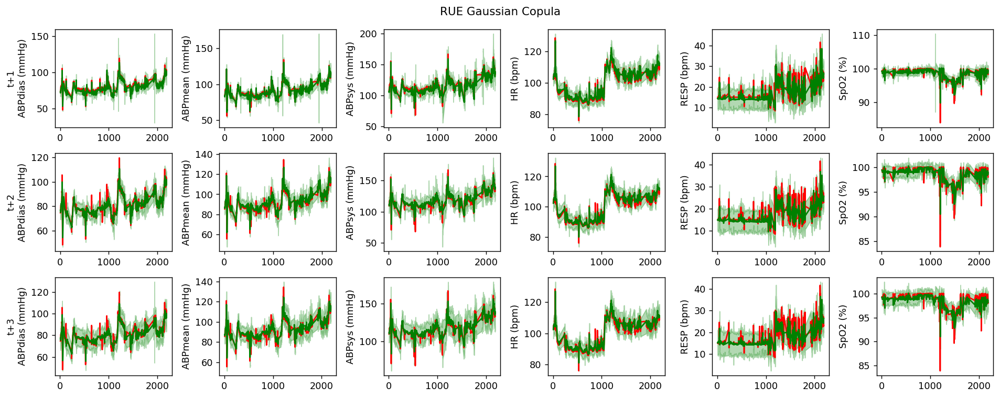

RUE Conditional Gaussian :


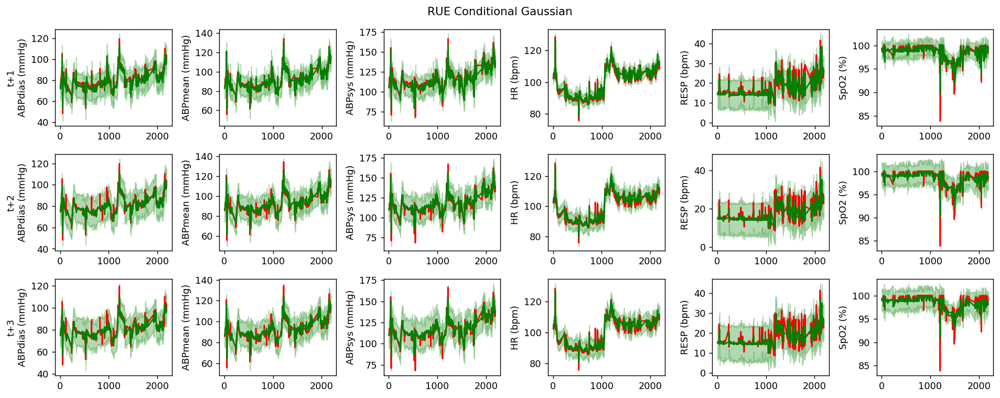

RUE Weighted :


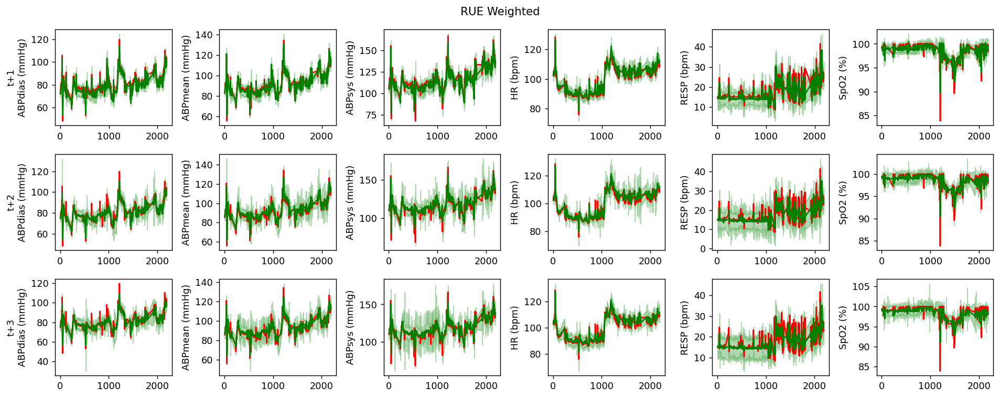

RUE KNN :


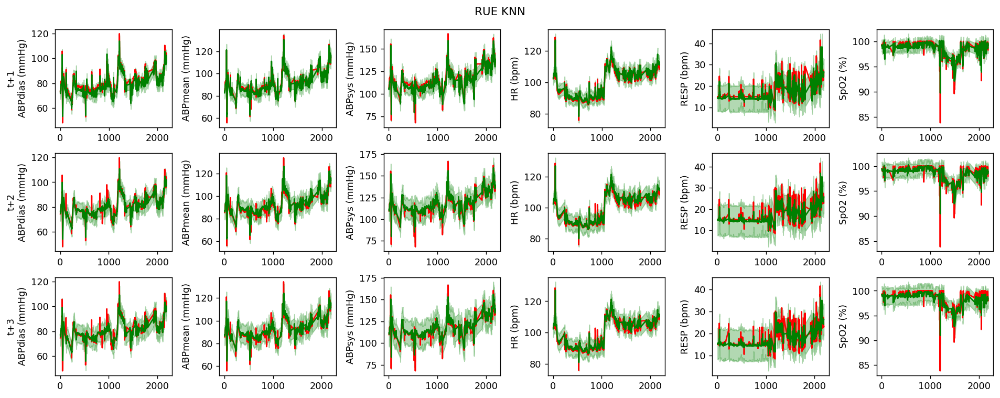

RUE Conformal :


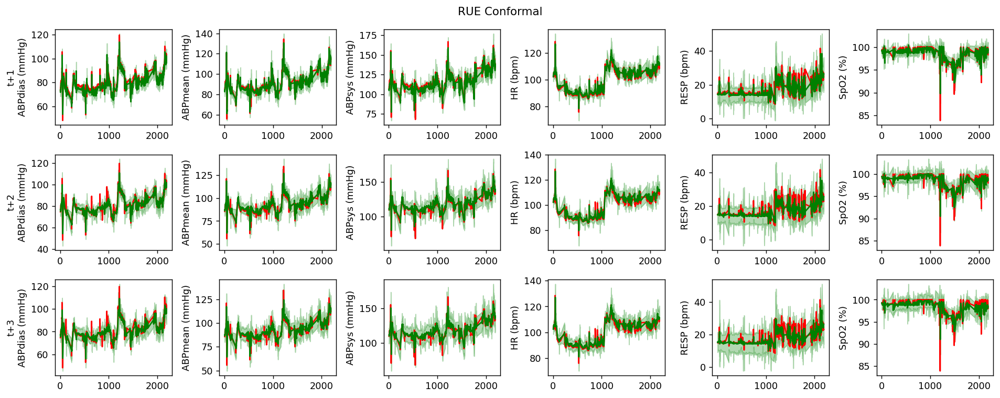

Infer-Noise Conformal :


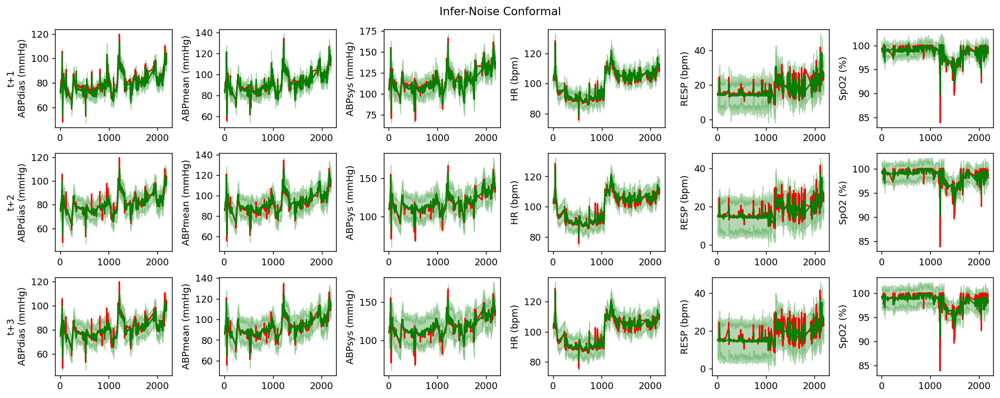

MC Dropout Conformal :


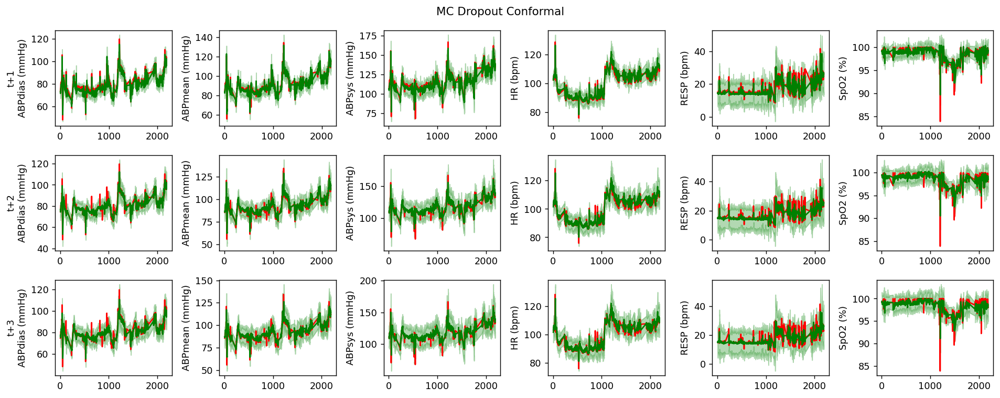

GPR Conformal :


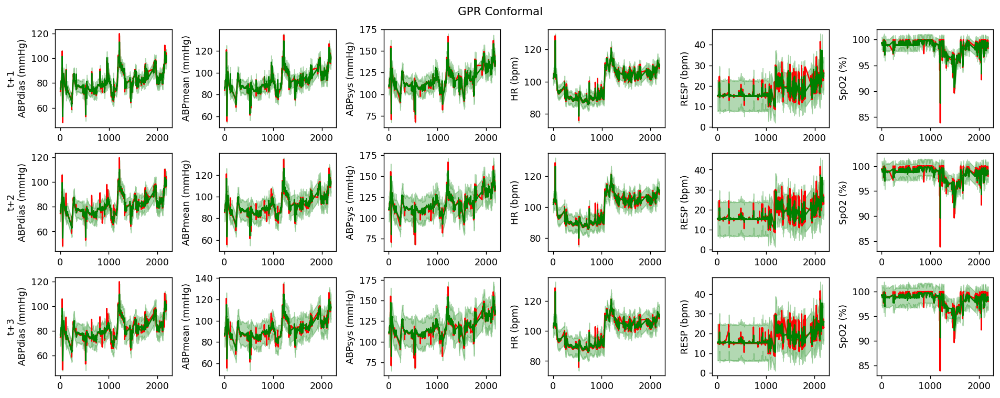

BNN Conformal :


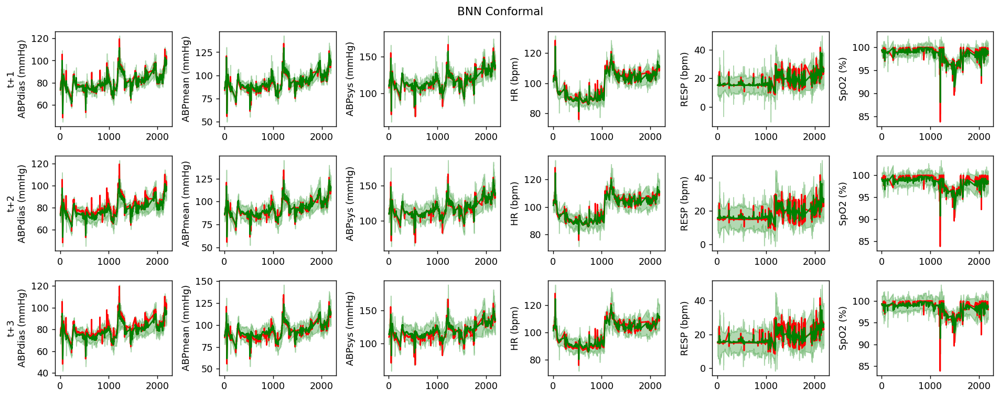

DER Conformal :


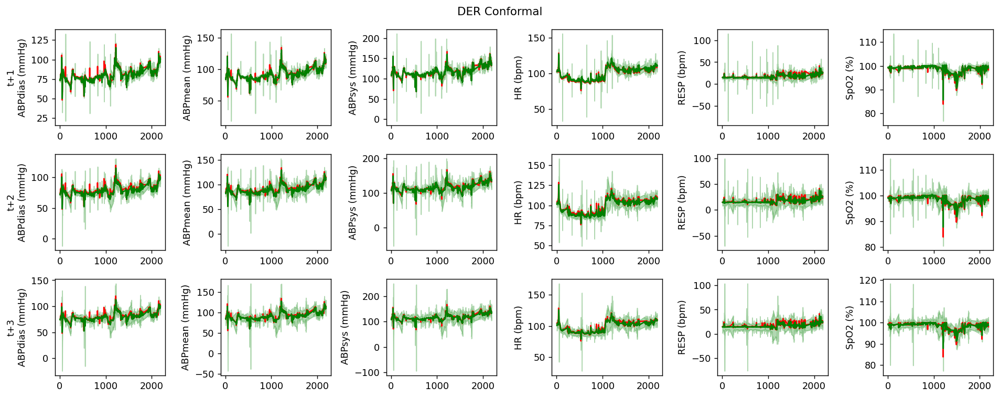

In [83]:
# function to calculate pis
plot_predictions_with_pi(df_dict, pi_dict, scaler, seed=seed, dpi=128, save_figs=False)

#### Parallel Coordinate Plot

In [104]:
def plot_pi_metrics_parallel_coordinate(pi_stats, seed, categories=["CP", "PINAW", "PINAFD"], save_fig=False):
    from matplotlib import cm
    from matplotlib.colors import rgb2hex
    import seaborn as sns
    
    pi_stats = pi_stats.copy().sort_values(by=["Time Horizon", "Method"])
    num_cat = len(categories)
    
    rue_colors = sns.color_palette('spring', n_colors=4)
    other_colors = sns.color_palette('winter', n_colors=3)
    
    # color_list =  other_colors + rue_colors
    color_list = sns.color_palette('rainbow', n_colors=pi_stats["Method"].nunique())
    print(pi_stats["Method"].unique())
    # color_list = [
    #     '#1f77b4',  # muted blue
    #     '#ff7f0e',  # safety orange
    #     '#2ca02c',  # cooked asparagus green
    #     '#d62728',  # brick red
    #     '#9467bd',  # muted purple
    #     '#8c564b',  # chestnut brown
    #     '#e377c2',  # raspberry yogurt pink
    # #     '#7f7f7f',  # middle gray
    # #     '#bcbd22',  # curry yellow-green
    # #     '#17becf'   # blue-teal
    # ]
    
    fig, axes = plt.subplots(1, num_cat, sharey=True, dpi=300, figsize=(num_cat*3, 3))
    xticks = range(num_cat)
    
    for i, (time_horizon_label, time_df) in enumerate(pi_stats.groupby("Time Horizon")):
        time_df[categories] = (time_df[categories]-time_df[categories].min())/(time_df[categories].max()-time_df[categories].min())
        for j, (method_label, method_df) in enumerate(time_df.groupby("Method")):
            # print(method_df[categories].values.flatten())
            axes[i].plot(xticks, method_df[categories].values.flatten(), label=method_label if i==0 else None, linestyle="--" if "RUE" not in method_label else "-")
            axes[i].set_xticks(xticks, categories)
        axes[i].set_title(time_horizon_label)

    reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
    h_l = axes[0].get_legend_handles_labels()
    fig.legend(*reorder(h_l, 5), loc='upper center', bbox_to_anchor=(0.5, 0), ncol=5, fontsize=8)
    plt.tight_layout()
    if save_fig:
        fp_fig_folder = os.path.join(fp_project_model_evaluations, str(seed))
        plt.savefig(os.path.join(fp_fig_folder, "parallel_coord.jpg"), bbox_inches="tight")
    

['BNN Conformal' 'DER Conformal' 'GPR Conformal' 'Infer-Noise Conformal'
 'MC Dropout Conformal' 'RUE Conditional Gaussian' 'RUE Conformal'
 'RUE Gaussian Copula' 'RUE KNN' 'RUE Weighted']


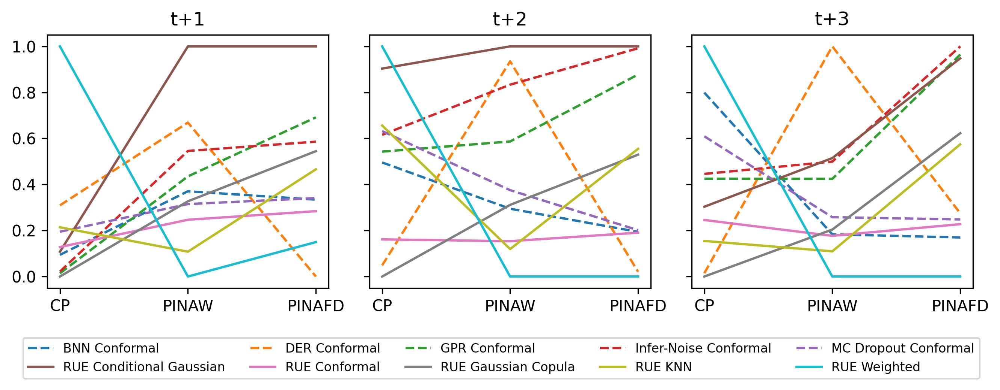

In [105]:
plot_pi_metrics_parallel_coordinate(pi_stats, seed=seed, categories=["CP", "PINAW", "PINAFD"], save_fig=True)

#### UE-Error Scatter Plot

In [61]:
def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold', pad=0, y=0.975)
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')

# Scatter plot of rows of t+1, t+2... t+3
# - In each row, we have the scatterplots of each UE
def get_ue_loss_scatterplot(test_df_dict, ue_dict, seed, nbins=10, dpi=300, save_fig=False):
    eqn_label_fs = 7
    line_col = 'black'
    point_color = "#0090C1"
    point_size = 75
    point_alpha = 0.5
    marker = "."
    formatting_dict = dict(color=point_color, s=point_size, alpha=point_alpha, marker=marker, edgecolors='none')
    
    bin_width = int(100/nbins)
    num_cols = len(ue_dict)
    num_rows = len(test_df_dict) # num intervals
    #, constrained_layout=True
    # fig, axes = plt.subplots(num_rows*2, num_cols, dpi=dpi, figsize=(num_cols*4, 1.5*2*num_rows)) # , sharey="row", sharex="col"
    fig = plt.figure(dpi=dpi, figsize=(num_cols*3, 2*2*num_rows))
    grid = fig.add_gridspec(num_rows, 1, height_ratios=[1 for i in range(num_rows)], hspace=0.3)
    
    # For all time intervals 
    for time_i ,(regressor_label, test_df_info) in enumerate(test_df_dict.items()):
        cur_gs = grid[time_i].subgridspec(2, num_cols, wspace=0, hspace=0.1)
        axes = cur_gs.subplots(sharey='row', sharex='col')
        test_df = test_df_info["test_df"]
        pred_cols = test_df_info["pred_cols"]
        y_true = test_df[pred_cols].values

        create_subtitle(fig, grid[time_i, ::], regressor_label)
        # For each ue 
        for ue_i, (ue_type, ue_info) in enumerate(ue_dict.items()):
            
            ue_df = test_df.copy()
            
            pred_label = ue_info["pred_label"]
            ue_col = ue_info["ue_col"]

            # Get error and UE cols
            y_pred_cols = [col+pred_label+"_"+regressor_label for col in pred_cols]
            y_pred = test_df[y_pred_cols].values
            ue = test_df[ue_col].values
            loss = np.mean(np.abs(y_true-y_pred), axis=1)
            ue_df["loss"] = loss

            # Normalise UE
            ue = min_max_norm_wo_outliers(ue)
            ue_df[ue_col] = ue
            max_range = round(max(ue), 1)
            bin_edges = np.array([0]+list(np.linspace(bin_width, int(max_range*100), num=int(max_range*10))/100))
            
            # Plot scatter
            scatter_ax = axes[0, ue_i]
            scatter_ax.axvspan(0, bin_width/100, color='grey', alpha=0.2, linewidth=0)
            scatter_ax.scatter(ue, loss, **formatting_dict)
            # Plot line
            m, c = np.polyfit(ue, loss, 1) 
            ue = np.sort(ue)
            scatter_ax.plot(ue, m*ue+c, color=line_col, linestyle='-', label=f'y = {m:.3f}x + {c:.3f}', linewidth=1.5)
            scatter_ax.legend(fontsize=eqn_label_fs)
            if ue_i == 0:
                axes[0, ue_i].set_ylabel("MAE")
                
            # Plot Barplot
            ue_df['bin'] = pd.cut(ue_df[ue_col], bins=bin_edges, labels=bin_edges[1:], include_lowest=True, right=True)
            grouped = ue_df.groupby("bin", observed=False)
            grouped_loss = grouped["loss"].mean()
            # Comparison of losses
            bar_ax = axes[1, ue_i]
            bar_ax.bar(
                bin_edges[1:]-bin_width/100/2, grouped_loss, width=bin_width/100*0.9, color="#0090C1")
            ticks = list(axes[1, ue_i].get_yticks(minor=True)) + [grouped_loss[0.1]]
            bar_ax.set_yticks(ticks, minor=True)
            if ue_i == 0:
                bar_ax.set_ylabel("Mean MAE")
            bar_ax.set_xlabel(ue_type)

    if save_fig:
        fp_fig_folder = os.path.join(fp_project_model_evaluations, str(seed))
        plt.savefig(os.path.join(fp_fig_folder, "ue_error_scatter.jpg"), bbox_inches="tight")


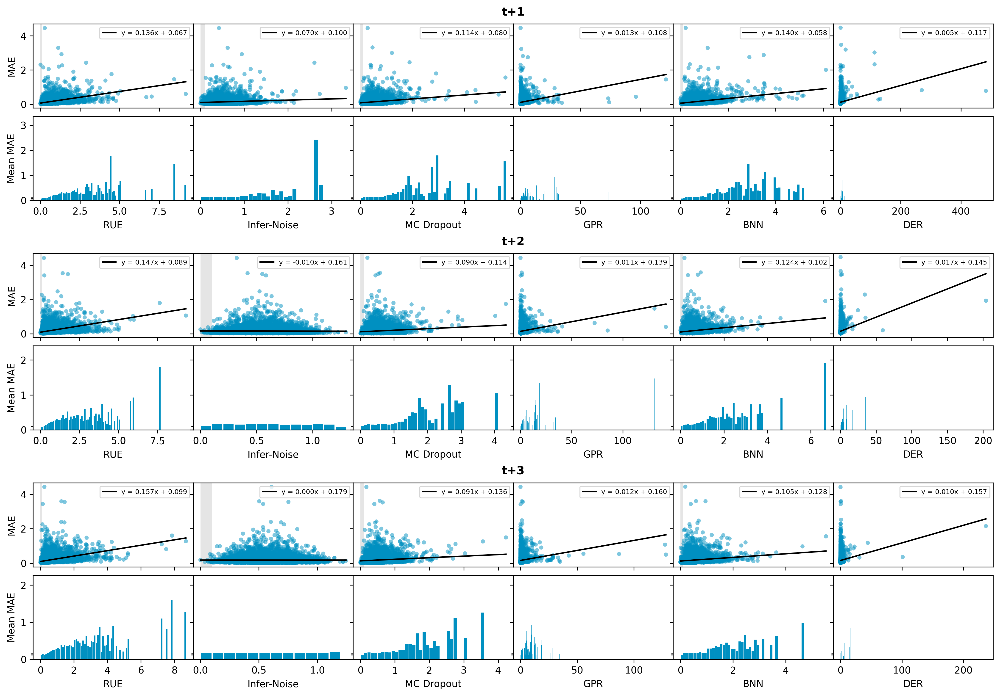

In [63]:
ue_dict = {
    "RUE": {
        "pred_label": "_direct", "ue_col": "rue", 
    },
    "Infer-Noise": {
        "pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", 
    },
    "MC Dropout": {
        "pred_label": "_mean", "ue_col": "mcd", 
    },
    "GPR": {
        "pred_label": "_gpr", "ue_col": "gpr_std_mean", 
    },
    "BNN": {
        "pred_label": "_bnn", "ue_col": "bnn_uncertainty", 
    },
    "DER": {
        "pred_label": "_der", "ue_col": "der_uncertainty", 
    },
}    
get_ue_loss_scatterplot(df_dict, ue_dict, seed=seed, dpi=300, save_fig=True)

#### Starplot

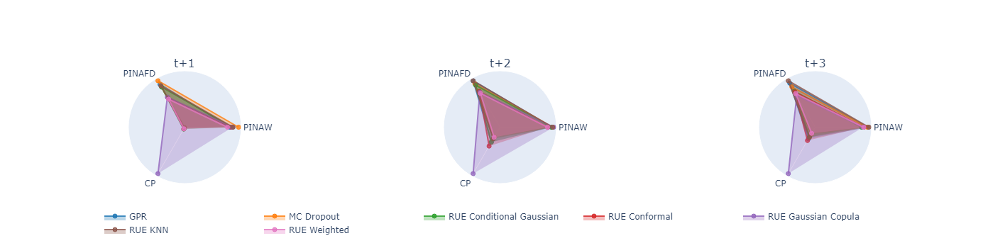

In [92]:
def plot_pi_metrics_starplot(pi_stats, categories=pi_stats.columns.tolist()[2:-2]):
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    from plotly.colors import hex_to_rgb
    fig = make_subplots(
        rows=1, cols=pi_stats["Time Horizon"].nunique(),
        specs=[[{"type": "scatterpolar"}, {"type": "scatterpolar"}, {"type": "scatterpolar"}]], 
        subplot_titles=pi_stats["Time Horizon"].unique()
    )
    pi_stats = pi_stats.copy()
    color_list = [
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#8c564b',  # chestnut brown
        '#e377c2',  # raspberry yogurt pink
    #     '#7f7f7f',  # middle gray
    #     '#bcbd22',  # curry yellow-green
    #     '#17becf'   # blue-teal
    ]
    
    for i, (time_horizon_label, time_df) in enumerate(pi_stats.groupby("Time Horizon")):
        # time_df[categories] = (time_df[categories]-time_df[categories].min())/(time_df[categories].max()-time_df[categories].min())
        time_df[categories] = time_df[categories]/time_df[categories].max()
        # time_df[categories] = np.log(time_df[categories])
        for j, (method_label, method_df) in enumerate(time_df.groupby("Method")):
            cur_col = list(hex_to_rgb(color_list[j]))
            cur_fill_col = f'rgba({cur_col[0]}, {cur_col[1]}, {cur_col[2]}, 0.3)'
            cur_outline_col = f'rgba({cur_col[0]}, {cur_col[1]}, {cur_col[2]}, 0.8)'
            fig.append_trace(
                go.Scatterpolar(
                      r=method_df[categories].values[0],
                      theta=categories,
                      fill='toself',
                      name=method_label if i==0 else None,
                      fillcolor=cur_fill_col,
                      marker=dict(color=cur_outline_col, line=dict(
                            color=color_list[j],
                            width=1
                        ),
                    ),
                    showlegend=i==0
                ), row=1, col=i+1
            )

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
              visible=False,
            )
        ),
        polar2=dict(
            radialaxis=dict(
              visible=False,
            )
          ),
        polar3=dict(
            radialaxis=dict(
              visible=False,
            )
      ),
      showlegend=True, 
      width=850,  
      height=350,
      title_x=0.5,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            xanchor="center",
            y=-0.5,
            x=0.5,
            entrywidth=180
        )
    )
#     fig.show()
    return fig
        
plot_pi_metrics_starplot(pi_stats, categories=pi_stats.columns.tolist()[3:-1])

## Repeat Experiment

In [ ]:
hp_seed = 2023

def train_rue_n_predictor(seed, data_dict, override_checkpoints, testing):
    # Load Best HP
    all_rue_decoder_best_hp = joblib.load(os.path.join(fp_tuning, str(hp_seed), "all_rue_decoder_best_hp.joblib"))
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            fp_model = os.path.join(fp_project_models, str(seed), f"rue_{time_label}")
            # Check if fp_model exists
            if override_checkpoints or not os.path.exists(fp_model):
                # Get best hyperparameter
                best_hp = all_rue_decoder_best_hp[time_label]
                # Train model
                ae_regressor = model_training(
                    best_hp, predictors=predictors, pred_cols=time_info_dict["outputs"], 
                    train_df=time_info_dict["train_df"], valid_df = time_info_dict["valid_df"], seed=seed,
                    batch_size=batch_size, max_epochs=10000 if not testing else 1, verbose=1, patience=20
                ) 
                # Save model
                save_model(
                    model=ae_regressor, name=f"rue_{time_label}", 
                    fp_checkpoints=os.path.join(fp_project_models, str(seed)), override=True)
            else:
                print(f"- Skip {time_label} Training")

def predict_rue_n_predictor(seed, data_dict, override_checkpoints, testing):
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            # Load model
            ae_regressor = load_model(name=f"rue_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
            # Check if we have predicted on the validation set
            fp_valid_df = os.path.join(fp_project_predictions, str(seed), f"rue_valid_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_valid_df):
                rue_valid_df = model_test_predictions(
                    ae_regressor, df_train=time_info_dict["train_df"], df_test=time_info_dict["valid_df"], 
                    pred_cols=time_info_dict["outputs"], predictors=predictors, 
                    regressor_label="_"+time_label, pred_min=int(time_label[-1]), T=10 if not testing else 1, seed=seed
                )
                rue_valid_df.to_csv(fp_valid_df)
            else:
                print(f"- Skip {time_label} Validation Prediction")
                
            # Check if we have predicted on the testing set 
            fp_test_df = os.path.join(fp_project_predictions, str(seed), f"rue_test_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_test_df):
                rue_test_df = model_test_predictions(
                    ae_regressor, df_train=time_info_dict["train_df"], df_test=time_info_dict["test_df"], 
                    pred_cols=time_info_dict["outputs"], predictors=predictors, 
                    regressor_label="_"+time_label, pred_min=int(time_label[-1]), T=10 if not testing else 1, seed=seed
                )
                rue_test_df.to_csv(fp_test_df)
            else:
                print(f"- Skip {time_label} Testing Prediction")
            
def train_gpr(seed, data_dict, override_checkpoints, testing):
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            fp_model = os.path.join(fp_project_models, str(seed), f"gpr_{time_label[-1]}")
            # Check if fp_model exists
            if override_checkpoints or not os.path.exists(fp_model):
                # Train model
                gpr = model_training_gpr( 
                    predictors=predictors, pred_cols=time_info_dict["outputs"], 
                    train_df=time_info_dict["train_df"], valid_df = time_info_dict["valid_df"], seed=seed
                ) 
                # Save model
                save_model_gpr(model=gpr, name=f"gpr_{time_label[-1]}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
            else:
                print(f"- Skip {time_label} Training")

def predict_gpr(seed, data_dict, override_checkpoints, testing):
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            gpr = load_model_gpr(name=f"gpr_{time_label[-1]}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
            # Check if we have predicted on the validation set
            fp_valid_df = os.path.join(fp_project_predictions, str(seed), f"gpr_valid_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_valid_df):
                gpr_valid_df = model_test_predictions_gpr(
                    gpr=gpr, df_test=time_info_dict["valid_df"], pred_cols=time_info_dict["outputs"], 
                    predictors=predictors, regressor_label=f"_{time_label}", pred_min=int(time_label[-1]), seed=seed)
                gpr_valid_df.to_csv(fp_valid_df)
            else:
                print(f"- Skip {time_label} Validation Prediction")
                
            # Check if we have predicted on the testing set
            fp_test_df = os.path.join(fp_project_predictions, str(seed), f"gpr_test_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_test_df):
                gpr_test_df = model_test_predictions_gpr(
                    gpr=gpr, df_test=time_info_dict["test_df"], pred_cols=time_info_dict["outputs"], 
                    predictors=predictors, regressor_label=f"_{time_label}", pred_min=int(time_label[-1]), seed=seed)
                gpr_test_df.to_csv(fp_test_df)
            else:
                print(f"- Skip {time_label} Testing Prediction")    
                
def predict_infernoise(seed, data_dict, override_checkpoints, testing):
    # Load best hp for infernoise
    infernoise_hp_dict = joblib.load(os.path.join(fp_tuning, str(hp_seed), "all_infernoise_best_hp.joblib"))
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            # Load model
            ae_regressor = load_model(name=f"rue_{time_label}", fp_checkpoints=os.path.join(fp_project_models, str(seed)))
            # Check if we have predicted on the validation set
            fp_valid_df = os.path.join(fp_project_predictions, str(seed), f"infernoise_valid_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_valid_df):
                infernoise_valid_df = infernoise_test_predictions(
                     ae_regressor, test_df=time_info_dict["valid_df"], inputs=predictors, outputs=time_info_dict["outputs"], regressor_label="_"+time_label, 
                     seed=seed, T=10 if not testing else 1, stddev=infernoise_hp_dict[time_label]
                ) 
                infernoise_valid_df.to_csv(fp_valid_df)
            else:
                print(f"- Skip {time_label} Validation Prediction")
                
            # Check if we have predicted on the testing set
            fp_test_df = os.path.join(fp_project_predictions, str(seed), f"infernoise_test_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_test_df):
                infernoise_test_df = infernoise_test_predictions(
                     ae_regressor, test_df=time_info_dict["test_df"], inputs=predictors, outputs=time_info_dict["outputs"], regressor_label="_"+time_label, 
                     seed=seed, T=10 if not testing else 1, stddev=infernoise_hp_dict[time_label]
                ) 
                infernoise_test_df.to_csv(fp_test_df)
            else:
                print(f"- Skip {time_label} Testing Prediction")    

def train_bnn(seed, data_dict, override_checkpoints, testing):
    # Load Best HP
    all_bnn_best_hp = joblib.load(os.path.join(fp_tuning, str(hp_seed), "all_bnn_best_hp.joblib"))
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            fp_model = os.path.join(fp_project_models, str(seed), f"bnn_{time_label}.pt")
            # Check if fp_model exists
            if override_checkpoints or not os.path.exists(fp_model):
                # Get best hyperparameter
                bnn_best_hp = all_bnn_best_hp[time_label]
                # Train model
                bnn_model = train_model_w_best_param(
                    best_param=bnn_best_hp, train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
                    feat_cols=predictors, target_cols=time_info_dict["outputs"],
                    epochs=500 if not testing else 1, patience=5, seed=seed, fp_model=fp_model
                )
            else:
                print(f"- Skip {time_label} Training")

def predict_bnn(seed, data_dict, override_checkpoints, testing):
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            # Load model
            fp_model = os.path.join(fp_project_models, str(seed), f"bnn_{time_label}.pt")
            bnn_model = torch.load(fp_model)
            # Check if we have predicted on the validation set
            fp_valid_df = os.path.join(fp_project_predictions, str(seed), f"bnn_valid_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_valid_df):
                bnn_valid_df = bnn_model_prediction(
                    bnn_model, time_info_dict["valid_df"], 
                    feat_cols=predictors, target_cols=time_info_dict["outputs"], 
                    T=10 if not testing else 1, seed=seed, regressor_label=time_label)
                bnn_valid_df.to_csv(fp_valid_df)
            else:
                print(f"- Skip {time_label} Validation Prediction")
                
            # Check if we have predicted on the testing set 
            fp_test_df = os.path.join(fp_project_predictions, str(seed), f"bnn_test_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_test_df):
                bnn_test_df = bnn_model_prediction(
                    bnn_model, time_info_dict["test_df"], 
                    feat_cols=predictors, target_cols=time_info_dict["outputs"], 
                    T=10 if not testing else 1, seed=seed, regressor_label=time_label)
                bnn_test_df.to_csv(fp_test_df)
            else:
                print(f"- Skip {time_label} Testing Prediction")

def train_der(seed, data_dict, override_checkpoints, testing):
    # Load Best HP
    all_der_best_hp = joblib.load(os.path.join(fp_tuning, str(hp_seed), "all_der_best_hp.joblib"))
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            fp_model = os.path.join(fp_project_models, str(seed), f"der_{time_label}.pt")
            # Check if fp_model exists
            if override_checkpoints or not os.path.exists(fp_model):
                # Get best hyperparameter
                best_hp = all_der_best_hp[time_label]
                # Train model
                der_model, _ = train_der_w_param(
                    **best_hp, train_df=time_info_dict["train_df"], valid_df=time_info_dict["valid_df"], 
                    inputs=predictors, outputs=time_info_dict["outputs"],
                    seed=seed, max_epochs= 500 if not testing else 1, patience=5
                )
                torch.save(der_model, fp_model)
            else:
                print(f"- Skip {time_label} Training")

def predict_der(seed, data_dict, override_checkpoints, testing):
    with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
        for time_label, time_info_dict in pbar:
            pbar.set_description(time_label)
            # Load model
            fp_model = os.path.join(fp_project_models, str(seed), f"der_{time_label}.pt")
            der_model = torch.load(fp_model)
            # Check if we have predicted on the validation set
            fp_valid_df = os.path.join(fp_project_predictions, str(seed), f"der_valid_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_valid_df):
                der_valid_df = der_model_prediction(
                    der_model, test_df=time_info_dict["valid_df"], 
                    feat_cols=predictors, target_cols=time_info_dict["outputs"], 
                    seed=seed, silent=False, regressor_label=time_label)
                der_valid_df.to_csv(fp_valid_df)
            else:
                print(f"- Skip {time_label} Validation Prediction")
                
            # Check if we have predicted on the testing set 
            fp_test_df = os.path.join(fp_project_predictions, str(seed), f"der_test_{time_label[-1]}.csv")
            if override_checkpoints or not os.path.exists(fp_test_df):
                der_test_df = der_model_prediction(
                    der_model, test_df=time_info_dict["test_df"], 
                    feat_cols=predictors, target_cols=time_info_dict["outputs"], 
                    seed=seed, silent=False, regressor_label=time_label)
                der_test_df.to_csv(fp_test_df)
            else:
                print(f"- Skip {time_label} Testing Prediction")
                
def save_df_dict_fast(df_dict, seed):
    fp_df_dict = os.path.join(fp_project_pi_predictions, str(seed), "df_dict.joblib")
    joblib.dump(df_dict, fp_df_dict)

def load_df_dict_fast( seed):
    fp_df_dict = os.path.join(fp_project_pi_predictions, str(seed), "df_dict.joblib")
    return joblib.load(fp_df_dict)

def retrieve_history_file(seed):
    fp_history = os.path.join(fp_project_pi_predictions, str(seed), "df_dict_history.joblib")
    if os.path.exists(fp_history):
        return joblib.load(fp_history)
    else:
        return []

def add_to_pi_history_file(event, seed):
    fp_history = os.path.join(fp_project_pi_predictions, str(seed), "df_dict_history.joblib")
    if not os.path.exists(fp_history):
        history = set(event)
    else:
        history = joblib.load(fp_history)
        history.add(event)
    joblib.dump(history, fp_history)
    
def create_df_dict(seed, data_dict, override_checkpoints, testing):
    event = "creation"
    history = retrieve_history_file(seed)
    if (override_checkpoints) or (event not in history):
        df_dict = {}
        with tqdm(data_dict.items(), total=len(data_dict)) as pbar:
            for time_label, time_info_dict in pbar:
                df_dict[time_label] = {
                    "valid_df": load_all_predictions(time_label=int(time_label[-1]), split="valid", seed=seed),
                    "test_df": load_all_predictions(time_label=int(time_label[-1]), split="test", seed=seed),
                    "pred_cols": time_info_dict["outputs"]
                }
        save_df_dict_fast(df_dict, seed)
        add_to_pi_history_file(event, seed)
    else:
        print(f"- Skip df_dict creation!")

def generate_prediction_interval(seed, data_dict, override_checkpoints, testing, 
                                 event, pi_func, ue_dict):
    history = retrieve_history_file(seed)
    if (override_checkpoints) or (event not in history):
        df_dict = load_df_dict_fast(seed)
        scaler = load_scaler(fp_downsampled_scaler_file)
        for time_label, time_info in df_dict.items():
            val_df, test_df, pred_cols = time_info["valid_df"], time_info["test_df"], time_info["pred_cols"]
            for ue_label, ue_info in ue_dict.items():
                pred_label, ue_col = ue_info["pred_label"], ue_info["ue_col"]
                df_dict[time_label]["test_df"] = pi_func(
                    df_val=df_dict[time_label]["valid_df"], df_test=df_dict[time_label]["test_df"], predictors=predictors, pred_cols=pred_cols, 
                    pred_label=pred_label, regressor_label=time_label, ue_col=ue_col, scaler=scaler, seed=seed
                )
        save_df_dict_fast(df_dict, seed)
        add_to_pi_history_file(event, seed)
    else:
        print(f"- Skip {event} PI!")

def generate_knn_pi(seed, data_dict, override_checkpoints, testing):
    ue_dict = {"RUE": {"pred_label": "_direct", "ue_col": "rue"}} 
    generate_prediction_interval(
        seed, data_dict, override_checkpoints, testing, 
        event="knn", pi_func=knn_prediction_interval, ue_dict=ue_dict)

def generate_weighted_pi(seed, data_dict, override_checkpoints, testing):
    ue_dict = {"RUE": {"pred_label": "_direct", "ue_col": "rue"}} 
    generate_prediction_interval(
        seed, data_dict, override_checkpoints, testing, 
        event="weighted", pi_func=weighted_prediction_interval, ue_dict=ue_dict)

def generate_conditional_pi(seed, data_dict, override_checkpoints, testing):
    ue_dict = {"RUE": {"pred_label": "_direct", "ue_col": "rue"}} 
    generate_prediction_interval(
        seed, data_dict, override_checkpoints, testing, 
        event="conditional", pi_func=cond_gauss_prediction_interval, ue_dict=ue_dict)

def generate_copula_pi(seed, data_dict, override_checkpoints, testing):
    ue_dict = {"RUE": {"pred_label": "_direct", "ue_col": "rue"}} 
    generate_prediction_interval(
        seed, data_dict, override_checkpoints, testing, 
        event="copula", pi_func=gauss_copula_prediction_interval, ue_dict=ue_dict)

def generate_conformal_pi(seed, data_dict, override_checkpoints, testing):
    ue_dict = {
        "RUE": {"pred_label": "_direct", "ue_col": "rue"},
        "MC Dropout": {"pred_label": "_mean", "ue_col": "mcd", },
        "GPR": {"pred_label": "_gpr", "ue_col": "gpr_std_mean", },
        "Infer-Noise": {"pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", },
        "BNN": {"pred_label": "_bnn", "ue_col": "bnn_uncertainty", },
        "DER": {"pred_label": "_der", "ue_col": "der_uncertainty", }
    }   
    generate_prediction_interval(
        seed, data_dict, override_checkpoints, testing, 
        event="conformal", pi_func=conformal_prediction_interval, ue_dict=ue_dict)

def evaluate_model_perf(seed, data_dict, override_checkpoints, testing):
    df_dict = load_df_dict_fast(seed)
    ue_dict = {
        "RUE": {"pred_label": "_direct", "ue_col": "rue"},
        "MC Dropout": {"pred_label": "_mean", "ue_col": "mcd", },
        "GPR": {"pred_label": "_gpr", "ue_col": "gpr_std_mean", },
        "Infer-Noise": {"pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", },
        "BNN": {"pred_label": "_bnn", "ue_col": "bnn_uncertainty", },
        "DER": {"pred_label": "_der", "ue_col": "der_uncertainty", }
    }   
    fp_pred_perf = os.path.join(fp_project_model_evaluations, str(seed), "pred_perf.csv")
    if override_checkpoints or not os.path.exists(fp_pred_perf):
        pred_perf_df = get_prediction_performance_table(df_dict, ue_dict)
        display(pred_perf_df)
        pred_perf_df.to_csv(fp_pred_perf)
    else:
        print(f"- Skip prediction performance evaluation!")

def evaluate_ue_perf(seed, data_dict, override_checkpoints, testing):
    df_dict = load_df_dict_fast(seed)
    ue_dict = {
        "RUE": {"pred_label": "_direct", "ue_col": "rue"},
        "MC Dropout": {"pred_label": "_mean", "ue_col": "mcd", },
        "GPR": {"pred_label": "_gpr", "ue_col": "gpr_std_mean", },
        "Infer-Noise": {"pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", },
        "BNN": {"pred_label": "_bnn", "ue_col": "bnn_uncertainty", },
        "DER": {"pred_label": "_der", "ue_col": "der_uncertainty", }
    }   
    fp_ue_perf = os.path.join(fp_project_model_evaluations, str(seed), "ue_perf.csv")
    if override_checkpoints or not os.path.exists(fp_ue_perf):
        ue_perf_df = get_ue_performance_table(df_dict, ue_dict)
        display(ue_perf_df)
        ue_perf_df.to_csv(fp_ue_perf)
    else:
        print(f"- Skip UE performance evaluation!")

    fp_ue_scatter = os.path.join(fp_project_model_evaluations, str(seed), "ue_error_scatter.jpg")
    if override_checkpoints or not os.path.exists(fp_ue_scatter):
        get_ue_loss_scatterplot(df_dict, ue_dict, seed=seed, dpi=300, save_fig=True)
    else:
        print(f"- Skip UE-Error Scatter Plot!")

def evaluate_pi_perf(seed, data_dict, override_checkpoints, testing):
    override_checkpoints = True
    df_dict = load_df_dict_fast(seed)
    scaler = load_scaler(fp_downsampled_scaler_file)
    pi_dict = {
        "RUE Gaussian Copula": {"pred_label": "_direct", "ue_col": "rue", "pi_label": "_gauss_copula"},
        "RUE Conditional Gaussian": {"pred_label": "_direct", "ue_col": "rue", "pi_label": "_cond_gauss"},
        "RUE Weighted": {"pred_label": "_direct", "ue_col": "rue", "pi_label": "_weighted"},
        "RUE KNN": {"pred_label": "_direct", "ue_col": "rue", "pi_label": "_knn"},
        "RUE Conformal": {"pred_label": "_direct", "ue_col": "rue", "pi_label": "_conformal"},
        "Infer-Noise Conformal": {"pred_label": "_infernoise", "ue_col": "infernoise_uncertainty", "pi_label": "_conformal"},
        "MC Dropout Conformal": {"pred_label": "_mean", "ue_col": "mcd", "pi_label": "_conformal"},
        "GPR Conformal": {"pred_label": "_gpr", "ue_col": "gpr_std_mean", "pi_label": "_conformal"},
        "BNN Conformal": {"pred_label": "_bnn", "ue_col": "bnn_uncertainty", "pi_label": "_conformal"},
        "DER Conformal": {"pred_label": "_der", "ue_col": "der_uncertainty", "pi_label": "_conformal"},
    }   
    fp_pi_perf = os.path.join(fp_project_model_evaluations, str(seed), "pi_perf.csv")
    if override_checkpoints or not os.path.exists(fp_pi_perf):
        pi_perf_df = calculate_metrics(df_dict, pi_dict)
        display(pi_perf_df)
        pi_perf_df.to_csv(fp_pi_perf)
    else:
        pi_perf_df = pd.read_csv(fp_pi_perf, index_col=0)
        print(f"- Skip PI performance evaluation!")

    fp_pi_folder = os.path.join(fp_project_model_evaluations, str(seed), "pi_line_graphs")
    if override_checkpoints or not os.path.exists(fp_pi_folder):
        plot_predictions_with_pi(df_dict, pi_dict, scaler, seed=seed, dpi=300, save_figs=True)
    else:
        print(f"- Skip PI Line Plots!")

    fp_pi_parallel_coord = os.path.join(fp_project_model_evaluations, str(seed), "parallel_coord.jpg")
    if override_checkpoints or not os.path.exists(fp_pi_parallel_coord):
        plot_pi_metrics_parallel_coordinate(pi_perf_df, seed=seed, categories=["CP", "PINAW", "PINAFD"], save_fig=True)
    else:
        print(f"- Skip PI Parallel Coordinates Plot!")
    
def run_one_experiment(seed, override_checkpoints=False, testing=False):
    data_dict = {
        "t+1": {"train_df": df_train_1, "valid_df": df_valid_1, "test_df": df_test_1, "outputs": pred_cols_1},
        "t+2": {"train_df": df_train_2, "valid_df": df_valid_2, "test_df": df_test_2, "outputs": pred_cols_2},
        "t+3": {"train_df": df_train_3, "valid_df": df_valid_3, "test_df": df_test_3, "outputs": pred_cols_3},
    }
    checkpoint_dict = {
        "Train RUE and Predictor": train_rue_n_predictor,
        "Prediction with RUE and Predictor": predict_rue_n_predictor,
        "Prediction with Infer-Noise": predict_infernoise,
        "Train GPR": train_gpr,
        "Prediction with GPR": predict_gpr,
        "Train BNN": train_bnn, 
        "Prediction with BNN": predict_bnn, 
        "Train DER": train_der, # <-
        "Prediction with DER": predict_der,
        "Create DF Dict": create_df_dict,
        "Generate KNN PI":generate_knn_pi,
        "Generate Weighted PI": generate_weighted_pi,
        "Generate Conditional PI": generate_conditional_pi,
        "Generate Copula PI": generate_copula_pi,
        "Generate Conformal PI": generate_conformal_pi,
        "Evaluate Model Performance": evaluate_model_perf,
        "Evaluate UE Performance": evaluate_ue_perf,
        "Evaluate PI Performance": evaluate_pi_perf
    }
    create_all_seed_folders(seed)
    for i, (checkpoint_name, checkpoint_func) in enumerate(checkpoint_dict.items()):
        print(f"{i+1}. {checkpoint_name}")
        start = time.time()
        checkpoint_func(seed, data_dict, override_checkpoints, testing)
        print(f"- {checkpoint_name} took {time.time()-start} s.")

def run_multiple_experiments(seed_list, override_checkpoints=False, testing=False):
    with tqdm(seed_list, total=len(seed_list)) as pbar:
        for seed in pbar:
            pbar.set_description(str(seed))
            run_one_experiment(seed, override_checkpoints, testing)

start_seed = 2024
num_experiments = 4
seed_list = range(start_seed, start_seed+num_experiments)
run_multiple_experiments(seed_list, override_checkpoints=False, testing=False)

### Analyse Results

In [2]:
seed_list=list(range(2023, 2023+5))
def combine_mean_n_std_matrices(mean, std):
    assert mean.shape == std.shape
    shape = mean.shape
    returned_list = []
    for i in range(shape[0]):
        cur_list = []
        for j in range(shape[1]):
            cur_list.append(f"{mean[i][j]:.3f} ± {std[i][j]:.3f}")
        returned_list.append(cur_list)
    return returned_list

def get_average_of_all_seed_csvs(seed_list, fp_folder, filename, index_col=None):
    result_list = []
    for cur_seed in seed_list:
        fp_perf = os.path.join(fp_folder, str(cur_seed), filename)
        df = pd.read_csv(fp_perf, index_col=0)
        if index_col:
            df = df.set_index(index_col)
        result_list.append(df.values)
    results = np.array(result_list)
    combined_mean = np.mean(results, axis=0)
    combined_std = np.std(results, axis=0)
    return pd.DataFrame(
        combine_mean_n_std_matrices(combined_mean, combined_std), 
        index=df.index, columns=df.columns)

def get_mean_of_all_seed_csvs(seed_list, fp_folder, filename, index_col=None):
    result_list = []
    for cur_seed in seed_list:
        fp_perf = os.path.join(fp_folder, str(cur_seed), filename)
        df = pd.read_csv(fp_perf, index_col=0)
        if index_col:
            df = df.set_index(index_col)
        result_list.append(df.values)
    results = np.array(result_list)
    combined_mean = np.mean(results, axis=0)
    return pd.DataFrame(
        combined_mean, 
        index=df.index, columns=df.columns)

best_color = "#88E7B8"
second_best_color = "#FAC05E"

# Function to highlight most and second highest
def highlight_first_n_second_highest(s):
    s = s.map(lambda x: float(x.split(" ")[0]))
    highest = s.nlargest(1).iloc[-1] # Find the highest value
    second_highest = s.nlargest(2).iloc[-1]  # Find the second highest value
    output = []
    for v in s:
        if v == highest:
            output.append(f'background-color: {best_color}')
        elif v == second_highest:
            output.append(f'background-color: {second_best_color}')
        else:
            output.append("")
    return output

def highlight_first_n_second_lowest(s):
    s = s.map(lambda x: float(x.split(" ")[0]))
    smallest = s.nsmallest(1).iloc[-1] # Find the highest value
    second_smallest = s.nsmallest(2).iloc[-1]  # Find the second highest value
    output = []
    for v in s:
        if v == smallest:
            output.append(f'background-color: {best_color}')
        elif v == second_smallest:
            output.append(f'background-color: {second_best_color}')
        else:
            output.append("")
    return output

#### Prediction Performance

In [60]:
def get_consolidated_pred_perf(seed_list):
    return get_average_of_all_seed_csvs(seed_list, fp_project_model_evaluations, filename="pred_perf.csv", index_col="Model")

def display_consolidated_pred_perf(pred_perf_df):
    display(pred_perf_df.style.apply(highlight_first_n_second_lowest))

pred_perf_df = get_consolidated_pred_perf(seed_list)
# display(pred_perf_df)
display_consolidated_pred_perf(pred_perf_df)
pred_perf_df.to_csv(os.path.join(fp_project_consolidated_results, "pred_perf.csv"))

,t+1,t+2,t+3
Model,,,
RUE,0.076 ± 0.001,0.104 ± 0.001,0.123 ± 0.001
MC Dropout,0.076 ± 0.001,0.105 ± 0.001,0.123 ± 0.001
GPR,0.073 ± 0.002,0.100 ± 0.002,0.119 ± 0.002
Infer-Noise,0.075 ± 0.002,0.103 ± 0.002,0.122 ± 0.002
BNN,0.078 ± 0.000,0.106 ± 0.000,0.125 ± 0.001
DER,0.076 ± 0.000,0.105 ± 0.001,0.122 ± 0.001


In [174]:
# Function to bold the best
def bold_best(s, direction):
    s = s.map(lambda x: float(x.replace(r"\underline{", "").replace("}", "").split(" ")[0]))
    if direction == "max":
        best = s.nlargest(1).iloc[-1] # Find the best
    elif direction == "min":
        best = s.nsmallest(1).iloc[-1] # Find the best
    else:
        raise Exception(f"Invalid direction {direction}!")
    
    output = []
    for v in s:
        if v == best:
            output.append("textbf:--rwrap;")
        else:
            output.append("")
    return output

# Function to underline the second best
def underline_second_best(s, direction):
    ori_s = s.copy()
    s = s.map(lambda x: float(x.split(" ")[0]))
    if direction == "max":
        second_best = s.nlargest(2).iloc[-1]  # Find the second best
    elif direction == "min":
        second_best = s.nsmallest(2).iloc[-1]  # Find the second best
    else:
        raise Exception(f"Invalid direction {direction}!")
    
    output = []
    for ori_v, v in zip(ori_s, s):
        if v == second_best:
            output.append(r'\underline{'+ori_v+'}')
        else:
            output.append(ori_v)
    return output

def df_to_latex(df, column_format_dict):
    df = df.copy()
    for col, direction in column_format_dict.items():
        df[col] = underline_second_best(df[col], direction)
    styler = df.style
    # Bold column names
    styler.map_index(lambda v: "textbf:--rwrap;", axis="columns")
    # Bold best
    for col, direction in column_format_dict.items():
        styler.apply(bold_best, subset=[col], direction=direction)
    return styler.to_latex(column_format='c'*(df.shape[1]+df.index.nlevels))

print(df_to_latex(pred_perf_df, column_format_dict={"t+1": "min", "t+2": "min", "t+3": "min"}))

1
\begin{tabular}{cccc}
 & \textbf{t+1} & \textbf{t+2} & \textbf{t+3} \\
Model &  &  &  \\
RUE & 0.076 ± 0.001 & 0.104 ± 0.001 & 0.123 ± 0.001 \\
MC Dropout & 0.076 ± 0.001 & 0.105 ± 0.001 & 0.123 ± 0.001 \\
GPR & \textbf{0.073 ± 0.002} & \textbf{0.100 ± 0.002} & \textbf{0.119 ± 0.002} \\
Infer-Noise & \underline{0.075 ± 0.002} & \underline{0.103 ± 0.002} & \underline{0.122 ± 0.002} \\
BNN & 0.078 ± 0.000 & 0.106 ± 0.000 & 0.125 ± 0.001 \\
DER & 0.076 ± 0.000 & 0.105 ± 0.001 & \underline{0.122 ± 0.001} \\
\end{tabular}



#### UE Performance

In [4]:
def get_consolidated_ue_perf(seed_list):
    return get_average_of_all_seed_csvs(seed_list, fp_project_model_evaluations, filename="ue_perf.csv", index_col="Model")

ue_perf_df = get_consolidated_ue_perf(seed_list)
display(ue_perf_df)
ue_perf_df.to_csv(os.path.join(fp_project_consolidated_results, "ue_perf.csv"))

,t+1 Corr,t+1 Pval,t+1 AURC,t+1 Sigma=0.1,t+1 Sigma=0.2,t+1 Sigma=0.3,t+1 Sigma=0.4,t+2 Corr,t+2 Pval,t+2 AURC,...,t+2 Sigma=0.2,t+2 Sigma=0.3,t+2 Sigma=0.4,t+3 Corr,t+3 Pval,t+3 AURC,t+3 Sigma=0.1,t+3 Sigma=0.2,t+3 Sigma=0.3,t+3 Sigma=0.4
Model,,,,,,,,,,,,,,,,,,,,,
RUE,0.431 ± 0.038,0.000 ± 0.000,0.095 ± 0.003,0.062 ± 0.007,0.079 ± 0.004,0.089 ± 0.005,0.095 ± 0.006,0.384 ± 0.019,0.000 ± 0.000,0.109 ± 0.005,...,0.096 ± 0.007,0.103 ± 0.004,0.112 ± 0.003,0.366 ± 0.012,0.000 ± 0.000,0.138 ± 0.006,0.101 ± 0.024,0.125 ± 0.006,0.127 ± 0.005,0.134 ± 0.007
MC Dropout,0.171 ± 0.039,0.000 ± 0.000,0.126 ± 0.002,0.109 ± 0.013,0.121 ± 0.002,0.128 ± 0.001,0.127 ± 0.001,0.104 ± 0.058,0.057 ± 0.113,0.152 ± 0.003,...,0.145 ± 0.008,0.154 ± 0.002,0.154 ± 0.002,0.096 ± 0.053,0.198 ± 0.396,0.173 ± 0.003,0.132 ± 0.019,0.167 ± 0.005,0.175 ± 0.004,0.174 ± 0.003
GPR,0.207 ± 0.005,0.000 ± 0.000,0.092 ± 0.017,0.076 ± 0.012,0.086 ± 0.020,0.094 ± 0.017,0.099 ± 0.014,0.162 ± 0.017,0.000 ± 0.000,0.120 ± 0.015,...,0.110 ± 0.014,0.121 ± 0.016,0.126 ± 0.013,0.146 ± 0.013,0.000 ± 0.000,0.140 ± 0.016,0.122 ± 0.002,0.129 ± 0.017,0.140 ± 0.018,0.146 ± 0.015
Infer-Noise,0.106 ± 0.055,0.000 ± 0.000,0.119 ± 0.018,0.111 ± 0.023,0.116 ± 0.020,0.122 ± 0.018,0.122 ± 0.015,0.034 ± 0.068,0.477 ± 0.342,0.147 ± 0.018,...,0.153 ± 0.026,0.146 ± 0.017,0.149 ± 0.015,0.029 ± 0.062,0.383 ± 0.277,0.168 ± 0.019,0.151 ± 0.038,0.164 ± 0.024,0.170 ± 0.019,0.171 ± 0.016
BNN,0.285 ± 0.017,0.000 ± 0.000,0.116 ± 0.001,0.081 ± 0.004,0.104 ± 0.004,0.114 ± 0.002,0.118 ± 0.001,0.203 ± 0.009,0.000 ± 0.000,0.145 ± 0.003,...,0.132 ± 0.004,0.143 ± 0.005,0.145 ± 0.004,0.174 ± 0.012,0.000 ± 0.000,0.167 ± 0.001,0.124 ± 0.006,0.157 ± 0.003,0.165 ± 0.003,0.168 ± 0.002
DER,0.242 ± 0.035,0.000 ± 0.000,0.074 ± 0.002,0.057 ± 0.003,0.063 ± 0.002,0.071 ± 0.001,0.079 ± 0.001,0.160 ± 0.066,0.000 ± 0.000,0.112 ± 0.002,...,0.100 ± 0.004,0.108 ± 0.004,0.116 ± 0.003,0.120 ± 0.020,0.000 ± 0.000,0.139 ± 0.004,0.120 ± 0.002,0.132 ± 0.009,0.142 ± 0.005,0.149 ± 0.003


In [5]:
def display_consolidated_ue_perf(ue_perf_df):
    ue_perf_df = ue_perf_df.copy()
    # Split df into time label
    num_time, num_metrics = 3, 7
    for i in range(num_time):
        print(f"t+{i}:")
        column_indices = list(range(i*num_metrics, (i+1)*num_metrics))
        cur_df = ue_perf_df.iloc[:,column_indices]
        cur_df.columns = cur_df.columns.str.split(" ").str[-1] # remove time label from column names
        display(
            cur_df.style.apply(
                highlight_first_n_second_highest, subset=cur_df.columns[0]).apply(
                    highlight_first_n_second_lowest, subset=cur_df.columns[2:]
                )
        )
        
display_consolidated_ue_perf(ue_perf_df)

t+0:


,Corr,Pval,AURC,Sigma=0.1,Sigma=0.2,Sigma=0.3,Sigma=0.4
Model,,,,,,,
RUE,0.431 ± 0.038,0.000 ± 0.000,0.095 ± 0.003,0.062 ± 0.007,0.079 ± 0.004,0.089 ± 0.005,0.095 ± 0.006
MC Dropout,0.171 ± 0.039,0.000 ± 0.000,0.126 ± 0.002,0.109 ± 0.013,0.121 ± 0.002,0.128 ± 0.001,0.127 ± 0.001
GPR,0.207 ± 0.005,0.000 ± 0.000,0.092 ± 0.017,0.076 ± 0.012,0.086 ± 0.020,0.094 ± 0.017,0.099 ± 0.014
Infer-Noise,0.106 ± 0.055,0.000 ± 0.000,0.119 ± 0.018,0.111 ± 0.023,0.116 ± 0.020,0.122 ± 0.018,0.122 ± 0.015
BNN,0.285 ± 0.017,0.000 ± 0.000,0.116 ± 0.001,0.081 ± 0.004,0.104 ± 0.004,0.114 ± 0.002,0.118 ± 0.001
DER,0.242 ± 0.035,0.000 ± 0.000,0.074 ± 0.002,0.057 ± 0.003,0.063 ± 0.002,0.071 ± 0.001,0.079 ± 0.001


t+1:


,Corr,Pval,AURC,Sigma=0.1,Sigma=0.2,Sigma=0.3,Sigma=0.4
Model,,,,,,,
RUE,0.384 ± 0.019,0.000 ± 0.000,0.109 ± 0.005,0.088 ± 0.008,0.096 ± 0.007,0.103 ± 0.004,0.112 ± 0.003
MC Dropout,0.104 ± 0.058,0.057 ± 0.113,0.152 ± 0.003,0.114 ± 0.004,0.145 ± 0.008,0.154 ± 0.002,0.154 ± 0.002
GPR,0.162 ± 0.017,0.000 ± 0.000,0.120 ± 0.015,0.102 ± 0.001,0.110 ± 0.014,0.121 ± 0.016,0.126 ± 0.013
Infer-Noise,0.034 ± 0.068,0.477 ± 0.342,0.147 ± 0.018,0.172 ± 0.036,0.153 ± 0.026,0.146 ± 0.017,0.149 ± 0.015
BNN,0.203 ± 0.009,0.000 ± 0.000,0.145 ± 0.003,0.108 ± 0.011,0.132 ± 0.004,0.143 ± 0.005,0.145 ± 0.004
DER,0.160 ± 0.066,0.000 ± 0.000,0.112 ± 0.002,0.093 ± 0.003,0.100 ± 0.004,0.108 ± 0.004,0.116 ± 0.003


t+2:


,Corr,Pval,AURC,Sigma=0.1,Sigma=0.2,Sigma=0.3,Sigma=0.4
Model,,,,,,,
RUE,0.366 ± 0.012,0.000 ± 0.000,0.138 ± 0.006,0.101 ± 0.024,0.125 ± 0.006,0.127 ± 0.005,0.134 ± 0.007
MC Dropout,0.096 ± 0.053,0.198 ± 0.396,0.173 ± 0.003,0.132 ± 0.019,0.167 ± 0.005,0.175 ± 0.004,0.174 ± 0.003
GPR,0.146 ± 0.013,0.000 ± 0.000,0.140 ± 0.016,0.122 ± 0.002,0.129 ± 0.017,0.140 ± 0.018,0.146 ± 0.015
Infer-Noise,0.029 ± 0.062,0.383 ± 0.277,0.168 ± 0.019,0.151 ± 0.038,0.164 ± 0.024,0.170 ± 0.019,0.171 ± 0.016
BNN,0.174 ± 0.012,0.000 ± 0.000,0.167 ± 0.001,0.124 ± 0.006,0.157 ± 0.003,0.165 ± 0.003,0.168 ± 0.002
DER,0.120 ± 0.020,0.000 ± 0.000,0.139 ± 0.004,0.120 ± 0.002,0.132 ± 0.009,0.142 ± 0.005,0.149 ± 0.003


In [13]:
# Function to bold the best
def bold_best_grouped(s, direction):
    s = s.map(lambda x: float(x.replace(r"\underline{", "").replace("}", "").split(" ")[0]))
    if direction == "max":
        best = s.nlargest(1).iloc[-1] # Find the best
    elif direction == "min":
        best = s.nsmallest(1).iloc[-1] # Find the best
    else:
        raise Exception(f"Invalid direction {direction}!")
    
    output = []
    for v in s:
        if v == best:
            output.append("textbf:--rwrap;")
        else:
            output.append("")
    return output

# Function to underline the second best
def bold_best_underline_second_best_grouped(s, direction, group_col):
    s = s.copy()
    output = []
    for group_name, group_s in s.groupby(level=group_col):
        ori_group_s = group_s.copy()
        group_s = group_s.map(lambda x: float(x.split(" ")[0]))
        if direction == "max":
            best = group_s.nlargest(1).iloc[-1] # Find the best
            second_best = group_s.nlargest(2).iloc[-1]  # Find the second best
        elif direction == "min":
            best = group_s.nsmallest(1).iloc[-1] # Find the best
            second_best = group_s.nsmallest(2).iloc[-1]  # Find the second best
        else:
            raise Exception(f"Invalid direction {direction}!")
        for ori_v, v in zip(ori_group_s, group_s):
            if v == best:
                output.append(r'\textbf{'+ori_v+'}')
            elif v == second_best:
                output.append(r'\underline{'+ori_v+'}')
            else:
                output.append(ori_v)
    return output

def ue_perf_to_latex(ue_perf_df):
    # TODO: Groupby + df to latex
    ue_perf_df = ue_perf_df.copy()
    
    # Split df into time label
    num_time, num_metrics = 3, 7
    all_dfs = []
    for i in range(num_time):
        print()
        column_indices = list(range(i*num_metrics, (i+1)*num_metrics))
        cur_df = ue_perf_df.iloc[:,column_indices]
        cur_df.columns = cur_df.columns.str.split(" ").str[-1] # remove time label from column names
        cur_df.loc[:,"Time Horizon"] = f"t+{i}"
        all_dfs.append(cur_df)
    all_dfs = pd.concat(all_dfs)
    all_dfs = all_dfs.reset_index().set_index(["Time Horizon", "Model"])
    column_format_dict={"Corr": "max", "AURC":"min", "Sigma=0.1": "min", "Sigma=0.2": "min", "Sigma=0.3": "min", "Sigma=0.4": "min"}
    for col, direction in column_format_dict.items():
        all_dfs[col] = bold_best_underline_second_best_grouped(all_dfs[col], direction , group_col="Time Horizon")
    
    return all_dfs.to_latex(column_format='c'*(all_dfs.shape[1]+all_dfs.index.nlevels))
print(ue_perf_to_latex(ue_perf_df))




\begin{tabular}{ccccccccc}
\toprule
 &  & Corr & Pval & AURC & Sigma=0.1 & Sigma=0.2 & Sigma=0.3 & Sigma=0.4 \\
Time Horizon & Model &  &  &  &  &  &  &  \\
\midrule
\multirow[t]{6}{*}{t+0} & RUE & \textbf{0.431 ± 0.038} & 0.000 ± 0.000 & 0.095 ± 0.003 & \underline{0.062 ± 0.007} & \underline{0.079 ± 0.004} & \underline{0.089 ± 0.005} & \underline{0.095 ± 0.006} \\
 & MC Dropout & 0.171 ± 0.039 & 0.000 ± 0.000 & 0.126 ± 0.002 & 0.109 ± 0.013 & 0.121 ± 0.002 & 0.128 ± 0.001 & 0.127 ± 0.001 \\
 & GPR & 0.207 ± 0.005 & 0.000 ± 0.000 & \underline{0.092 ± 0.017} & 0.076 ± 0.012 & 0.086 ± 0.020 & 0.094 ± 0.017 & 0.099 ± 0.014 \\
 & Infer-Noise & 0.106 ± 0.055 & 0.000 ± 0.000 & 0.119 ± 0.018 & 0.111 ± 0.023 & 0.116 ± 0.020 & 0.122 ± 0.018 & 0.122 ± 0.015 \\
 & BNN & \underline{0.285 ± 0.017} & 0.000 ± 0.000 & 0.116 ± 0.001 & 0.081 ± 0.004 & 0.104 ± 0.004 & 0.114 ± 0.002 & 0.118 ± 0.001 \\
 & DER & 0.242 ± 0.035 & 0.000 ± 0.000 & \textbf{0.074 ± 0.002} & \textbf{0.057 ± 0.003} & \textbf{0.0

/tmp/ipykernel_2040534/579694767.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cur_df.loc[:,"Time Horizon"] = f"t+{i}"
/tmp/ipykernel_2040534/579694767.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cur_df.loc[:,"Time Horizon"] = f"t+{i}"
/tmp/ipykernel_2040534/579694767.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

#### PI Performance

In [95]:
def get_consolidated_pi_perf(seed_list):
    return get_average_of_all_seed_csvs(seed_list, fp_project_model_evaluations, filename="pi_perf.csv", index_col=["Time Horizon","Method"])

pi_perf_df = get_consolidated_pi_perf(seed_list)
display(pi_perf_df)
pi_perf_df.to_csv(os.path.join(fp_project_consolidated_results, "pi_perf.csv"))

PICP          PINAW  \
Time Horizon Method                                                   
t+1          RUE Gaussian Copula       0.954 ± 0.002  0.089 ± 0.003   
             RUE Conditional Gaussian  0.970 ± 0.002  0.114 ± 0.002   
             RUE Weighted              0.929 ± 0.004  0.071 ± 0.002   
             RUE KNN                   0.935 ± 0.002  0.076 ± 0.001   
             RUE Conformal             0.945 ± 0.003  0.083 ± 0.004   
             Infer-Noise Conformal     0.951 ± 0.001  0.095 ± 0.001   
             MC Dropout Conformal      0.935 ± 0.001  0.087 ± 0.001   
             GPR Conformal             0.957 ± 0.000  0.091 ± 0.000   
             BNN Conformal             0.936 ± 0.002  0.087 ± 0.001   
             DER Conformal             0.942 ± 0.005  0.117 ± 0.011   
t+2          RUE Gaussian Copula       0.953 ± 0.001  0.108 ± 0.002   
             RUE Conditional Gaussian  0.969 ± 0.003  0.137 ± 0.005   
             RUE Weighted              0.942 ± 0.002  0.096 ± 0.000   
             RUE KNN                   0.946 ± 0.001  0.102 ± 0.001   
             RUE Conformal             0.954 ± 0.003  0.107 ± 0.004   
             Infer-Noise Conformal     0.966 ± 0.001  0.131 ± 0.001   
             MC Dropout Conformal      0.941 ± 0.001  0.110 ± 0.001   
             GPR Conformal             0.964 ± 0.000  0.120 ± 0.000   
             BNN Conformal             0.939 ± 0.001  0.107 ± 0.002   
             DER Conformal             0.947 ± 0.005  0.136 ± 0.011   
t+3          RUE Gaussian Copula       0.956 ± 0.003  0.127 ± 0.005   
             RUE Conditional Gaussian  0.965 ± 0.002  0.149 ± 0.003   
             RUE Weighted              0.940 ± 0.004  0.110 ± 0.004   
             RUE KNN                   0.945 ± 0.003  0.114 ± 0.003   
             RUE Conformal             0.951 ± 0.002  0.120 ± 0.003   
             Infer-Noise Conformal     0.966 ± 0.001  0.150 ± 0.002   
             MC Dropout Conformal      0.941 ± 0.001  0.125 ± 0.001   
             GPR Conformal             0.964 ± 0.000  0.140 ± 0.000   
             BNN Conformal             0.936 ± 0.001  0.122 ± 0.002   
             DER Conformal             0.949 ± 0.008  0.216 ± 0.035   

                                              PINAFD             CP  \
Time Horizon Method                                                   
t+1          RUE Gaussian Copula       0.033 ± 0.001  0.000 ± 0.000   
             RUE Conditional Gaussian  0.043 ± 0.002  0.000 ± 0.000   
             RUE Weighted              0.025 ± 0.001  0.001 ± 0.001   
             RUE KNN                   0.032 ± 0.000  0.001 ± 0.000   
             RUE Conformal             0.027 ± 0.001  0.000 ± 0.000   
             Infer-Noise Conformal     0.034 ± 0.000  0.000 ± 0.000   
             MC Dropout Conformal      0.029 ± 0.000  0.001 ± 0.000   
             GPR Conformal             0.037 ± 0.000  0.000 ± 0.000   
             BNN Conformal             0.029 ± 0.001  0.000 ± 0.000   
             DER Conformal             0.021 ± 0.001  0.001 ± 0.000   
t+2          RUE Gaussian Copula       0.042 ± 0.001  0.000 ± 0.000   
             RUE Conditional Gaussian  0.052 ± 0.002  0.000 ± 0.000   
             RUE Weighted              0.036 ± 0.001  0.000 ± 0.000   
             RUE KNN                   0.044 ± 0.001  0.000 ± 0.000   
             RUE Conformal             0.038 ± 0.002  0.000 ± 0.000   
             Infer-Noise Conformal     0.051 ± 0.001  0.000 ± 0.000   
             MC Dropout Conformal      0.038 ± 0.000  0.000 ± 0.000   
             GPR Conformal             0.049 ± 0.000  0.000 ± 0.000   
             BNN Conformal             0.037 ± 0.000  0.000 ± 0.000   
             DER Conformal             0.033 ± 0.001  0.000 ± 0.000   
t+3          RUE Gaussian Copula       0.050 ± 0.002  0.000 ± 0.000   
             RUE Conditional Gaussian  0.055 ± 0.002  0.000 ± 0.000   
             RUE Weighted              0.041 ± 0.002  0.000 ± 0.000   


In [96]:
def plot_pi_mean_metrics_parallel_coordinate(seed_list, categories=["CP", "PINAW", "PINAFD"], save_fig=False):
    from matplotlib import cm
    from matplotlib.colors import rgb2hex
    import seaborn as sns

    pi_stats = get_mean_of_all_seed_csvs(seed_list, fp_project_model_evaluations, filename="pi_perf.csv", index_col=["Time Horizon","Method"]).reset_index()
    
    pi_stats = pi_stats.copy().sort_values(by=["Time Horizon", "Method"])
    num_cat = len(categories)
    
    rue_colors = sns.color_palette('spring', n_colors=4)
    other_colors = sns.color_palette('winter', n_colors=3)
    color_list = sns.color_palette('rainbow', n_colors=pi_stats["Method"].nunique())

    fig, axes = plt.subplots(1, num_cat, sharey=True, dpi=300, figsize=(num_cat*3, 3))
    xticks = range(num_cat)
    
    for i, (time_horizon_label, time_df) in enumerate(pi_stats.groupby("Time Horizon")):
        time_df[categories] = (time_df[categories]-time_df[categories].min())/(time_df[categories].max()-time_df[categories].min())
        for j, (method_label, method_df) in enumerate(time_df.groupby("Method")):
            # print(method_df[categories].values.flatten())
            axes[i].plot(xticks, method_df[categories].values.flatten(), label=method_label if i==0 else None, linestyle="--" if "RUE" not in method_label else "-")
            axes[i].set_xticks(xticks, categories)
        axes[i].set_title(time_horizon_label)

    reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
    h_l = axes[0].get_legend_handles_labels()
    fig.legend(*reorder(h_l, 5), loc='upper center', bbox_to_anchor=(0.5, 0), ncol=5, fontsize=8)
    plt.tight_layout()
    if save_fig:
        plt.savefig(os.path.join(fp_project_consolidated_results, "parallel_coord.jpg"), bbox_inches="tight")

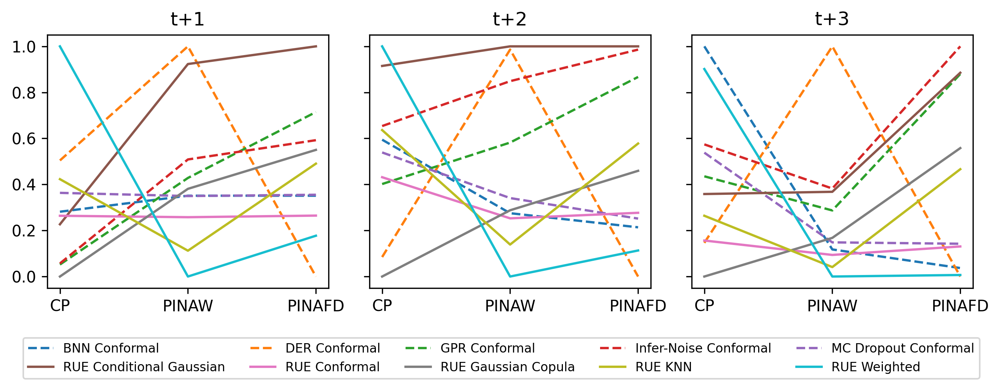

In [97]:
plot_pi_mean_metrics_parallel_coordinate(seed_list, save_fig=True)

#### Runtime

In [94]:
def analyse_runtime():
    categories = ["Training", "Predicting", "PI"]
    time_df = pd.read_csv(fp_time_log, header=None)
    time_df.columns = ["Seed", "Description", "Time/s"]
    time_df = time_df.drop_duplicates(keep="last")
    time_series = time_df.groupby(by=["Description"])["Time/s"].mean()
    category_values = [category for op in time_series.index for category in categories if category in op]
    output_df = pd.DataFrame({"Category": category_values, "Operation":time_series.index, "Time/s": time_series.values})
    return output_df.sort_values(by=["Category", "Time/s"]).set_index(["Category", "Operation"])

runtime_df = analyse_runtime()
display(runtime_df)
runtime_df.to_csv(os.path.join(fp_project_consolidated_results, "runtime.csv"))

Time/s
Category   Operation                                       
PI         Conformal PI                            0.003200
           Conditional PI                          0.034168
           Copula PI                               0.239173
           KNN PI                                  0.239504
           Weighted PI                             0.657593
Predicting Predicting with DER                     0.007817
           Predicting with Decoder + Predictor     0.012669
           Predicting with GPR                     0.031276
           Predicting with Infer-Noise             0.037947
           Predicting with MC Dropout              0.076076
           Predicting with BNN                    37.937710
Training   Training Encoder and Predictor         14.934192
           Training Decoder                       67.254121
           Training GPR                           69.507657
           Training DER                          167.728610
           Training BNN                         2284.444069